In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis
from itertools import combinations

In [3]:
import scipy.stats as stats
import math

In [4]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [5]:
l = [0.01,0.1,0.2,0.3,0.5]
livetime = [25,20,10,8,5,4,2,1] * u.h
n_obs = [40,50,100,125,200,250,500,1000]
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 31), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [6]:
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
rows, cols = (8, 6) 
model = [[0 for i in range(cols)] for j in range(rows)]
print(model) 

[[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]]


In [8]:
for i in range(8):
    model_simu = PowerLawSpectralModel(
        index=2.22,
        amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
        reference=1 * u.TeV,
    )
    print(model_simu) 
    mod = SkyModel(spectral_model=model_simu)
    model[i][0]=mod

PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --

In [9]:
simu = []
for j in range(5):
    for i in range(8):
        sim = ExpCutoffPowerLawSpectralModel(
            index=2.22,
            amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
            reference=1 * u.TeV,
            lambda_=l[j] * u.Unit("TeV-1"),
            alpha = 2,
        )
        mod = SkyModel(spectral_model=sim)
        model[i][j+1]=mod
    simu.append(sim)
    print(simu[j])

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.000e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.000e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    inde

In [10]:
obs = [[0 for i in range(cols)] for j in range(rows)]
for j in range(6):
    for i in range(8):
        obs[i][j]=Observation.create(pointing=pointing, livetime=livetime[i], irfs=irfs)
        print(obs[i][j])

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 90000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 72000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 36000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 28800.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 18000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 14400.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 7200.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 3600.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 90000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 72000.0 s

Info for OBS


Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 28800.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 18000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 14400.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 7200.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 3600.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 90000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 72000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 36000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 28800.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 18000.0 s

Info for OB

In [11]:
dataset = [[0 for i in range(cols)] for j in range(rows)]
for j in range(6):
    for i in range(8):
        dataset_empty = SpectrumDataset.create(
            e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
        )
        maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
        dataset[i][j]=maker.run(dataset_empty, obs[i][j])
        print(dataset[i][j])

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 10577.82

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 9.00e+04 s

    Number of total bins            : 0 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 8462.25

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 7.20e+04 s

    Number of total bins            : 0 
    Number of fit bins 

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 846.23

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 7.20e+03 s

    Number of total bins            : 0 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 423.11

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 3.60e+03 s

    Number of total bins            : 0 
    Number of fit bins    

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 846.23

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 7.20e+03 s

    Number of total bins            : 0 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 423.11

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 3.60e+03 s

    Number of total bins            : 0 
    Number of fit bins    

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 1692.45

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.44e+04 s

    Number of total bins            : 0 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 846.23

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 7.20e+03 s

    Number of total bins            : 0 
    Number of fit bins   

In [12]:
data = [[0 for i in range(cols)] for j in range(rows)]
for j in range(6):
    for i in range(8):
        dataset[i][j].model = model[i][j]
        dataset[i][j].fake(random_state=42)
        print(dataset[i][j])
        data[i][j]=dataset[i][j]

SpectrumDataset

    Name                            : 1 

    Total counts                    : 10556 
    Total predicted counts          : nan
    Total background counts         : 10577.82

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 9.00e+04 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : 8444 
    Total predicted counts          : nan
    Total background counts         : 8462.25

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 7.20e+04 s

    Number of total bins            : 9 
    Number of fit bi

SpectrumDataset

    Name                            : 1 

    Total counts                    : 10556 
    Total predicted counts          : nan
    Total background counts         : 10577.82

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 9.00e+04 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : 8444 
    Total predicted counts          : nan
    Total background counts         : 8462.25

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 7.20e+04 s

    Number of total bins            : 9 
    Number of fit bi

In [13]:
data_onoff = [[0 for i in range(cols)] for j in range(rows)]
for j in range(6):
    for i in range(8):
        dataset_onoff = SpectrumDatasetOnOff(
            aeff=data[i][j].aeff,
            edisp=data[i][j].edisp,
            models=model[i][j],
            livetime=livetime[i],
            acceptance=1,
            acceptance_off=5,
        )
        dataset_onoff.fake(background_model=data[i][j].background)
        print(dataset_onoff)
        data_onoff[i][j]=dataset_onoff

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 19562 
    Total predicted counts          : 19389.79
    Total off counts                : 52871.00

    Total background counts         : 10574.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 2.50e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.66

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 15353 
    Total predicted counts          : 15560.27
    Total off counts                : 42539.00

    Total background counts         : 8507.80

    E

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 1533 
    Total predicted counts          : 1551.62
    Total off counts                : 4240.00

    Total background counts         : 848.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 807 
    Total predicted counts          : 780.41
    Total off counts                : 2143.00

    Total background counts         : 428.60

    Effective ar

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 3702 
    Total predicted counts          : 3705.60
    Total off counts                : 10485.00

    Total background counts         : 2097.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 5.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 2895 
    Total predicted counts          : 2988.88
    Total off counts                : 8510.00

    Total background counts         : 1702.00

    Effecti

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 14371 
    Total predicted counts          : 14361.37
    Total off counts                : 42747.00

    Total background counts         : 8549.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 2.00e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 7086 
    Total predicted counts          : 7154.99
    Total off counts                : 21245.00

    Total background counts         : 4249.00

    Effe

In [14]:
%%time
datas = [[0 for i in range(cols)] for j in range(rows)]
for j in range(6):
    for i in range(8):
        datasets = []
        for idx in range(n_obs[i]):
            data_onoff[i][j].fake(random_state=idx, background_model=data[i][j].background)
            data_onoff[i][j].name = f"obs_{idx}"
            datasets.append(data_onoff[i][j].copy())
        datas[i][j]=datasets

CPU times: user 50 s, sys: 335 ms, total: 50.3 s
Wall time: 50.3 s


In [15]:
print(*datas[0][0], sep = "\n")
print(*datas[7][5], sep = "\n")

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 19366 
    Total predicted counts          : 19317.59
    Total off counts                : 52510.00

    Total background counts         : 10502.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 2.50e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.28

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 19217 
    Total predicted counts          : 19351.39
    Total off counts                : 52679.00

    Total background counts         : 105

SpectrumDatasetOnOff

    Name                            : obs_24 

    Total counts                    : 19557 
    Total predicted counts          : 19405.79
    Total off counts                : 52951.00

    Total background counts         : 10590.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 2.50e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.65

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_25 

    Total counts                    : 19369 
    Total predicted counts          : 19432.79
    Total off counts                : 53086.00

    Total background counts         : 10

SpectrumDatasetOnOff

    Name                            : obs_13 

    Total counts                    : 679 
    Total predicted counts          : 709.00
    Total off counts                : 2092.00

    Total background counts         : 418.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_14 

    Total counts                    : 727 
    Total predicted counts          : 702.00
    Total off counts                : 2057.00

    Total background counts         : 411.40

    Ef

SpectrumDatasetOnOff

    Name                            : obs_40 

    Total counts                    : 692 
    Total predicted counts          : 711.80
    Total off counts                : 2106.00

    Total background counts         : 421.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_41 

    Total counts                    : 709 
    Total predicted counts          : 720.40
    Total off counts                : 2149.00

    Total background counts         : 429.80

    Ef

SpectrumDatasetOnOff

    Name                            : obs_73 

    Total counts                    : 695 
    Total predicted counts          : 711.60
    Total off counts                : 2105.00

    Total background counts         : 421.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_74 

    Total counts                    : 723 
    Total predicted counts          : 709.20
    Total off counts                : 2093.00

    Total background counts         : 418.60

    Ef

SpectrumDatasetOnOff

    Name                            : obs_104 

    Total counts                    : 675 
    Total predicted counts          : 699.40
    Total off counts                : 2044.00

    Total background counts         : 408.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_105 

    Total counts                    : 712 
    Total predicted counts          : 709.40
    Total off counts                : 2094.00

    Total background counts         : 418.80

    

SpectrumDatasetOnOff

    Name                            : obs_128 

    Total counts                    : 685 
    Total predicted counts          : 713.80
    Total off counts                : 2116.00

    Total background counts         : 423.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_129 

    Total counts                    : 751 
    Total predicted counts          : 698.80
    Total off counts                : 2041.00

    Total background counts         : 408.20

   

SpectrumDatasetOnOff

    Name                            : obs_157 

    Total counts                    : 716 
    Total predicted counts          : 706.60
    Total off counts                : 2080.00

    Total background counts         : 416.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_158 

    Total counts                    : 727 
    Total predicted counts          : 702.20
    Total off counts                : 2058.00

    Total background counts         : 411.60

    

SpectrumDatasetOnOff

    Name                            : obs_188 

    Total counts                    : 703 
    Total predicted counts          : 703.20
    Total off counts                : 2063.00

    Total background counts         : 412.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_189 

    Total counts                    : 751 
    Total predicted counts          : 716.00
    Total off counts                : 2127.00

    Total background counts         : 425.40

    

SpectrumDatasetOnOff

    Name                            : obs_221 

    Total counts                    : 710 
    Total predicted counts          : 710.60
    Total off counts                : 2100.00

    Total background counts         : 420.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_222 

    Total counts                    : 722 
    Total predicted counts          : 714.20
    Total off counts                : 2118.00

    Total background counts         : 423.60

    

SpectrumDatasetOnOff

    Name                            : obs_249 

    Total counts                    : 737 
    Total predicted counts          : 716.60
    Total off counts                : 2130.00

    Total background counts         : 426.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_250 

    Total counts                    : 759 
    Total predicted counts          : 713.80
    Total off counts                : 2116.00

    Total background counts         : 423.20

    

SpectrumDatasetOnOff

    Name                            : obs_283 

    Total counts                    : 703 
    Total predicted counts          : 726.00
    Total off counts                : 2177.00

    Total background counts         : 435.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_284 

    Total counts                    : 664 
    Total predicted counts          : 708.00
    Total off counts                : 2087.00

    Total background counts         : 417.40

    

SpectrumDatasetOnOff

    Name                            : obs_315 

    Total counts                    : 653 
    Total predicted counts          : 721.00
    Total off counts                : 2152.00

    Total background counts         : 430.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_316 

    Total counts                    : 721 
    Total predicted counts          : 713.00
    Total off counts                : 2112.00

    Total background counts         : 422.40

   

SpectrumDatasetOnOff

    Name                            : obs_343 

    Total counts                    : 714 
    Total predicted counts          : 697.20
    Total off counts                : 2033.00

    Total background counts         : 406.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_344 

    Total counts                    : 697 
    Total predicted counts          : 710.40
    Total off counts                : 2099.00

    Total background counts         : 419.80

   

SpectrumDatasetOnOff

    Name                            : obs_369 

    Total counts                    : 754 
    Total predicted counts          : 714.40
    Total off counts                : 2119.00

    Total background counts         : 423.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_370 

    Total counts                    : 743 
    Total predicted counts          : 718.60
    Total off counts                : 2140.00

    Total background counts         : 428.00

   

SpectrumDatasetOnOff

    Name                            : obs_395 

    Total counts                    : 680 
    Total predicted counts          : 712.80
    Total off counts                : 2111.00

    Total background counts         : 422.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_396 

    Total counts                    : 688 
    Total predicted counts          : 713.80
    Total off counts                : 2116.00

    Total background counts         : 423.20

    

SpectrumDatasetOnOff

    Name                            : obs_421 

    Total counts                    : 735 
    Total predicted counts          : 706.80
    Total off counts                : 2081.00

    Total background counts         : 416.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_422 

    Total counts                    : 724 
    Total predicted counts          : 710.40
    Total off counts                : 2099.00

    Total background counts         : 419.80

    

SpectrumDatasetOnOff

    Name                            : obs_451 

    Total counts                    : 723 
    Total predicted counts          : 720.40
    Total off counts                : 2149.00

    Total background counts         : 429.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_452 

    Total counts                    : 743 
    Total predicted counts          : 714.60
    Total off counts                : 2120.00

    Total background counts         : 424.00

    

SpectrumDatasetOnOff

    Name                            : obs_481 

    Total counts                    : 737 
    Total predicted counts          : 707.80
    Total off counts                : 2086.00

    Total background counts         : 417.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_482 

    Total counts                    : 749 
    Total predicted counts          : 706.40
    Total off counts                : 2079.00

    Total background counts         : 415.80

    

SpectrumDatasetOnOff

    Name                            : obs_507 

    Total counts                    : 666 
    Total predicted counts          : 724.40
    Total off counts                : 2169.00

    Total background counts         : 433.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_508 

    Total counts                    : 689 
    Total predicted counts          : 715.40
    Total off counts                : 2124.00

    Total background counts         : 424.80

    

SpectrumDatasetOnOff

    Name                            : obs_532 

    Total counts                    : 706 
    Total predicted counts          : 709.60
    Total off counts                : 2095.00

    Total background counts         : 419.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_533 

    Total counts                    : 682 
    Total predicted counts          : 704.40
    Total off counts                : 2069.00

    Total background counts         : 413.80

    

SpectrumDatasetOnOff

    Name                            : obs_558 

    Total counts                    : 720 
    Total predicted counts          : 701.80
    Total off counts                : 2056.00

    Total background counts         : 411.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_559 

    Total counts                    : 697 
    Total predicted counts          : 725.20
    Total off counts                : 2173.00

    Total background counts         : 434.60

   

SpectrumDatasetOnOff

    Name                            : obs_587 

    Total counts                    : 730 
    Total predicted counts          : 707.80
    Total off counts                : 2086.00

    Total background counts         : 417.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_588 

    Total counts                    : 710 
    Total predicted counts          : 712.20
    Total off counts                : 2108.00

    Total background counts         : 421.60

    

SpectrumDatasetOnOff

    Name                            : obs_609 

    Total counts                    : 698 
    Total predicted counts          : 713.00
    Total off counts                : 2112.00

    Total background counts         : 422.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_610 

    Total counts                    : 705 
    Total predicted counts          : 712.60
    Total off counts                : 2110.00

    Total background counts         : 422.00

    

SpectrumDatasetOnOff

    Name                            : obs_627 

    Total counts                    : 717 
    Total predicted counts          : 704.40
    Total off counts                : 2069.00

    Total background counts         : 413.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_628 

    Total counts                    : 701 
    Total predicted counts          : 693.80
    Total off counts                : 2016.00

    Total background counts         : 403.20

    

SpectrumDatasetOnOff

    Name                            : obs_654 

    Total counts                    : 703 
    Total predicted counts          : 709.80
    Total off counts                : 2096.00

    Total background counts         : 419.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_655 

    Total counts                    : 741 
    Total predicted counts          : 708.60
    Total off counts                : 2090.00

    Total background counts         : 418.00

    

SpectrumDatasetOnOff

    Name                            : obs_685 

    Total counts                    : 721 
    Total predicted counts          : 716.40
    Total off counts                : 2129.00

    Total background counts         : 425.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_686 

    Total counts                    : 671 
    Total predicted counts          : 705.00
    Total off counts                : 2072.00

    Total background counts         : 414.40

    

SpectrumDatasetOnOff

    Name                            : obs_716 

    Total counts                    : 733 
    Total predicted counts          : 704.00
    Total off counts                : 2067.00

    Total background counts         : 413.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_717 

    Total counts                    : 703 
    Total predicted counts          : 708.60
    Total off counts                : 2090.00

    Total background counts         : 418.00

    

SpectrumDatasetOnOff

    Name                            : obs_744 

    Total counts                    : 732 
    Total predicted counts          : 706.00
    Total off counts                : 2077.00

    Total background counts         : 415.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_745 

    Total counts                    : 745 
    Total predicted counts          : 718.00
    Total off counts                : 2137.00

    Total background counts         : 427.40

    

SpectrumDatasetOnOff

    Name                            : obs_755 

    Total counts                    : 731 
    Total predicted counts          : 729.20
    Total off counts                : 2193.00

    Total background counts         : 438.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_756 

    Total counts                    : 695 
    Total predicted counts          : 719.40
    Total off counts                : 2144.00

    Total background counts         : 428.80

    

SpectrumDatasetOnOff

    Name                            : obs_770 

    Total counts                    : 733 
    Total predicted counts          : 702.00
    Total off counts                : 2057.00

    Total background counts         : 411.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_771 

    Total counts                    : 743 
    Total predicted counts          : 716.20
    Total off counts                : 2128.00

    Total background counts         : 425.60

    


SpectrumDatasetOnOff

    Name                            : obs_783 

    Total counts                    : 714 
    Total predicted counts          : 699.80
    Total off counts                : 2046.00

    Total background counts         : 409.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_784 

    Total counts                    : 731 
    Total predicted counts          : 706.40
    Total off counts                : 2079.00

    Total background counts         : 415.80

   

SpectrumDatasetOnOff

    Name                            : obs_800 

    Total counts                    : 726 
    Total predicted counts          : 697.60
    Total off counts                : 2035.00

    Total background counts         : 407.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_801 

    Total counts                    : 762 
    Total predicted counts          : 715.80
    Total off counts                : 2126.00

    Total background counts         : 425.20

    

SpectrumDatasetOnOff

    Name                            : obs_813 

    Total counts                    : 659 
    Total predicted counts          : 701.00
    Total off counts                : 2052.00

    Total background counts         : 410.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_814 

    Total counts                    : 696 
    Total predicted counts          : 704.00
    Total off counts                : 2067.00

    Total background counts         : 413.40

   

SpectrumDatasetOnOff

    Name                            : obs_830 

    Total counts                    : 736 
    Total predicted counts          : 715.60
    Total off counts                : 2125.00

    Total background counts         : 425.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_831 

    Total counts                    : 713 
    Total predicted counts          : 702.80
    Total off counts                : 2061.00

    Total background counts         : 412.20

   

SpectrumDatasetOnOff

    Name                            : obs_842 

    Total counts                    : 719 
    Total predicted counts          : 706.20
    Total off counts                : 2078.00

    Total background counts         : 415.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_843 

    Total counts                    : 685 
    Total predicted counts          : 705.60
    Total off counts                : 2075.00

    Total background counts         : 415.00

    

SpectrumDatasetOnOff

    Name                            : obs_858 

    Total counts                    : 712 
    Total predicted counts          : 708.00
    Total off counts                : 2087.00

    Total background counts         : 417.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_859 

    Total counts                    : 705 
    Total predicted counts          : 707.80
    Total off counts                : 2086.00

    Total background counts         : 417.20

    

SpectrumDatasetOnOff

    Name                            : obs_870 

    Total counts                    : 709 
    Total predicted counts          : 703.40
    Total off counts                : 2064.00

    Total background counts         : 412.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_871 

    Total counts                    : 738 
    Total predicted counts          : 717.00
    Total off counts                : 2132.00

    Total background counts         : 426.40

    

SpectrumDatasetOnOff

    Name                            : obs_891 

    Total counts                    : 690 
    Total predicted counts          : 721.60
    Total off counts                : 2155.00

    Total background counts         : 431.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_892 

    Total counts                    : 719 
    Total predicted counts          : 713.80
    Total off counts                : 2116.00

    Total background counts         : 423.20

    

SpectrumDatasetOnOff

    Name                            : obs_903 

    Total counts                    : 657 
    Total predicted counts          : 719.80
    Total off counts                : 2146.00

    Total background counts         : 429.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_904 

    Total counts                    : 674 
    Total predicted counts          : 720.60
    Total off counts                : 2150.00

    Total background counts         : 430.00

   

SpectrumDatasetOnOff

    Name                            : obs_916 

    Total counts                    : 784 
    Total predicted counts          : 711.40
    Total off counts                : 2104.00

    Total background counts         : 420.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_917 

    Total counts                    : 706 
    Total predicted counts          : 717.80
    Total off counts                : 2136.00

    Total background counts         : 427.20

   

SpectrumDatasetOnOff

    Name                            : obs_930 

    Total counts                    : 710 
    Total predicted counts          : 729.80
    Total off counts                : 2196.00

    Total background counts         : 439.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_931 

    Total counts                    : 733 
    Total predicted counts          : 710.40
    Total off counts                : 2099.00

    Total background counts         : 419.80

    

SpectrumDatasetOnOff

    Name                            : obs_954 

    Total counts                    : 713 
    Total predicted counts          : 716.80
    Total off counts                : 2131.00

    Total background counts         : 426.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_955 

    Total counts                    : 710 
    Total predicted counts          : 720.60
    Total off counts                : 2150.00

    Total background counts         : 430.00

    

SpectrumDatasetOnOff

    Name                            : obs_970 

    Total counts                    : 731 
    Total predicted counts          : 721.00
    Total off counts                : 2152.00

    Total background counts         : 430.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_971 

    Total counts                    : 657 
    Total predicted counts          : 720.00
    Total off counts                : 2147.00

    Total background counts         : 429.40

    

SpectrumDatasetOnOff

    Name                            : obs_981 

    Total counts                    : 726 
    Total predicted counts          : 715.60
    Total off counts                : 2125.00

    Total background counts         : 425.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_982 

    Total counts                    : 683 
    Total predicted counts          : 712.60
    Total off counts                : 2110.00

    Total background counts         : 422.00

   

/home/rishank/anaconda2/envs/gammapy-0.15/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


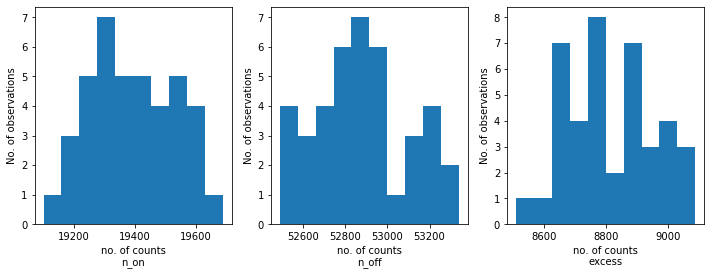

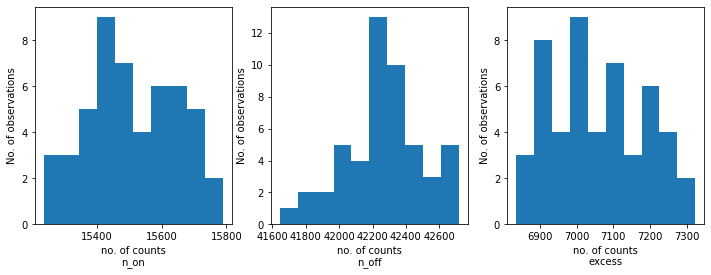

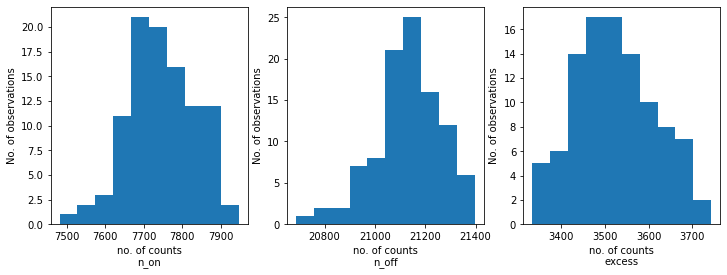

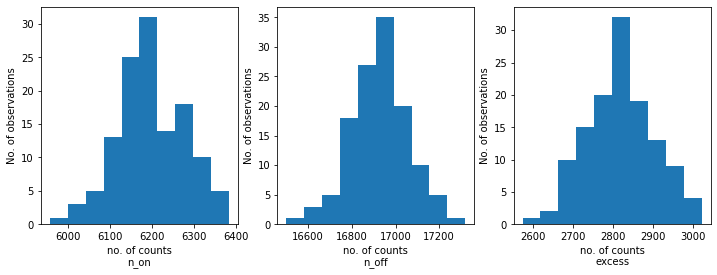

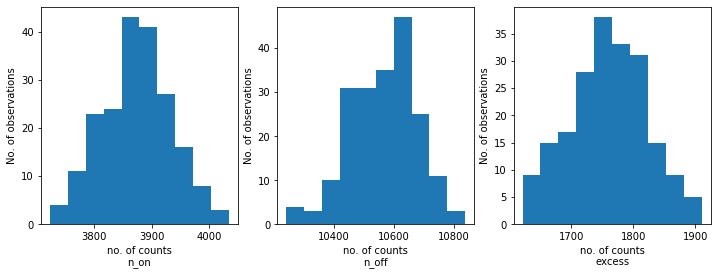

...

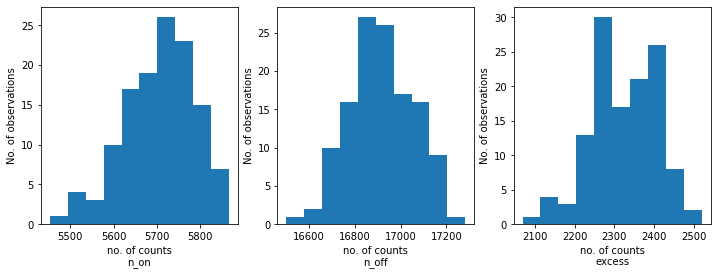

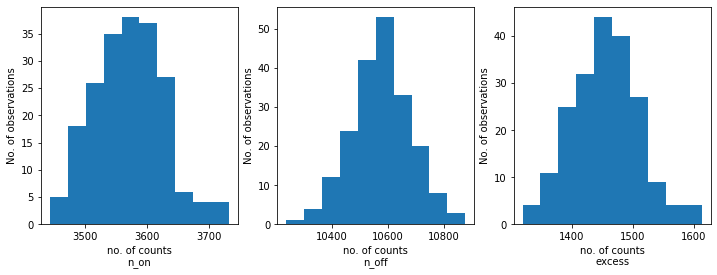

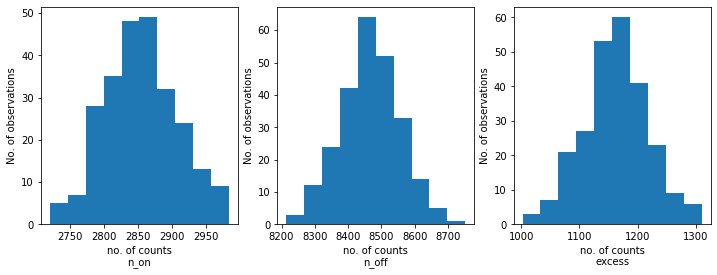

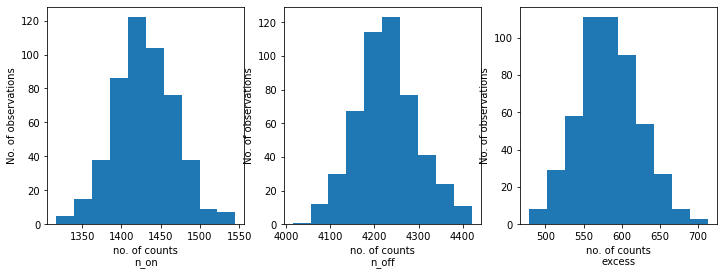

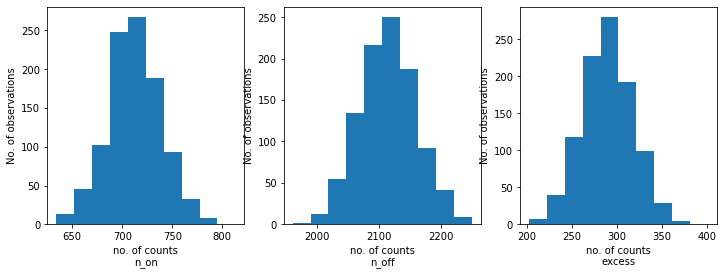

In [16]:
for j in range(6):
    for i in range(8):
        n_on = [dataset.counts.data.sum() for dataset in datas[i][j]]
        n_off = [dataset.counts_off.data.sum() for dataset in datas[i][j]]
        excess = [dataset.excess.data.sum() for dataset in datas[i][j]]
        
        fix, axes = plt.subplots(1, 3, figsize=(12, 4))
        axes[0].hist(n_on)
        axes[0].set_xlabel("no. of counts\nn_on")
        axes[0].set_ylabel("No. of observations")
        axes[1].hist(n_off)
        axes[1].set_xlabel("no. of counts\nn_off")
        axes[1].set_ylabel("No. of observations")
        axes[2].hist(excess)
        axes[2].set_xlabel("no. of counts\nexcess");
        axes[2].set_ylabel("No. of observations")

In [17]:
%%time
res = [[0 for i in range(cols)] for j in range(rows)]
for i in range(8):
    results = []
    for dataset in datas[i][0]:
        dataset.models = model[i][0].copy()
        fit = Fit([dataset])
        result = fit.optimize()
        results.append(
            {
                "index": result.parameters["index"].value,
                "amplitude": result.parameters["amplitude"].value,
                "reference":result.parameters["reference"].value,
            }
        )
        print(result.parameters.to_table())
    res[i][0]=results

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.302e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.308e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.312e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.280e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.295e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.294e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.275e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.326e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.327e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.316e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.261e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.322e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.308e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.238e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.271e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.354e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.255e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.291e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.167e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.247e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.339e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.356e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.307e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.346e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.331e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.295e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.334e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.276e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.260e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.228e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.256e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.182e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.253e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.317e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.267e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.252e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.347e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.237e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.347e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.344e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.336e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.199e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.317e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.218e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.217e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.314e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.386e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.141e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.395e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.272e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.345e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.214e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.314e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.173e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.199e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.170e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.247e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.332e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.252e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.252e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.300e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.183e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.294e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.260e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.367e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.185e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.297e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.234e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.134e+00   nan                nan nan  False
amplitude 1.375e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.268e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.286e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.230e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.365e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.370e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.298e+00   nan                nan nan  False
amplitude 1.237e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.330e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.153e+00   nan                nan nan  False
amplitude 1.466e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.389e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.348e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.455e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.427e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.270e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.219e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.298e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.274e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.324e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan  False
amplitude 1.226e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.291e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.281e+00   nan                nan nan  False
amplitude 1.224e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.419e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.359e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.339e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.230e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.367e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.147e+00   nan                nan nan  False
amplitude 1.391e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.356e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.216e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.170e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.253e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.289e+00   nan                nan nan  False
amplitude 1.287e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.349e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.262e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.297e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.194e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.355e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.260e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.248e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.105e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.387e+00   nan                nan nan  False
amplitude 1.074e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.239e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.364e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.414e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.152e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.488e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.262e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.342e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.163e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.136e+00   nan                nan nan  False
amplitude 1.120e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.226e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.184e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.249e+00   nan                nan nan  False
amplitude 1.357e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.240e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.323e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.371e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.268e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.359e+00   nan                nan nan  False
amplitude 1.042e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan  False
amplitude 1.345e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.286e+00   nan                nan nan  False
amplitude 1.237e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.254e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.156e+00   nan                nan nan  False
amplitude 1.128e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.314e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.249e+00   nan                nan nan  False
amplitude 1.323e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.331e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.111e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.137e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.254e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.270e+00   nan                nan nan  False
amplitude 1.247e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.244e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.275e+00   nan                nan nan  False
amplitude 1.237e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.296e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.222e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.348e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.282e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.164e+00   nan                nan nan  False
amplitude 1.417e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan  False
amplitude 1.117e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.312e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.139e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.148e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.440e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.306e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.202e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.291e+00   nan                nan nan  False
amplitude 1.271e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.373e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.330e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.114e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.233e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.086e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.120e+00   nan                nan nan  False
amplitude 1.235e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.077e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.355e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.283e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.353e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.301e+00   nan                nan nan  False
amplitude 1.115e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.194e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.249e+00   nan                nan nan  False
amplitude 1.178e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.401e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.331e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.182e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan

In [18]:
for j in range(5):
    for i in range(8):
        results = []
        for dataset in datas[i][j+1]:
            dataset.models = model[i][j+1].copy()
            fit = Fit([dataset])
            result = fit.optimize()
            results.append(
                {
                    "index": result.parameters["index"].value,
                    "amplitude": result.parameters["amplitude"].value,
                    "lambda_": result.parameters["lambda_"].value,
                    "reference":result.parameters["reference"].value,
                    "alpha":result.parameters["alpha"].value,
                }
            )
            print(result.parameters.to_table())
        res[i][j+1]=results

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.326e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.398e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.262e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.217e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.254e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.596e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.538e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.307e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.656e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.470e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.287e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.236e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.385e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.253e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.280e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.356e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.887e-06   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.332e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.317e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.545e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.215e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.671e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.276e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.260e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.074e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.335e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.325e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.294e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.022e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.253e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.117e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.217e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.302e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.291e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.424e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.306e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.857e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.211e+00   nan                nan nan  False
amplitude  1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -9.774e-06   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.290e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.321e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.252e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.188e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.591e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.275e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.183e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.293e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.873e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.296e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.423e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.561e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.262e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.019e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.262e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.444e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.492e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.247e+00   nan                nan nan  False
amplitude  1.224e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.363e-06   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.842e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.098e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.255e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.864e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.512e-06   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.358e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.728e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.237e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.565e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.371e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.897e-06   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.472e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.294e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.157e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.244e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.743e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.272e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.292e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.507e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.530e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.208e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.468e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.354e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.544e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.282e+00   nan                nan nan  False
amplitude 1.262e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.211e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.199e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.185e+00   nan                nan nan  False
amplitude 1.369e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.699e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.244e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.319e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.763e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.081e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.273e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.444e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.082e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.323e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.242e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.790e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.403e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.668e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.314e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.185e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.234e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.264e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.273e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.499e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.357e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.877e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.301e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.886e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.332e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.512e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.216e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.609e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.228e+00   nan                nan nan  False
amplitude  1.266e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -9.689e-06   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.252e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.868e-06   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.319e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.351e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.334e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.227e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.986e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.351e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.752e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.300e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.216e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.271e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.899e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.323e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.440e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.255e+00   nan                nan nan  False
amplitude  1.308e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -4.331e-06   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.223e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.001e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.608e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.185e+00   nan                nan nan  False
amplitude 1.376e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.283e+00   nan                nan nan  False
amplitude 1.275e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.258e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.183e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.729e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.297e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.254e+00   nan                nan nan  False
amplitude  1.362e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.781e-05   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.328e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.042e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.201e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.101e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.402e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.138e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.436e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.319e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.424e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.004e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.201e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.300e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.299e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.898e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.681e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.015e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.224e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.209e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.461e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.439e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.513e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.150e+00   nan                nan nan  False
amplitude 1.356e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.204e+00   nan                nan nan  False
amplitude  1.339e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.589e-05   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.319e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.626e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.202e+00   nan                nan nan  False
amplitude  1.316e-12   nan cm-2 s-1 Te

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.302e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.499e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.153e+00   nan                nan nan  False
amplitude 1.342e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.441e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.271e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.231e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.652e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.249e+00   nan                nan nan  False
amplitude  1.376e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.268e-05   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.762e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.350e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.318e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.221e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.244e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.164e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.361e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.068e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.153e+00   nan                nan nan  False
amplitude  1.355e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.240e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.371e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.351e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.957e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.203e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.199e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.468e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.053e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.138e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.402e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.368e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.220e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.387e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.093e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.885e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.141e+00   nan                nan nan  False
amplitude 1.401e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.212e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.176e+00   nan                nan nan  False
amplitude 1.413e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.362e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.804e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.309e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.031e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.312e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.410e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.091e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.191e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.881e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.142e+00   nan                nan nan  False
amplitude 1.296e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.847e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.367e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.205e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.595e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.176e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.245e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.358e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.356e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.334e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.255e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.167e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.174e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.015e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.232e+00   nan                nan nan  False
amplitude  1.243e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -2.264e-07   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.379e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.253e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.753e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.765e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.247e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.377e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.831e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.075e+00   nan                nan nan  False
amplitude 1.341e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.749e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.343e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.246e+00   nan                nan nan  False
amplitude  1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -8.915e-05   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.286e+00   nan                nan nan  False
amplitude 1.056e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.859e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.122e+00   nan                nan nan  False
amplitude 1.351e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.491e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.294e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.977e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.229e+00   nan                nan nan  False
amplitude  1.268e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.270e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.695e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.277e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.373e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.368e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.241e+00   nan                nan nan  False
amplitude  1.244e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -6.646e-05   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.832e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.287e+00   nan                nan nan  False
amplitude 1.214e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.233e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.141e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.108e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.775e-06   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.327e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.128e+00   nan                nan nan  False
amplitude 1.436e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.604e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.124e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.278e-04   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.309e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.275e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.398e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.878e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.293e+00   nan                nan nan  False
amplitude 1.166e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.243e+00   nan                nan nan  False
amplitude  1.369e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -5.698e-06   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.224e+00   nan                nan nan  False
amplitude  1.207e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -9.786e-07   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.174e+00   nan                nan nan  False
amplitude 1.340e-12   nan cm-2 s-1

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.361e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.291e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.878e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.151e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.201e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.220e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.120e+00   nan                nan nan  False
amplitude 1.353e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.635e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.099e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.094e+00   nan                nan nan  False
amplitude 1.467e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.363e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.268e+00   nan                nan nan  False
amplitude 1.347e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.501e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.133e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.601e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.129e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.975e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.314e+00   nan                nan nan  False
amplitude 1.169e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.941e-04   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.212e+00   nan                nan nan  False
amplitude  1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -3.131e-06   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.440e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.443e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.472e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.190e+00   nan                nan nan  False
amplitude  1.222e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.429e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.788e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.325e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.173e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.172e+00   nan                nan nan  False
amplitude 1.349e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.287e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.121e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.225e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.604e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.316e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.268e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.895e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.255e+00   nan                nan nan  False
amplitude  1.226e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.391e-05   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.237e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.232e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.799e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.314e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.734e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.448e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.177e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.244e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.368e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.372e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.142e+00   nan                nan nan  False
amplitude 1.406e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.309e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.757e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.401e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.611e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.262e+00   nan                nan nan  False
amplitude  1.391e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.262e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.269e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.335e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.020e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.092e+00   nan                nan nan  False
amplitude 1.438e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.131e+00   nan                nan nan  False
amplitude 1.410e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.475e-04   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.402e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.820e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.156e+00   nan                nan nan  False
amplitude 1.300e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.273e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.336e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.145e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.513e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.453e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.233e+00   nan                nan nan  False
amplitude  1.206e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -2.826e-07   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.236e+00   nan                nan nan  False
amplitude  1.428e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -5.941e-06   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.156e+00   nan                nan nan  False
amplitude  1.301e-12   nan cm-2

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.459e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.298e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.019e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.177e+00   nan                nan nan  False
amplitude  1.410e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.387e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.404e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.283e+00   nan                nan nan  False
amplitude  1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -7.632e-05   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.148e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.298e+00   nan                nan nan  False
amplitude 1.239e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.750e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.268e+00   nan                nan nan  False
amplitude 1.224e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.457e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.268e+00   nan                nan nan  False
amplitude 1.301e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.083e+00   nan                nan nan  False
amplitude 1.365e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.856e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.157e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.646e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.478e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.277e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.053e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.148e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.674e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.208e+00   nan                nan nan  False
amplitude  1.423e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.301e+00   nan                nan nan  False
amplitude 1.147e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.350e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.039e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.072e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.308e+00   nan                nan nan  False
amplitude 1.177e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.126e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.454e-06   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.295e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.176e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.357e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.131e+00   nan                nan nan  False
amplitude 1.208e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.903e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.802e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.282e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.206e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.156e-04   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.193e+00   nan                nan nan  False
amplitude  1.139e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.120e-05   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.115e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.132e+00   nan                nan nan  False
amplitude 1.576e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.720e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.174e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.428e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.156e+00   nan                nan nan  False
amplitude 1.656e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.347e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.142e+00   nan                nan nan  False
amplitude 1.405e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.161e-06   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.203e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.099e-04   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.559e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.322e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.417e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.644e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.267e+00   nan                nan nan  False
amplitude  1.274e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -5.228e-05   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.292e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.141e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.569e-06   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan  False
amplitude 1.348e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.629e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.399e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.269e+00   nan                nan nan  False
amplitude 1.214e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.634e-06   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.271e+00   nan                nan nan  False
amplitude  1.227e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -1.067e-05   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.154e+00   nan                nan nan  False
amplitude 1.417e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.971e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.348e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.255e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.309e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.356e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.811e-05   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.365e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.243e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.396e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.179e+00   nan                nan nan  False
amplitude  1.186e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -6.857e-05   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.170e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.861e-06   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.367e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.688e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.173e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.192e-03   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.203e+00   nan                nan nan  False
amplitude  1.278e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.227e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.496e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.152e+00   nan                nan nan  False
amplitude 1.476e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.523e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.223e+00   nan                nan nan  False
amplitude  1.040e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -7.942e-05   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.323e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.550e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.184e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.602e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.324e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.063e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.261e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.494e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.275e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.808e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.138e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.748e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.111e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.309e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.078e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.268e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.235e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.677e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.290e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.455e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.330e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.502e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.307e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.089e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.238e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.270e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.014e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.246e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.765e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.262e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.349e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.047e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.084e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.259e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.233e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.013e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.055e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.232e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.207e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.277e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.917e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.312e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.280e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.069e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.182e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.325e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.162e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.346e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.115e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.271e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.065e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.246e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.167e+00   nan                nan nan  False
amplitude 1.377e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.359e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.228e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.455e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.618e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.259e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.363e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.375e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.362e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.237e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.244e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.697e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.325e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.597e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.336e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.354e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.186e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.420e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.365e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.302e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.032e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.276e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.104e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.224e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.319e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.591e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.323e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.396e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.220e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.254e+00   nan                nan nan  False
amplitude 1.174e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.699e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.199e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.914e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.371e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.297e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.824e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.271e+00   nan                nan nan  False
amplitude 1.230e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.820e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.342e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.359e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.168e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.854e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.268e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.194e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.086e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.269e+00   nan                nan nan  False
amplitude 1.259e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.109e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.204e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.319e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.040e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.309e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.142e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.167e+00   nan                nan nan  False
amplitude 1.399e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.972e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.238e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.049e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.287e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.306e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.192e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.325e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.045e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.216e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.146e+00   nan                nan nan  False
amplitude 1.466e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.484e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.254e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.806e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.332e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.382e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.261e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.331e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.025e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.321e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.296e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.187e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.166e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.382e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.392e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.453e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.402e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.250e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.344e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.368e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.077e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.347e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.210e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.219e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.290e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.019e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.364e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.308e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.322e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.183e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.244e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.254e+00   nan                nan nan  False
amplitude 1.207e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.638e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.186e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.468e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.270e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.270e+00   nan                nan nan  False
amplitude 1.183e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.784e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.361e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.410e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.874e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.300e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.683e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.296e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.352e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.033e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.421e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.339e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.387e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.299e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.852e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.217e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.239e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.041e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.461e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.364e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.179e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.114e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.141e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.098e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.107e+00   nan                nan nan  False
amplitude 1.407e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.387e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.222e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.056e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.300e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.306e+00   nan                nan nan  False
amplitude 1.228e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.523e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.374e+00   nan                nan nan  False
amplitude 1.077e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.822e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.421e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.309e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.278e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.112e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.302e+00   nan                nan nan  False
amplitude 1.164e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.010e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.160e+00   nan                nan nan  False
amplitude 1.359e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.582e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.151e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.172e+00   nan                nan nan  False
amplitude 1.404e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.078e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.154e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.242e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.350e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.235e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.143e+00   nan                nan nan  False
amplitude 1.342e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.025e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.368e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.173e+00   nan                nan nan  False
amplitude 1.517e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.167e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.297e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.449e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.149e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.354e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.136e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.226e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.075e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.351e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.235e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.095e+00   nan                nan nan  False
amplitude 1.465e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.313e+00   nan                nan nan  False
amplitude 1.267e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.096e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.183e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.431e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.185e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.169e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.448e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.376e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.275e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.662e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.142e+00   nan                nan nan  False
amplitude 1.440e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.215e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.271e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.185e+00   nan                nan nan  False
amplitude 1.228e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.213e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.199e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.133e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.149e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.290e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.973e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.159e+00   nan                nan nan  False
amplitude 1.381e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.179e+00   nan                nan nan  False
amplitude 1.480e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.342e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.145e+00   nan                nan nan  False
amplitude 1.371e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.048e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.219e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.125e+00   nan                nan nan  False
amplitude 1.540e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.354e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.419e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.210e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.139e+00   nan                nan nan  False
amplitude 1.335e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.419e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.286e+00   nan                nan nan  False
amplitude 1.222e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.113e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.314e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.077e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.652e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.126e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.059e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.293e+00   nan                nan nan  False
amplitude 1.119e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.315e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.107e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan  False
amplitude 1.331e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.031e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.413e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.176e+00   nan                nan nan  False
amplitude 1.223e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.790e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.220e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.189e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.302e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.415e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.435e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.128e+00   nan                nan nan  False
amplitude 1.552e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.414e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.350e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.133e+00   nan                nan nan  False
amplitude 1.132e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.064e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.097e+00   nan                nan nan  False
amplitude 1.414e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.213e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.151e+00   nan                nan nan  False
amplitude 1.389e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.342e+00   nan                nan nan  False
amplitude 1.175e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.457e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.367e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.415e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.343e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.202e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.936e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.310e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.015e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.235e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.140e+00   nan                nan nan  False
amplitude 1.181e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.479e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.150e+00   nan                nan nan  False
amplitude 1.141e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.559e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.254e+00   nan                nan nan  False
amplitude 1.373e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.130e+00   nan                nan nan  False
amplitude 1.426e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.197e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.143e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.659e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.488e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.132e+00   nan                nan nan  False
amplitude 1.529e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.567e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.522e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.242e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.303e+00   nan                nan nan  False
amplitude 1.207e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.428e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.566e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.125e+00   nan                nan nan  False
amplitude 1.421e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.369e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.175e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.311e+00   nan                nan nan  False
amplitude 1.196e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.255e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.083e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.501e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan  False
amplitude 1.440e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.088e+00   nan                nan nan  False
amplitude 1.465e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.402e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.109e+00   nan                nan nan  False
amplitude 1.341e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.218e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.117e+00   nan                nan nan  False
amplitude 1.372e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.979e+00   nan                nan nan  False
amplitude 1.827e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.628e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.302e+00   nan                nan nan  False
amplitude 1.286e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.709e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.322e+00   nan                nan nan  False
amplitude 1.177e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.240e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.354e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.152e+00   nan                nan nan  False
amplitude 1.364e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.185e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.407e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.403e+00   nan                nan nan  False
amplitude 1.153e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.321e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.297e+00   nan                nan nan  False
amplitude 1.115e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.207e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.229e+00   nan                nan nan  False
amplitude  9.048e-13   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.281e+00   nan                nan nan  False
amplitude 1.235e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.101e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.158e+00   nan                nan nan  False
amplitude 1.485e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.330e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.303e+00   nan                nan nan  False
amplitude 1.196e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.949e+00   nan                nan nan  False
amplitude 1.738e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.970e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.486e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.134e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.151e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.449e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.767e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.154e+00   nan                nan nan  False
amplitude 1.399e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.743e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.156e+00   nan                nan nan  False
amplitude 1.399e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.144e+00   nan                nan nan  False
amplitude 1.219e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.163e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.259e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.301e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.279e+00   nan                nan nan  False
amplitude 1.174e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.131e+00   nan                nan nan  False
amplitude 1.312e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.837e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.143e+00   nan                nan nan  False
amplitude 1.421e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.269e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.154e+00   nan                nan nan  False
amplitude 1.472e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.197e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.840e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.270e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.693e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.314e+00   nan                nan nan  False
amplitude 1.009e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.287e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.001e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.463e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.125e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.278e+00   nan                nan nan  False
amplitude 1.220e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.127e+00   nan                nan nan  False
amplitude 1.505e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.768e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.156e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.424e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.295e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.106e+00   nan                nan nan  False
amplitude 1.356e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.439e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.375e+00   nan                nan nan  False
amplitude 1.171e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.405e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.185e+00   nan                nan nan  False
amplitude 1.224e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.419e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.255e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.384e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.190e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.390e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.014e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.302e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.478e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.244e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.079e+00   nan                nan nan  False
amplitude 1.465e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.652e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.325e+00   nan                nan nan  False
amplitude 1.142e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.228e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.295e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.107e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.264e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.171e+00   nan                nan nan  False
amplitude  1.232e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00   nan            TeV nan nan   True
  lambda_ -6.327e-02   nan          TeV-1 nan nan  False
    alpha  2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.570e-12   nan cm-2 s-1 TeV-1 

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.462e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.158e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.470e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.674e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.315e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.504e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.951e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.059e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.210e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.361e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.092e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.160e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.037e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.156e+00   nan                nan nan  False
amplitude 1.365e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.101e+00   nan                nan nan  False
amplitude 1.196e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.060e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.276e+00   nan                nan nan  False
amplitude 1.102e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.763e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.171e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.307e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.163e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.031e+00   nan                nan nan  False
amplitude 1.555e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.597e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.364e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.179e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.327e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.066e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.276e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.146e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.146e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.303e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.313e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.284e+00   nan                nan nan  False
amplitude 1.324e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.334e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.037e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.310e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.192e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.184e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.264e+00   nan                nan nan  False
amplitude 1.155e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.134e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.128e+00   nan                nan nan  False
amplitude 1.701e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.250e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.400e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.292e+00   nan                nan nan  False
amplitude 1.226e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.955e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.292e+00   nan                nan nan  False
amplitude 1.400e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.287e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.287e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.166e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.956e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.099e+00   nan                nan nan  False
amplitude 1.522e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.758e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.130e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.340e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.142e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.104e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.150e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.294e+00   nan                nan nan  False
amplitude 1.075e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.175e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.356e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.139e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.003e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value    error      unit      min max frozen
--------- ---------- ----- -------------- --- --- ------
    index  2.182e+00   nan                nan nan  False
amplitude  1.272e-12   nan cm-2 s-1 TeV-1 nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.185e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.189e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.295e+00   nan                nan nan  False
amplitude 1.180e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.215e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.127e+00   nan                nan nan  False
amplitude 1.386e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.156e+00   nan                nan nan  False
amplitude 1.307e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.282e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.174e+00   nan                nan nan  False
amplitude 1.509e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.006e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.397e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.349e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.122e+00   nan                nan nan  False
amplitude 1.355e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.216e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.358e-12   nan cm-2 s-1 TeV-1 nan nan

/home/rishank/anaconda2/envs/gammapy-0.15/lib/python3.6/site-packages/numpy/core/fromnumeric.py:90: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.340e+00   nan                nan nan  False
amplitude 1.182e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.374e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.145e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.723e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.094e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.879e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.260e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.022e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.786e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.280e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.957e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.943e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.308e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.084e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.306e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.280e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.059e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.330e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.130e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.297e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.395e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.995e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.126e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.212e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.867e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.940e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.301e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.297e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.861e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.232e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.916e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.240e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.322e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.475e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.323e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.200e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.183e+00   nan                nan nan  False
amplitude 1.377e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.279e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.855e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.876e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.209e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.699e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.397e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.383e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.385e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.077e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.496e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.464e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.349e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.305e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.247e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.923e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.244e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.736e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.152e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.865e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.230e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.962e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.262e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.963e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.270e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.240e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.809e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.420e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.233e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.172e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.004e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan  False
amplitude 1.185e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.653e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.350e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.262e+00   nan                nan nan  False
amplitude 1.243e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.983e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.308e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.612e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.172e+00   nan                nan nan  False
amplitude 1.391e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.273e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.995e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.462e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.553e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.254e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.198e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.889e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.293e+00   nan                nan nan  False
amplitude 1.210e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.697e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.203e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.353e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.264e+00   nan                nan nan  False
amplitude 1.211e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.689e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.293e+00   nan                nan nan  False
amplitude 1.174e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.335e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.944e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.018e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.359e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.301e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.900e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.262e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.948e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.308e+00   nan                nan nan  False
amplitude 1.136e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.684e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.119e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.190e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.788e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.271e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.785e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.739e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.155e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.488e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.361e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.277e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.976e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.093e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.482e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.293e+00   nan                nan nan  False
amplitude 1.215e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.383e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.504e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.848e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.232e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.050e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.271e+00   nan                nan nan  False
amplitude 1.247e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.976e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.178e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.992e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.370e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.329e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.233e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.811e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.349e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.272e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.369e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.359e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.837e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.413e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.164e+00   nan                nan nan  False
amplitude 1.406e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.880e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.219e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.908e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.127e+00   nan                nan nan  False
amplitude 1.494e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.737e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.185e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.254e+00   nan                nan nan  False
amplitude 1.169e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.403e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.870e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.172e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.516e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.337e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.746e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.173e+00   nan                nan nan  False
amplitude 1.311e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.303e+00   nan                nan nan  False
amplitude 1.083e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.706e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.255e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.966e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.296e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.337e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.274e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.093e+00   nan                nan nan  False
amplitude 1.563e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.888e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.165e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.165e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.963e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.291e+00   nan                nan nan  False
amplitude 1.232e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.188e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.442e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.500e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.173e+00   nan                nan nan  False
amplitude 1.518e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.074e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.264e+00   nan                nan nan  False
amplitude 1.266e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.074e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.176e+00   nan                nan nan  False
amplitude 1.243e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.953e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.284e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.005e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.118e+00   nan                nan nan  False
amplitude 1.525e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.717e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.217e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.056e+00   nan                nan nan  False
amplitude 1.472e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.843e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.172e+00   nan                nan nan  False
amplitude 1.530e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.169e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.296e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.517e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.472e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.095e+00   nan                nan nan  False
amplitude 1.404e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.441e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.283e+00   nan                nan nan  False
amplitude 1.194e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan  False
amplitude 1.455e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.537e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.300e+00   nan                nan nan  False
amplitude 1.148e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.522e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.424e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.327e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.493e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.271e+00   nan                nan nan  False
amplitude 1.316e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.934e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.305e+00   nan                nan nan  False
amplitude 1.182e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.287e+00   nan                nan nan  False
amplitude 1.190e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.940e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.233e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.618e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.205e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.569e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.498e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.373e+00   nan                nan nan  False
amplitude 1.022e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.433e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.483e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.242e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.709e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.958e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.324e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.046e+00   nan                nan nan  False
amplitude 1.676e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.068e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.337e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.978e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.188e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.337e+00   nan                nan nan  False
amplitude 1.123e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.226e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.224e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.731e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.291e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.375e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.293e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.243e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.464e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.326e+00   nan                nan nan  False
amplitude 9.448e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.284e+00   nan                nan nan  False
amplitude 1.155e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.869e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.483e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.495e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.393e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.069e+00   nan                nan nan  False
amplitude 1.573e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.264e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.423e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.765e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan  False
amplitude 1.223e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.340e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.538e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.144e+00   nan                nan nan  False
amplitude 1.441e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.654e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.317e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.254e+00   nan                nan nan  False
amplitude 1.050e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.656e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.088e+00   nan                nan nan  False
amplitude 1.568e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.262e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.201e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.359e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.685e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.398e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.361e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.260e+00   nan                nan nan  False
amplitude 1.277e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.083e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan  False
amplitude 1.104e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.796e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.285e+00   nan                nan nan  False
amplitude 1.105e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.377e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.976e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.979e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.335e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.254e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.139e+00   nan                nan nan  False
amplitude 1.338e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.987e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.163e+00   nan                nan nan  False
amplitude 1.517e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.114e+00   nan                nan nan  False
amplitude 1.614e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.667e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.290e+00   nan                nan nan  False
amplitude 1.290e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.916e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.285e+00   nan                nan nan  False
amplitude 1.192e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.074e+00   nan                nan nan  False
amplitude 1.421e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.987e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.104e+00   nan                nan nan  False
amplitude 1.391e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.030e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.144e+00   nan                nan nan  False
amplitude 1.572e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.135e+00   nan                nan nan  False
amplitude 1.395e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.494e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.160e+00   nan                nan nan  False
amplitude 1.417e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.074e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.151e+00   nan                nan nan  False
amplitude 1.254e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.153e+00   nan                nan nan  False
amplitude 1.401e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.816e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.277e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.676e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.310e+00   nan                nan nan  False
amplitude 1.100e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan  False
amplitude 1.113e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.043e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.123e+00   nan                nan nan  False
amplitude 1.315e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.892e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.235e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.350e+00   nan                nan nan  False
amplitude 9.773e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.593e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.271e+00   nan                nan nan  False
amplitude 1.206e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.746e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.306e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.116e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.123e+00   nan                nan nan  False
amplitude 1.549e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.845e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.215e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.405e+00   nan                nan nan  False
amplitude 9.442e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.020e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.183e+00   nan                nan nan  False
amplitude 1.302e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.703e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.109e+00   nan                nan nan  False
amplitude 1.514e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan  False
amplitude 1.328e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.190e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.126e+00   nan                nan nan  False
amplitude 1.315e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.855e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.120e+00   nan                nan nan  False
amplitude 1.415e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.131e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.938e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.179e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.254e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.340e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.352e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.034e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.425e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.028e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.325e+00   nan                nan nan  False
amplitude 1.131e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.285e+00   nan                nan nan  False
amplitude 1.150e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.783e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.233e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.751e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.187e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.333e+00   nan                nan nan  False
amplitude 1.093e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.015e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.187e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.781e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.312e+00   nan                nan nan  False
amplitude 1.111e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.123e+00   nan                nan nan  False
amplitude 1.654e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.265e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.287e+00   nan                nan nan  False
amplitude 1.131e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.573e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.139e+00   nan                nan nan  False
amplitude 1.492e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan  False
amplitude 1.495e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.863e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.321e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.553e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.322e+00   nan                nan nan  False
amplitude 1.128e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.305e+00   nan                nan nan  False
amplitude 1.165e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.333e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.345e+00   nan                nan nan  False
amplitude 1.056e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.282e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.319e+00   nan                nan nan  False
amplitude 1.109e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.291e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.254e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.176e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.589e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.091e+00   nan                nan nan  False
amplitude 1.754e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.262e+00   nan                nan nan  False
amplitude 1.209e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.921e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.308e+00   nan                nan nan  False
amplitude 1.035e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.457e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.141e+00   nan                nan nan  False
amplitude 1.420e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.216e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.592e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.239e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.405e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.317e+00   nan                nan nan  False
amplitude 1.127e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.336e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.300e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.360e+00   nan                nan nan  False
amplitude 1.044e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.386e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.043e+00   nan                nan nan  False
amplitude 1.596e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.154e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.824e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.355e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.085e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.227e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.372e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.904e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.356e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.934e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.178e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.018e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.189e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.953e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.110e+00   nan                nan nan  False
amplitude 1.616e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.371e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.394e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.564e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.240e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.518e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.533e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.858e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.202e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.596e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.310e+00   nan                nan nan  False
amplitude 1.102e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.773e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.182e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.543e-02   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.082e+00   nan                nan nan  False
amplitude 1.820e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.550e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.327e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.090e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.407e+00   nan                nan nan  False
amplitude 9.971e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.183e+00   nan                nan nan  False
amplitude 1.344e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.315e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.202e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.558e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.089e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.151e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.405e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.328e+00   nan                nan nan  False
amplitude 1.071e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.309e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.322e+00   nan                nan nan  False
amplitude 1.028e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.664e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.136e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.012e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.615e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.339e+00   nan                nan nan  False
amplitude 1.132e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.016e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.230e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.195e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.145e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.131e+00   nan                nan nan  False
amplitude 1.563e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.649e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.336e+00   nan                nan nan  False
amplitude 1.125e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.294e+00   nan                nan nan  False
amplitude 1.211e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.633e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.294e+00   nan                nan nan  False
amplitude 1.006e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.234e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.075e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.990e+00   nan                nan nan  False
amplitude 1.994e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.169e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.321e+00   nan                nan nan  False
amplitude 1.068e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.231e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.095e+00   nan                nan nan  False
amplitude 1.355e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.445e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.629e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.276e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.597e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.118e+00   nan                nan nan  False
amplitude 1.649e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.323e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.056e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.212e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.052e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.204e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.372e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.309e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.144e+00   nan                nan nan  False
amplitude 1.380e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.949e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.367e+00   nan                nan nan  False
amplitude 9.087e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.483e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.269e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.841e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.127e+00   nan                nan nan  False
amplitude 1.654e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.154e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.158e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.242e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.960e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.099e+00   nan                nan nan  False
amplitude 1.685e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.354e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.512e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.320e+00   nan                nan nan  False
amplitude 1.062e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.242e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.337e+00   nan                nan nan  False
amplitude 1.192e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.380e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.599e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.478e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.015e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.278e+00   nan                nan nan  False
amplitude 1.248e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.410e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.948e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.384e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.861e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.396e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.220e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.576e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.039e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.717e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.340e+00   nan                nan nan  False
amplitude 1.082e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.334e+00   nan                nan nan  False
amplitude 9.917e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.303e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.095e+00   nan                nan nan  False
amplitude 1.554e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.669e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.291e+00   nan                nan nan  False
amplitude 1.171e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.091e+00   nan                nan nan  False
amplitude 1.577e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.276e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.075e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.704e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.182e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.253e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.787e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.857e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.324e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.980e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.224e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.808e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.271e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.864e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.321e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.057e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.286e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.896e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.312e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.057e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.346e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.344e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.792e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.428e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.243e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.331e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.178e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.313e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.838e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.274e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.298e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.036e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.248e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.176e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.328e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.197e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.861e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.265e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.847e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.184e+00   nan                nan nan  False
amplitude 1.381e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.358e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.183e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.399e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.851e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.276e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.264e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.226e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.834e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.230e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan  False
amplitude 1.432e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.520e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.149e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.296e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.260e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.292e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.238e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.399e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.583e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.286e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.720e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.271e+00   nan                nan nan  False
amplitude 1.178e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.461e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.274e+00   nan                nan nan  False
amplitude 1.096e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.324e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.466e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.153e+00   nan                nan nan  False
amplitude 1.464e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.513e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.292e+00   nan                nan nan  False
amplitude 1.171e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.250e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.855e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.276e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.918e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.305e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.220e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.951e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.149e+00   nan                nan nan  False
amplitude 1.449e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.278e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.190e+00   nan                nan nan  False
amplitude 1.436e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.166e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.360e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.080e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.319e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.238e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.191e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.217e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.726e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.391e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.295e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.672e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.925e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.272e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.252e+00   nan                nan nan  False
amplitude 1.201e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.311e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.315e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.401e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.254e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.989e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.274e+00   nan                nan nan  False
amplitude 1.134e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.748e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.276e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.240e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.963e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.199e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.593e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.273e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.353e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.148e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.286e+00   nan                nan nan  False
amplitude 1.120e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.817e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.156e+00   nan                nan nan  False
amplitude 1.435e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.294e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.154e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.147e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.016e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.330e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.118e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.258e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.842e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.332e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.434e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.861e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.179e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.903e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.387e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.192e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.460e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.256e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.915e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.116e+00   nan                nan nan  False
amplitude 1.632e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.118e+00   nan                nan nan  False
amplitude 1.435e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.452e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.363e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.176e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.217e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.239e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.763e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.262e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.805e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.136e+00   nan                nan nan  False
amplitude 1.486e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.331e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.018e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.107e+00   nan                nan nan  False
amplitude 1.417e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.324e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.384e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.241e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.618e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.127e+00   nan                nan nan  False
amplitude 1.526e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.493e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.142e+00   nan                nan nan  False
amplitude 1.408e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.696e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.176e+00   nan                nan nan  False
amplitude 1.423e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.441e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.230e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.304e+00   nan                nan nan  False
amplitude 1.184e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.628e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.362e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.319e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.367e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.239e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.044e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.227e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.141e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.195e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.423e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.374e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.291e+00   nan                nan nan  False
amplitude 1.175e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.878e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.480e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.128e+00   nan                nan nan  False
amplitude 1.477e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.192e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.293e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.469e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.371e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.664e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.396e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.227e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.115e+00   nan                nan nan  False
amplitude 1.368e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.215e+00   nan                nan nan  False
amplitude 1.499e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.647e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.442e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.822e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.121e+00   nan                nan nan  False
amplitude 1.461e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.381e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.363e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.195e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.402e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.234e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.300e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.096e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.268e+00   nan                nan nan  False
amplitude 1.154e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.491e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.152e+00   nan                nan nan  False
amplitude 1.533e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.118e+00   nan                nan nan  False
amplitude 1.581e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.378e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.341e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.523e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.358e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.135e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.786e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.293e+00   nan                nan nan  False
amplitude 1.342e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.341e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.291e+00   nan                nan nan  False
amplitude 1.180e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.107e+00   nan                nan nan  False
amplitude 1.543e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.068e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.127e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.152e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.099e+00   nan                nan nan  False
amplitude 1.425e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.063e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan  False
amplitude 1.225e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.943e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.090e+00   nan                nan nan  False
amplitude 1.654e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.231e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.712e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.249e+00   nan                nan nan  False
amplitude 1.308e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.479e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.270e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.195e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.383e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.038e+00   nan                nan nan  False
amplitude 1.615e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.975e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.282e+00   nan                nan nan  False
amplitude 1.296e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.225e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.385e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.334e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.146e+00   nan                nan nan  False
amplitude 1.443e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.111e+00   nan                nan nan  False
amplitude 1.598e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.795e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.104e+00   nan                nan nan  False
amplitude 1.367e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.034e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.141e+00   nan                nan nan  False
amplitude 1.244e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.172e+00   nan                nan nan  False
amplitude 1.531e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.982e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.259e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.427e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.402e+00   nan                nan nan  False
amplitude 1.013e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.032e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.153e+00   nan                nan nan  False
amplitude 1.219e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.274e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.553e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.175e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.207e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.296e+00   nan                nan nan  False
amplitude 1.176e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.372e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan  False
amplitude 1.525e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.091e+00   nan                nan nan  False
amplitude 1.529e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.916e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.296e+00   nan                nan nan  False
amplitude 1.062e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.047e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.238e+00   nan                nan nan  False
amplitude 1.202e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.152e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.757e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.232e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.713e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.216e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.521e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.802e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.353e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.130e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.190e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.369e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.376e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.026e+00   nan                nan nan  False
amplitude 1.754e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.798e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.179e+00   nan                nan nan  False
amplitude 1.485e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.269e+00   nan                nan nan  False
amplitude 1.048e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.083e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.372e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.868e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.139e+00   nan                nan nan  False
amplitude 1.541e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.337e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.205e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.361e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.518e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.262e+00   nan                nan nan  False
amplitude 1.065e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.150e+00   nan                nan nan  False
amplitude 1.429e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.431e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.290e+00   nan                nan nan  False
amplitude 1.207e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.996e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.180e+00   nan                nan nan  False
amplitude 1.568e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.315e+00   nan                nan nan  False
amplitude 1.222e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.230e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.363e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.542e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.329e+00   nan                nan nan  False
amplitude 1.105e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.089e+00   nan                nan nan  False
amplitude 1.455e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.565e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.346e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.800e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.391e+00   nan                nan nan  False
amplitude 1.050e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.231e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.202e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.938e+00   nan                nan nan  False
amplitude 1.757e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.833e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.135e+00   nan                nan nan  False
amplitude 1.453e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.235e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.867e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan  False
amplitude 1.490e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.277e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.136e+00   nan                nan nan  False
amplitude 1.624e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.524e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.468e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.361e+00   nan                nan nan  False
amplitude 1.031e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.400e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.050e+00   nan                nan nan  False
amplitude 1.861e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.286e+00   nan                nan nan  False
amplitude 1.188e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.593e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.303e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.529e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.971e+00   nan                nan nan  False
amplitude 2.185e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.300e+00   nan                nan nan  False
amplitude 1.124e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.662e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.137e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.201e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.245e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.426e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.243e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.268e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.383e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.116e+00   nan                nan nan  False
amplitude 1.333e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.204e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.898e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.189e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.737e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.052e+00   nan                nan nan  False
amplitude 1.551e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.233e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.565e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.017e+00   nan                nan nan  False
amplitude 1.670e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.082e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.255e+00   nan                nan nan  False
amplitude 1.205e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.298e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.102e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.243e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.246e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.284e+00   nan                nan nan  False
amplitude 1.376e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.178e+00   nan                nan nan  False
amplitude 1.425e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.066e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.300e+00   nan                nan nan  False
amplitude 1.137e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.017e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.560e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.181e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.342e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.375e+00   nan                nan nan  False
amplitude 9.358e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.234e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.056e+00   nan                nan nan  False
amplitude 1.636e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.164e+00   nan                nan nan  False
amplitude 1.447e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.358e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.062e+00   nan                nan nan  False
amplitude 1.938e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.517e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.160e+00   nan                nan nan  False
amplitude 1.581e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.122e+00   nan                nan nan  False
amplitude 1.438e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.522e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.491e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.451e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.144e+00   nan                nan nan  False
amplitude 1.375e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.500e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.330e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.371e+00   nan                nan nan  False
amplitude 1.023e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.302e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.363e+00   nan                nan nan  False
amplitude 1.111e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.266e+00   nan                nan nan  False
amplitude 1.396e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.623e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.165e+00   nan                nan nan  False
amplitude 1.435e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.270e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.298e+00   nan                nan nan  False
amplitude 1.035e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.297e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.338e+00   nan                nan nan  False
amplitude 1.088e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.055e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.115e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.394e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.216e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.145e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.103e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.390e+00   nan                nan nan  False
amplitude 1.159e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.087e+00   nan                nan nan  False
amplitude 1.674e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.682e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.571e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.520e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.082e+00   nan                nan nan  False
amplitude 1.623e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.362e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.312e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.020e+00   nan                nan nan  False
amplitude 1.783e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.607e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.251e+00   nan                nan nan  False
amplitude 1.246e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.419e+00   nan                nan nan  False
amplitude 8.164e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.152e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.266e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.364e+00   nan                nan nan  False
amplitude 1.065e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.330e+00   nan                nan nan  False
amplitude 1.078e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.495e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.144e+00   nan                nan nan  False
amplitude 1.198e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.232e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.246e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.066e+00   nan                nan nan  False
amplitude 1.597e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.711e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.175e+00   nan                nan nan  False
amplitude 1.430e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.857e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.120e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.250e+00   nan                nan nan  False
amplitude 1.213e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.649e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.000e+00   nan                nan nan  False
amplitude 1.986e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.594e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.135e+00   nan                nan nan  False
amplitude 1.457e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.177e+00   nan                nan nan  False
amplitude 1.390e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.096e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.428e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.954e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.165e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.159e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.220e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.281e+00   nan                nan nan  False
amplitude 1.181e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.835e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.398e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.351e+00   nan                nan nan  False
amplitude 9.990e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.548e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.234e+00   nan                nan nan  False
amplitude 1.248e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.221e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.300e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.149e+00   nan                nan nan  False
amplitude 1.426e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.645e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.115e+00   nan                nan nan  False
amplitude 1.271e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.738e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.395e+00   nan                nan nan  False
amplitude 1.002e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.304e+00   nan                nan nan  False
amplitude 1.093e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.608e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.396e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.258e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.482e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.278e+00   nan                nan nan  False
amplitude 1.230e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.506e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.145e+00   nan                nan nan  False
amplitude 1.368e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.740e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.327e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.149e+00   nan                nan nan  False
amplitude 1.542e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.275e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.330e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.678e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.143e+00   nan                nan nan  False
amplitude 1.628e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.298e+00   nan                nan nan  False
amplitude 1.153e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.551e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.271e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.379e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.338e+00   nan                nan nan  False
amplitude 1.097e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.371e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.877e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.153e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.751e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.985e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.976e+00   nan                nan nan  False
amplitude 1.958e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.388e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.110e+00   nan                nan nan  False
amplitude 1.535e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.030e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.745e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.119e+00   nan                nan nan  False
amplitude 1.355e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.484e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.188e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.183e+00   nan                nan nan  False
amplitude 1.370e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.950e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.386e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.856e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.198e+00   nan                nan nan  False
amplitude 1.243e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.129e+00   nan                nan nan  False
amplitude 1.456e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.130e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.291e+00   nan                nan nan  False
amplitude 1.086e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.644e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.233e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.282e+00   nan                nan nan  False
amplitude 9.553e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.192e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.325e+00   nan                nan nan  False
amplitude 1.032e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.512e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.342e+00   nan                nan nan  False
amplitude 1.002e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.225e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.666e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.105e+00   nan                nan nan  False
amplitude 1.530e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.288e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.084e+00   nan                nan nan  False
amplitude 1.372e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.228e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.762e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.293e+00   nan                nan nan  False
amplitude 1.005e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.375e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.322e+00   nan                nan nan  False
amplitude 1.155e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.843e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.254e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.971e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.026e+00   nan                nan nan  False
amplitude 1.815e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.425e+00   nan                nan nan  False
amplitude 1.141e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.010e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.055e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.075e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.269e+00   nan                nan nan  False
amplitude 1.340e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.295e+00   nan                nan nan  False
amplitude 1.075e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.474e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.333e+00   nan                nan nan  False
amplitude 1.186e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.134e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.229e+00   nan                nan nan  False
amplitude 1.452e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.275e+00   nan                nan nan  False
amplitude 1.273e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.928e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.095e+00   nan                nan nan  False
amplitude 1.293e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.622e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.289e+00   nan                nan nan  False
amplitude 1.049e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.235e+00   nan                nan nan  False
amplitude 1.263e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.202e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.377e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.535e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.384e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.991e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.712e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.192e+00   nan                nan nan  False
amplitude 1.342e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.842e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.327e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.127e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.284e+00   nan                nan nan  False
amplitude 1.130e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.376e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.100e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.361e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.447e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.278e+00   nan                nan nan  False
amplitude 1.171e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.180e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.691e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.205e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.041e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.317e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.179e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.609e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.223e+00   nan                nan nan  False
amplitude 1.234e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.608e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.287e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.274e+00   nan                nan nan  False
amplitude 1.157e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.322e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.227e+00   nan                nan nan  False
amplitude 1.207e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.637e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.173e+00   nan                nan nan  False
amplitude 1.420e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan  False
amplitude 1.240e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.832e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.885e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.195e+00   nan                nan nan  False
amplitude 1.318e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.292e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.727e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.256e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.008e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.148e+00   nan                nan nan  False
amplitude 1.381e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.328e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.879e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.154e+00   nan                nan nan  False
amplitude 1.477e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.481e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.210e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.123e+00   nan                nan nan  False
amplitude 1.489e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.238e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.152e+00   nan                nan nan  False
amplitude 1.411e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.959e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.400e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.125e+00   nan                nan nan  False
amplitude 1.522e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.993e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.194e+00   nan                nan nan  False
amplitude 1.373e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.185e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.147e+00   nan                nan nan  False
amplitude 1.380e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.195e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.984e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.164e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.399e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.264e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan  False
amplitude 1.151e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.077e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.230e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.876e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.277e+00   nan                nan nan  False
amplitude 1.177e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.213e+00   nan                nan nan  False
amplitude 1.302e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.116e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.384e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.921e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.321e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.232e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.523e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.356e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.232e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.387e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.437e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.344e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.090e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.234e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.465e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.548e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.314e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.171e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.247e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.335e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.703e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.225e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.838e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.165e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.206e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.818e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.134e+00   nan                nan nan  False
amplitude 1.604e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.189e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan  False
amplitude 1.105e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.281e+00   nan                nan nan  False
amplitude 1.190e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.543e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.253e+00   nan                nan nan  False
amplitude 1.255e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.238e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.246e+00   nan                nan nan  False
amplitude 1.260e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.364e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.150e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.320e+00   nan                nan nan  False
amplitude 1.110e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.176e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.403e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.646e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.277e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.388e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.205e+00   nan                nan nan  False
amplitude 1.364e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.281e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.632e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.208e+00   nan                nan nan  False
amplitude 1.257e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.792e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.316e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.245e+00   nan                nan nan  False
amplitude 1.237e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.850e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.267e+00   nan                nan nan  False
amplitude 1.188e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.817e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.188e+00   nan                nan nan  False
amplitude 1.383e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.243e+00   nan                nan nan  False
amplitude 1.339e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.332e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.147e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.886e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.300e+00   nan                nan nan  False
amplitude 1.204e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.275e+00   nan                nan nan  False
amplitude 1.197e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.963e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.302e+00   nan                nan nan  False
amplitude 1.125e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.441e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.093e+00   nan                nan nan  False
amplitude 1.614e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.239e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.150e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.237e+00   nan                nan nan  False
amplitude 1.376e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.286e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.272e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.283e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.453e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.242e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.975e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.214e+00   nan                nan nan  False
amplitude 1.365e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.399e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.661e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.207e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.520e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.193e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.142e+00   nan                nan nan  False
amplitude 1.533e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.933e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.221e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.060e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.207e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.173e+00   nan                nan nan  False
amplitude 1.444e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.482e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.225e+00   nan                nan nan  False
amplitude 1.398e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.426e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.270e+00   nan                nan nan  False
amplitude 1.174e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.328e+00   nan                nan nan  False
amplitude 1.080e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.123e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.274e+00   nan                nan nan  False
amplitude 1.238e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.782e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.247e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.483e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.016e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.145e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.427e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.132e+00   nan                nan nan  False
amplitude 1.454e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.218e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.252e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.201e+00   nan                nan nan  False
amplitude 1.320e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.608e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.319e+00   nan                nan nan  False
amplitude 1.065e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.148e+00   nan                nan nan  False
amplitude 1.431e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.828e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.210e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.756e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.265e+00   nan                nan nan  False
amplitude 1.187e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.150e+00   nan                nan nan  False
amplitude 1.447e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.852e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.322e+00   nan                nan nan  False
amplitude 1.017e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.276e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.191e+00   nan                nan nan  False
amplitude 1.378e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.228e+00   nan                nan nan  False
amplitude 1.278e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.329e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.046e+00   nan                nan nan  False
amplitude 1.715e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.761e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.074e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.171e+00   nan                nan nan  False
amplitude 1.549e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.376e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.264e+00   nan                nan nan  False
amplitude 1.256e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.071e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.348e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.264e+00   nan                nan nan  False
amplitude 1.244e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.491e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.218e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.282e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.203e+00   nan                nan nan  False
amplitude 1.317e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.273e+00   nan                nan nan  False
amplitude 1.168e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.592e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.134e+00   nan                nan nan  False
amplitude 1.585e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.017e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.380e+00   nan                nan nan  False
amplitude 8.376e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.412e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.443e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.118e+00   nan                nan nan  False
amplitude 1.412e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.790e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.230e+00   nan                nan nan  False
amplitude 1.370e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.141e+00   nan                nan nan  False
amplitude 1.510e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.939e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.018e+00   nan                nan nan  False
amplitude 1.802e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.923e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.157e+00   nan                nan nan  False
amplitude 1.255e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.218e+00   nan                nan nan  False
amplitude 1.375e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.052e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.179e+00   nan                nan nan  False
amplitude 1.389e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.962e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.035e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.333e+00   nan                nan nan  False
amplitude 1.186e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.711e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.284e+00   nan                nan nan  False
amplitude 1.282e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.662e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.120e+00   nan                nan nan  False
amplitude 1.691e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.291e+00   nan                nan nan  False
amplitude 1.140e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.898e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.210e+00   nan                nan nan  False
amplitude 1.363e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.071e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.206e+00   nan                nan nan  False
amplitude 1.380e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.154e+00   nan                nan nan  False
amplitude 1.361e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.954e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.187e+00   nan                nan nan  False
amplitude 1.615e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.543e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.448e+00   nan                nan nan  False
amplitude 8.720e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.331e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.384e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.101e+00   nan                nan nan  False
amplitude 1.507e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.875e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.306e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.343e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.733e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.087e+00   nan                nan nan  False
amplitude 1.602e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.266e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.337e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.232e+00   nan                nan nan  False
amplitude 1.304e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.504e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.385e+00   nan                nan nan  False
amplitude 1.037e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.010e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.367e+00   nan                nan nan  False
amplitude 1.005e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.292e+00   nan                nan nan  False
amplitude 1.139e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.622e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.257e+00   nan                nan nan  False
amplitude 1.370e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.316e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.263e+00   nan                nan nan  False
amplitude 1.271e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.286e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.335e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.281e+00   nan                nan nan  False
amplitude 1.165e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.154e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.099e+00   nan                nan nan  False
amplitude 1.641e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.092e+00   nan                nan nan  False
amplitude 1.715e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.168e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.058e+00   nan                nan nan  False
amplitude 1.603e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.932e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.261e+00   nan                nan nan  False
amplitude 1.364e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.256e+00   nan                nan nan  False
amplitude 1.144e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.441e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.143e+00   nan                nan nan  False
amplitude 1.382e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.485e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.078e+00   nan                nan nan  False
amplitude 1.640e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.181e+00   nan                nan nan  False
amplitude 1.389e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.992e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.168e+00   nan                nan nan  False
amplitude 1.326e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.179e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.125e+00   nan                nan nan  False
amplitude 1.619e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.360e+00   nan                nan nan  False
amplitude 1.002e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.759e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.166e+00   nan                nan nan  False
amplitude 1.441e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.183e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.182e+00   nan                nan nan  False
amplitude 1.486e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.092e+00   nan                nan nan  False
amplitude 1.410e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.229e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.111e+00   nan                nan nan  False
amplitude 1.496e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.623e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.360e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.227e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.564e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.310e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.967e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.191e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.152e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.313e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.288e+00   nan                nan nan  False
amplitude 1.291e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.328e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.200e+00   nan                nan nan  False
amplitude 1.249e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.075e+00   nan                nan nan  False
amplitude 1.609e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.000e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.247e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.227e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.029e+00   nan                nan nan  False
amplitude 1.630e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.937e+00   nan                nan nan  False
amplitude 2.190e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.868e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.145e+00   nan                nan nan  False
amplitude 1.376e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.860e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.990e+00   nan                nan nan  False
amplitude 1.691e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.161e+00   nan                nan nan  False
amplitude 1.635e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.537e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.139e+00   nan                nan nan  False
amplitude 1.469e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.525e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.174e+00   nan                nan nan  False
amplitude 1.291e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.219e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.802e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.439e+00   nan                nan nan  False
amplitude 9.775e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.549e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.259e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.111e+00   nan                nan nan  False
amplitude 1.583e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.956e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.169e+00   nan                nan nan  False
amplitude 1.462e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.635e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.393e+00   nan                nan nan  False
amplitude 7.871e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.400e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.696e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.189e+00   nan                nan nan  False
amplitude 1.203e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.235e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.197e+00   nan                nan nan  False
amplitude 1.554e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.098e+00   nan                nan nan  False
amplitude 1.724e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.438e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.142e+00   nan                nan nan  False
amplitude 1.572e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.055e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.183e+00   nan                nan nan  False
amplitude 1.286e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.241e+00   nan                nan nan  False
amplitude 1.548e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.857e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.467e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.261e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.360e+00   nan                nan nan  False
amplitude 1.071e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.319e+00   nan                nan nan  False
amplitude 1.251e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.965e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.155e+00   nan                nan nan  False
amplitude 1.523e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.879e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.062e+00   nan                nan nan  False
amplitude 2.011e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.362e+00   nan                nan nan  False
amplitude 9.959e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.897e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.149e+00   nan                nan nan  False
amplitude 1.666e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.664e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.345e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.176e+00   nan                nan nan  False
amplitude 1.721e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.143e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.375e+00   nan                nan nan  False
amplitude 9.242e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.513e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.160e+00   nan                nan nan  False
amplitude 1.478e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.045e+00   nan                nan nan  False
amplitude 1.672e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.270e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.106e+00   nan                nan nan  False
amplitude 1.612e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.728e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.231e+00   nan                nan nan  False
amplitude 1.358e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.420e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.371e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.503e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.784e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.440e+00   nan                nan nan  False
amplitude 9.281e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.359e+00   nan                nan nan  False
amplitude 9.456e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.335e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.128e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.172e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.014e+00   nan                nan nan  False
amplitude 1.838e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.353e+00   nan                nan nan  False
amplitude 1.032e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.831e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.565e+00   nan                nan nan  False
amplitude 6.395e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.115e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.083e+00   nan                nan nan  False
amplitude 1.628e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.398e+00   nan                nan nan  False
amplitude 9.529e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.266e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.033e+00   nan                nan nan  False
amplitude 1.765e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.148e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.048e+00   nan                nan nan  False
amplitude 1.938e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.810e+00   nan                nan nan  False
amplitude 2.766e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.067e+00   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.836e+00   nan                nan nan  False
amplitude 2.106e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.258e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.118e+00   nan                nan nan  False
amplitude 1.777e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.315e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.426e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.131e+00   nan                nan nan  False
amplitude 1.668e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.016e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.961e+00   nan                nan nan  False
amplitude 2.158e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.202e+00   nan                nan nan  False
amplitude 1.425e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.135e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.938e+00   nan                nan nan  False
amplitude 1.689e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.052e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.236e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.415e+00   nan                nan nan  False
amplitude 8.313e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.507e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.268e+00   nan                nan nan  False
amplitude 1.226e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.531e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.162e+00   nan                nan nan  False
amplitude 1.531e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.958e+00   nan                nan nan  False
amplitude 1.994e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.972e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.371e+00   nan                nan nan  False
amplitude 1.092e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.317e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.224e+00   nan                nan nan  False
amplitude 1.183e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.093e+00   nan                nan nan  False
amplitude 1.909e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.197e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.133e+00   nan                nan nan  False
amplitude 1.512e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.783e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.410e+00   nan                nan nan  False
amplitude 8.263e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.911e+00   nan                nan nan  False
amplitude 2.167e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.260e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.107e+00   nan                nan nan  False
amplitude 1.216e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.320e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.236e+00   nan                nan nan  False
amplitude 1.140e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.165e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.482e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.193e+00   nan                nan nan  False
amplitude 1.298e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.958e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.072e+00   nan                nan nan  False
amplitude 1.672e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.209e+00   nan                nan nan  False
amplitude 1.174e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.810e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.389e+00   nan                nan nan  False
amplitude 9.540e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.145e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.322e+00   nan                nan nan  False
amplitude 1.199e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.120e+00   nan                nan nan  False
amplitude 1.733e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.033e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.108e+00   nan                nan nan  False
amplitude 1.714e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.562e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.348e+00   nan                nan nan  False
amplitude 1.060e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.135e+00   nan                nan nan  False
amplitude 1.500e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.549e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.233e+00   nan                nan nan  False
amplitude 1.259e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.702e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.148e+00   nan                nan nan  False
amplitude 1.456e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.446e+00   nan                nan nan  False
amplitude 6.553e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.950e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.272e+00   nan                nan nan  False
amplitude 1.115e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.631e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.167e+00   nan                nan nan  False
amplitude 1.571e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.020e+00   nan                nan nan  False
amplitude 1.886e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.509e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.993e+00   nan                nan nan  False
amplitude 2.116e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.040e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.415e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.474e+00   nan                nan nan  False
amplitude 8.163e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.304e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.331e+00   nan                nan nan  False
amplitude 1.229e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.124e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.116e+00   nan                nan nan  False
amplitude 1.582e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.162e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.942e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.094e+00   nan                nan nan  False
amplitude 1.620e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 7.032e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.116e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.130e+00   nan                nan nan  False
amplitude 1.157e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.288e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.918e+00   nan                nan nan  False
amplitude 2.339e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 9.387e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.388e+00   nan                nan nan  False
amplitude 8.687e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.248e+00   nan                nan nan  False
amplitude 1.366e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.507e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.170e+00   nan                nan nan  False
amplitude 1.495e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.689e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.284e+00   nan                nan nan  False
amplitude 1.340e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.262e+00   nan                nan nan  False
amplitude 1.346e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.032e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.350e+00   nan                nan nan  False
amplitude 1.079e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.766e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.040e+00   nan                nan nan  False
amplitude 1.672e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.185e+00   nan                nan nan  False
amplitude 1.299e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.071e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.240e+00   nan                nan nan  False
amplitude 1.330e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.805e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.357e+00   nan                nan nan  False
amplitude 9.101e-13   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.913e+00   nan                nan nan  False
amplitude 2.097e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.914e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.102e+00   nan                nan nan  False
amplitude 1.546e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.199e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.199e+00   nan                nan nan  False
amplitude 1.400e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.268e+00   nan                nan nan  False
amplitude 1.165e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.902e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.089e+00   nan                nan nan  False
amplitude 1.858e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 6.702e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.122e+00   nan                nan nan  False
amplitude 1.657e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.204e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.505e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.258e+00   nan                nan nan  False
amplitude 1.095e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.598e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.242e+00   nan                nan nan  False
amplitude 1.242e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.330e+00   nan                nan nan  False
amplitude 1.099e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.709e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.152e+00   nan                nan nan  False
amplitude 1.500e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.228e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.048e+00   nan                nan nan  False
amplitude 1.544e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.333e+00   nan                nan nan  False
amplitude 9.435e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.585e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.345e+00   nan                nan nan  False
amplitude 1.153e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.266e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.063e+00   nan                nan nan  False
amplitude 1.479e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.317e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.327e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.149e+00   nan                nan nan  False
amplitude 1.773e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.620e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.139e+00   nan                nan nan  False
amplitude 1.552e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.364e+00   nan                nan nan  False
amplitude 1.183e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.816e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.244e+00   nan                nan nan  False
amplitude 1.088e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.508e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.186e+00   nan                nan nan  False
amplitude 1.438e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.311e+00   nan                nan nan  False
amplitude 1.110e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.909e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.397e+00   nan                nan nan  False
amplitude 9.459e-13   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.270e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.009e+00   nan                nan nan  False
amplitude 1.671e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.367e+00   nan                nan nan  False
amplitude 1.093e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 4.452e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.196e+00   nan                nan nan  False
amplitude 1.399e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.523e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.324e+00   nan                nan nan  False
amplitude 1.198e-12   nan cm-2 s-1 TeV-1 nan nan

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 1.971e+00   nan                nan nan  False
amplitude 1.909e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 8.304e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.280e+00   nan                nan nan  False
amplitude 1.001e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.062e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.357e+00   nan                nan nan  False
amplitude 1.065e-12   nan cm-2 s-1 TeV-1 nan nan

In [19]:
index = [[0 for i in range(cols)] for j in range(rows)]
amplitude = [[0 for i in range(cols)] for j in range(rows)]
reference = [[0 for i in range(cols)] for j in range(rows)]
lambda_ = [[0 for i in range(5)] for j in range(rows)]
alpha = [[0 for i in range(5)] for j in range(rows)]
covar = [[0 for i in range(cols)] for j in range(rows)]

for i in range(8):
    a = np.array([_["index"] for _ in res[i][0]])
    b = np.array([_["amplitude"] for _ in res[i][0]])
    c = np.array([_["reference"] for _ in res[i][0]])
    index[i][0]=a
    amplitude[i][0]=b
    reference[i][0]=c
for j in range(5):
    for i in range(8):
        a = np.array([_["index"] for _ in res[i][j+1]])
        b = np.array([_["amplitude"] for _ in res[i][j+1]])
        c = np.array([_["reference"] for _ in res[i][j+1]])
        d = np.array([_["lambda_"] for _ in res[i][j+1]])
        e = np.array([_["alpha"] for _ in res[i][j+1]])
        index[i][j+1]=a
        amplitude[i][j+1]=b
        reference[i][j+1]=c
        lambda_[i][j]=d
        alpha[i][j]=e

mu = [[0 for i in range(cols)] for j in range(rows)]
sigma = [[0 for i in range(cols)] for j in range(rows)]

for i in range(8):
    x = np.array([index[i][0], amplitude[i][0], reference[i][0]])
    covar[i][0]=np.cov(x)
for j in range(5):
    for i in range(8):
        x = np.array([index[i][j+1], amplitude[i][j+1], reference[i][j+1], lambda_[i][j], alpha[i][j]])
        covar[i][j+1]=np.cov(x)


In [20]:
def evaluate_err(self, covar, energy, epsilon=1e-4):

        p_cov = covar
        eps = np.sqrt(np.diag(covar)) * epsilon

        df_dp = self._evaluate_gradient(energy, eps)
        f_cov = df_dp.T @ p_cov @ df_dp
        f_err = np.sqrt(np.diagonal(f_cov))

        q = self(energy)
        return u.Quantity([q.value, f_err], unit=q.unit)

In [21]:
def plot_error(
        self,
        covar,
        energy_range,
        ax=None,
        energy_unit="TeV",
        flux_unit="cm-2 s-1 TeV-1",
        energy_power=0,
        n_points=100,
        **kwargs,
    ):
        
        ax = plt.gca() if ax is None else ax

        kwargs.setdefault("facecolor", "black")
        kwargs.setdefault("alpha", 0.2)
        kwargs.setdefault("linewidth", 0)

        emin, emax = energy_range
        energy = MapAxis.from_energy_bounds(emin, emax, n_points, energy_unit).edges

        flux, flux_err = evaluate_err(self,covar,energy).to(flux_unit)

        y_lo = self._plot_scale_flux(energy, flux - flux_err, energy_power)
        y_hi = self._plot_scale_flux(energy, flux + flux_err, energy_power)

        where = (energy >= energy_range[0]) & (energy <= energy_range[1])
        ax.fill_between(energy.value, y_lo.value, y_hi.value, where=where, **kwargs)

        self._plot_format_ax(ax, energy, y_lo, energy_power)
        return ax

In [22]:
for j in range(6):
    print(f"model: {j}")
    for i in range(8):
        mu[i][j]=index[i][j].mean()
        sigma[i][j]=index[i][j].std()
        print(f"index: {index[i][j].mean()} += {index[i][j].std()}")

model: 0
index: 2.2208519415872168 += 0.00946474248505524
index: 2.2204071142702646 += 0.010643317914159624
index: 2.2203004860671913 += 0.014097739094078581
index: 2.220852816179499 += 0.016172109015838997
index: 2.2212194274890815 += 0.019215872375112058
index: 2.2199563069339674 += 0.022096616282109238
index: 2.2190755629793766 += 0.03098850638934652
index: 2.219433716740164 += 0.045081260977561495
model: 1
index: 2.2204719698984876 += 0.011057911452127133
index: 2.2201525277145957 += 0.012376042811368266
index: 2.220766004292375 += 0.016254280452423428
index: 2.2192855660840825 += 0.016979350127733894
index: 2.2181942859260526 += 0.021566497637438602
index: 2.218340501343136 += 0.0246029745440613
index: 2.2141768111037137 += 0.03231075552018245
index: 2.2107577986756977 += 0.04844514153588179
model: 2
index: 2.2211847400271347 += 0.013650423195759882
index: 2.2186708810222173 += 0.013877953235843704
index: 2.2183847765756646 += 0.021281357410544443
index: 2.217352129681799 += 0.022

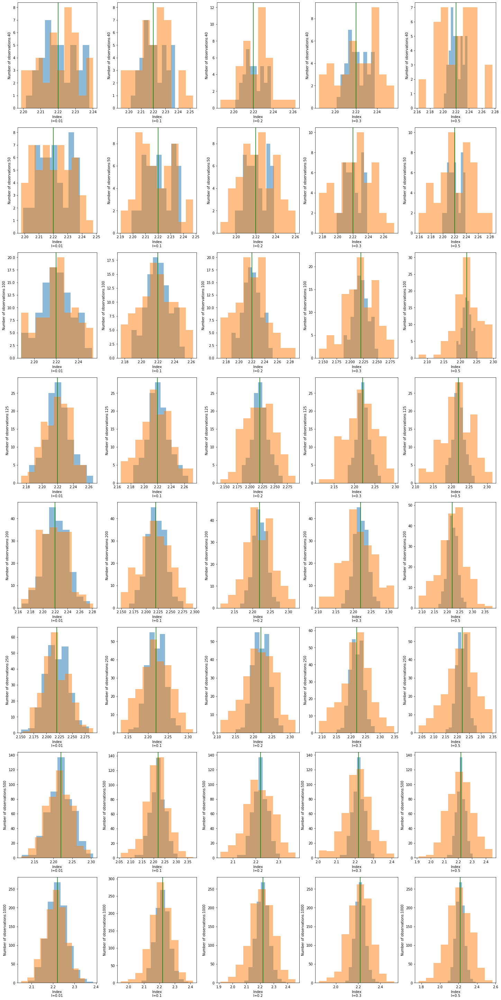

In [23]:
fig = plt.figure(figsize=[20,40],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 5, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[0])
for n in range(8):
    ax = fig.add_subplot(gs1[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][1], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.01')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs2 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[1])
for n in range(8):
    ax = fig.add_subplot(gs2[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][2], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.1')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

gs3 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[2])
for n in range(8):
    ax = fig.add_subplot(gs3[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][3], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.2')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs4 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[3])
for n in range(8):
    ax = fig.add_subplot(gs4[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][4], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.3')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs5 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[4])
for n in range(8):
    ax = fig.add_subplot(gs5[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][5], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.5')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

plt.show()

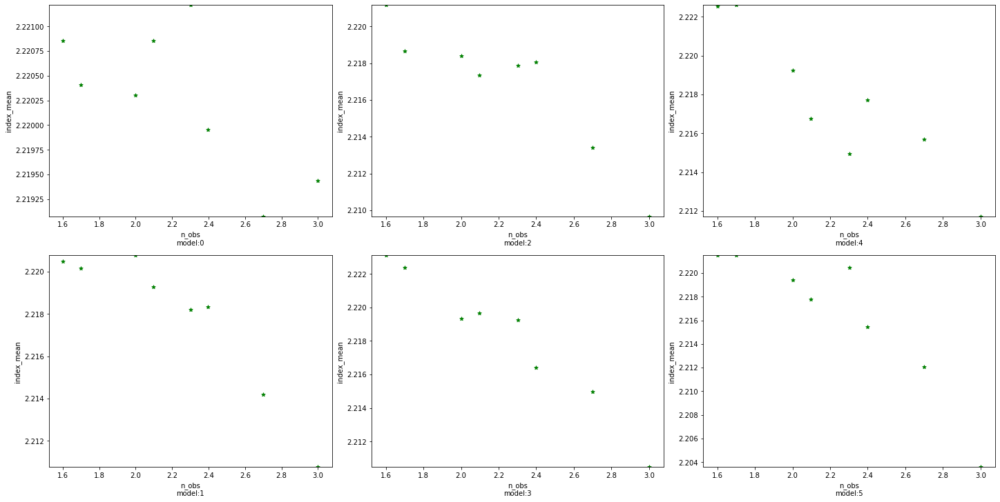

In [24]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n}')
    plt.ylabel('index_mean')
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+2}')
    plt.ylabel('index_mean')
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(2):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+4}')
    plt.ylabel('index_mean')
    plt.ylim(min([row[n+4] for row in mu]),max([row[n+4] for row in mu]))

plt.show()

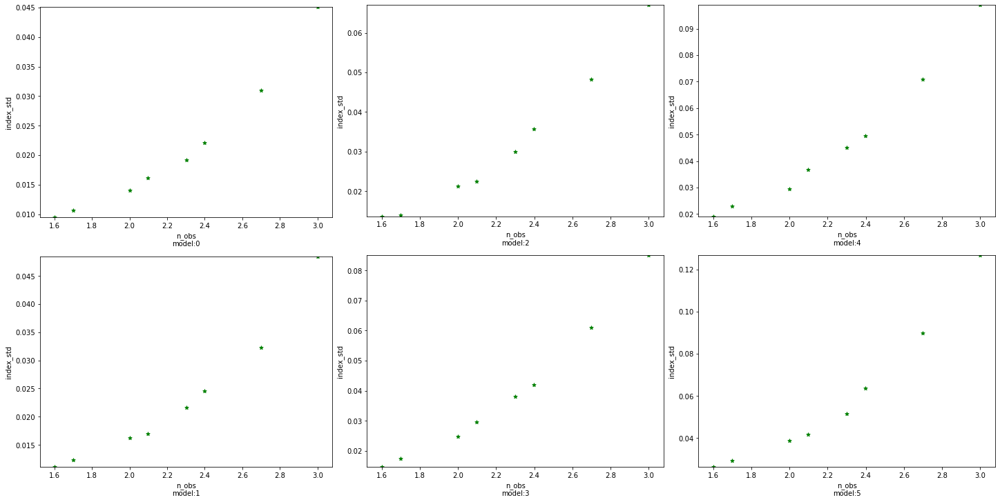

In [25]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+2}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(2):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+4}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n+4] for row in sigma]),max([row[n+4] for row in sigma]))

plt.show()

In [26]:
for j in range(6):
    print(f"model: {j}")
    for i in range(8):
        mu[i][j]=amplitude[i][j].mean()
        sigma[i][j]=amplitude[i][j].std()
        print(f"amplitude: {amplitude[i][j].mean()} += {amplitude[i][j].std()}")

model: 0
amplitude: 1.2882109734645357e-12 += 2.020774416400257e-14
amplitude: 1.2887930617364896e-12 += 2.321243734503526e-14
amplitude: 1.2875057637201671e-12 += 2.943738660653206e-14
amplitude: 1.2855551328222816e-12 += 3.4620322478409695e-14
amplitude: 1.2852616877373924e-12 += 4.1590131875188173e-14
amplitude: 1.2870704254498414e-12 += 4.604036230233484e-14
amplitude: 1.2848003538014906e-12 += 6.382360983727948e-14
amplitude: 1.2834022687629476e-12 += 9.812239252655629e-14
model: 1
amplitude: 1.2887740733863474e-12 += 2.1624008113134554e-14
amplitude: 1.290197249320048e-12 += 2.3665712755630992e-14
amplitude: 1.2873240819719735e-12 += 3.2647047697068356e-14
amplitude: 1.287907206311591e-12 += 3.64426974840847e-14
amplitude: 1.288016568088648e-12 += 4.6423404433813026e-14
amplitude: 1.2878012385332741e-12 += 4.866857799313919e-14
amplitude: 1.2941386042810284e-12 += 6.980329125688868e-14
amplitude: 1.299253568211679e-12 += 1.032452149663184e-13
model: 2
amplitude: 1.288833703100092

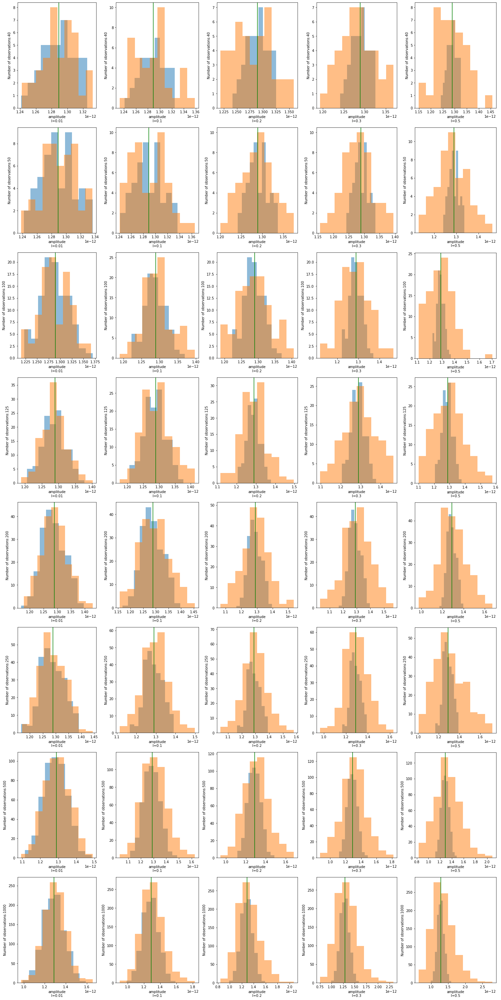

In [27]:
fig = plt.figure(figsize=[20,40],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 5, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[0])
for n in range(8):
    ax = fig.add_subplot(gs1[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][1], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.01')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs2 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[1])
for n in range(8):
    ax = fig.add_subplot(gs2[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][2], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.1')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

gs3 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[2])
for n in range(8):
    ax = fig.add_subplot(gs3[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][3], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.2')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs4 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[3])
for n in range(8):
    ax = fig.add_subplot(gs4[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][4], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.3')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs5 = gridspec.GridSpecFromSubplotSpec(8, 1, subplot_spec=gs0[4])
for n in range(8):
    ax = fig.add_subplot(gs5[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][5], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.5')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

plt.show()

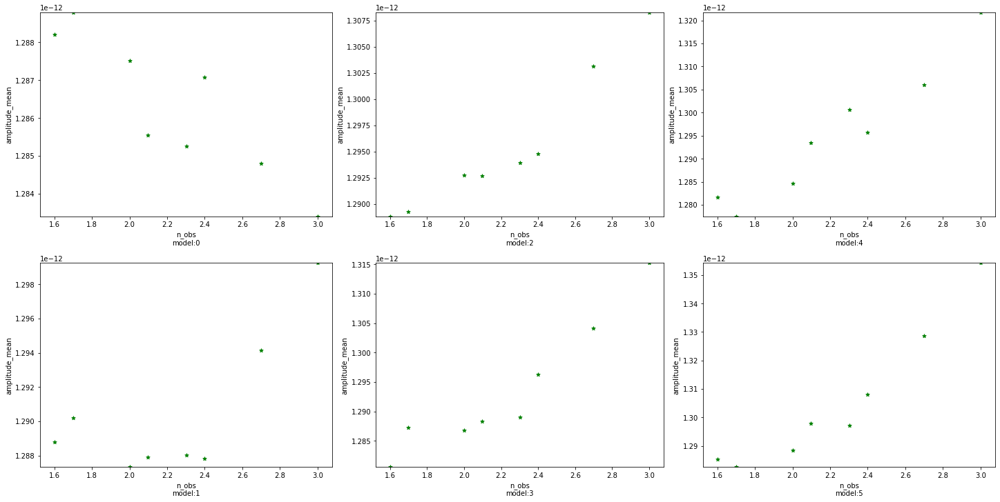

In [28]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n}')
    plt.ylabel('amplitude_mean')
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+2}')
    plt.ylabel('amplitude_mean')
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(2):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+4}')
    plt.ylabel('amplitude_mean')
    plt.ylim(min([row[n+4] for row in mu]),max([row[n+4] for row in mu]))

plt.show()

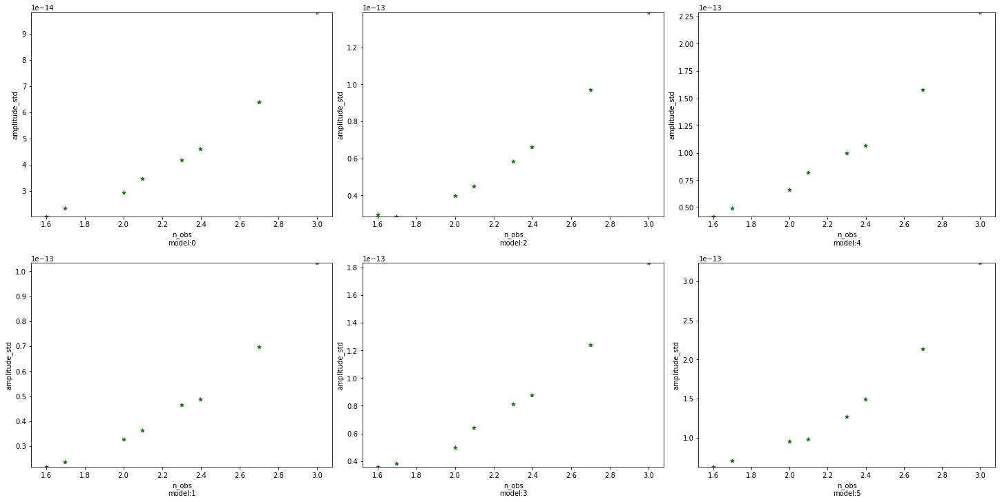

In [29]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+2}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(2):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+4}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n+4] for row in sigma]),max([row[n+4] for row in sigma]))

plt.show()

In [30]:
for j in range(5):
    print(f"model: {j}")
    for i in range(8):
        mu[i][j]=lambda_[i][j].mean()
        sigma[i][j]=lambda_[i][j].std()
        print(f"lambda_: {lambda_[i][j].mean()} += {lambda_[i][j].std()}")

model: 0
lambda_: 0.00983328872701745 += 0.003527412815651705
lambda_: 0.00997096588039571 += 0.003855226271571548
lambda_: 0.009380252964157535 += 0.00519607994559184
lambda_: 0.01069061050567699 += 0.005867950169742963
lambda_: 0.01008256122878477 += 0.007212265102101397
lambda_: 0.010256444061833998 += 0.007588274308204233
lambda_: 0.012567652159184253 += 0.010904987005412904
lambda_: 0.015828571114078694 += 0.016919554721768242
model: 1
lambda_: 0.10015432945628366 += 0.0066480054181108465
lambda_: 0.10078827921563097 += 0.006449629883359707
lambda_: 0.1022222867459217 += 0.011100524725229686
lambda_: 0.10344886668194597 += 0.013432590106282118
lambda_: 0.10373798639547463 += 0.01640438049913423
lambda_: 0.10383728053928191 += 0.01839816538948341
lambda_: 0.10607361404282202 += 0.027229784201596493
lambda_: 0.1092707065622827 += 0.03675385733319002
model: 2
lambda_: 0.1967069864590812 += 0.010744366602316709
lambda_: 0.19869165590213667 += 0.013229014698656682
lambda_: 0.2009987297

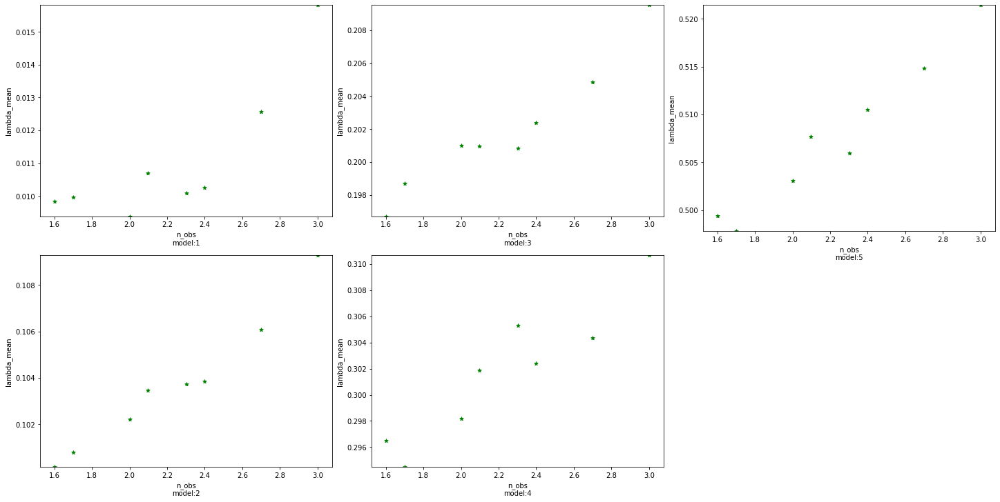

In [31]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+1}')
    plt.ylabel('lambda_mean')
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+3}')
    plt.ylabel('lambda_mean')
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in mu], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+5}')
    plt.ylabel('lambda_mean')
    plt.ylim(min([row[n+4] for row in mu]),max([row[n+4] for row in mu]))

plt.show()

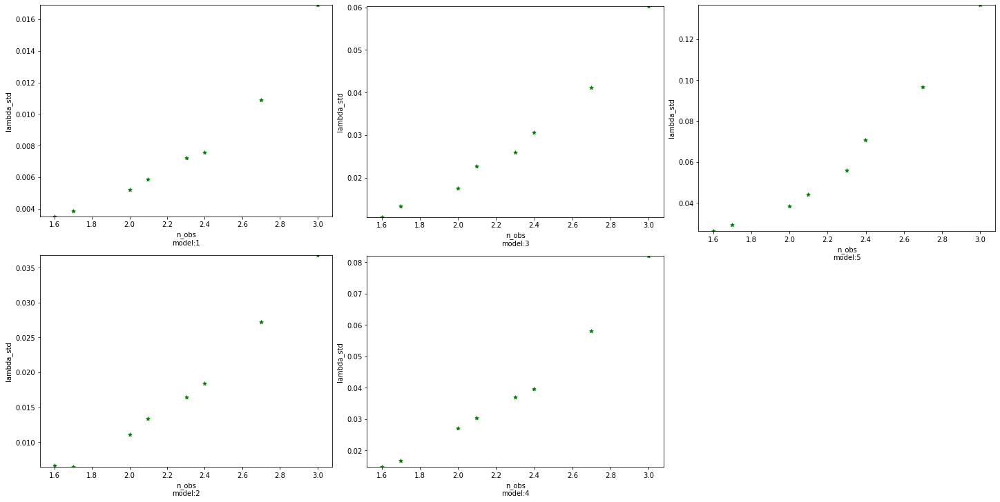

In [32]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+1}')
    plt.ylabel('lambda_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+3}')
    plt.ylabel('lambda_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in sigma], label= "stars", color= "green",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{n+5}')
    plt.ylabel('lambda_std')
    plt.ylim(min([row[n+4] for row in sigma]),max([row[n+4] for row in sigma]))

plt.show()

In [33]:
sim = [[0 for i in range(cols)] for j in range(rows)]
for i in range(8):
    s = PowerLawSpectralModel(
        index=index[i][0].mean(),
        amplitude=amplitude[i][0].mean() * u.Unit("cm-2 s-1 TeV-1"),
        reference=1 * u.TeV,
    )
    print(s) 
    sim[i][0]=s
    
for j in range(5):
    for i in range(8):
        s = ExpCutoffPowerLawSpectralModel(
            index=index[i][j+1].mean(),
            amplitude=amplitude[i][j+1].mean() * u.Unit("cm-2 s-1 TeV-1"),
            reference=1 * u.TeV,
            lambda_=lambda_[i][j].mean() * u.Unit("TeV-1"),
            alpha = 2,
        )
        print(s)
        sim[i][j+1]=s

PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --

    alpha 2.000e+00   nan                nan nan   True
ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.212e+00   nan                nan nan  False
amplitude 1.329e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.148e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True
ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.204e+00   nan                nan nan  False
amplitude 1.354e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.215e-01   nan          TeV-1 nan nan  False
    alpha 2.000e+00   nan                nan nan   True


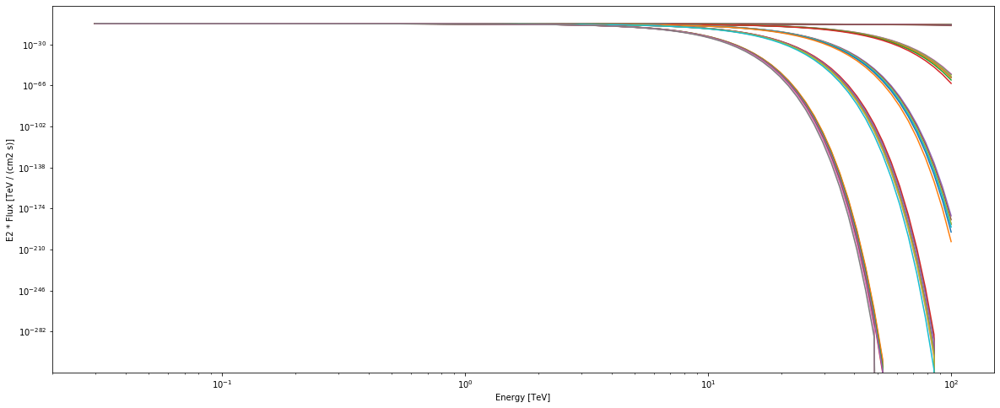

In [34]:
plt.figure(figsize=[20,8])
energy_range = [0.03, 100] * u.TeV
for j in range(6):
    for i in range(8):
        sim[i][j].plot(energy_range=energy_range, energy_power=2)
plt.show
plt.savefig('energy_lightcurve')

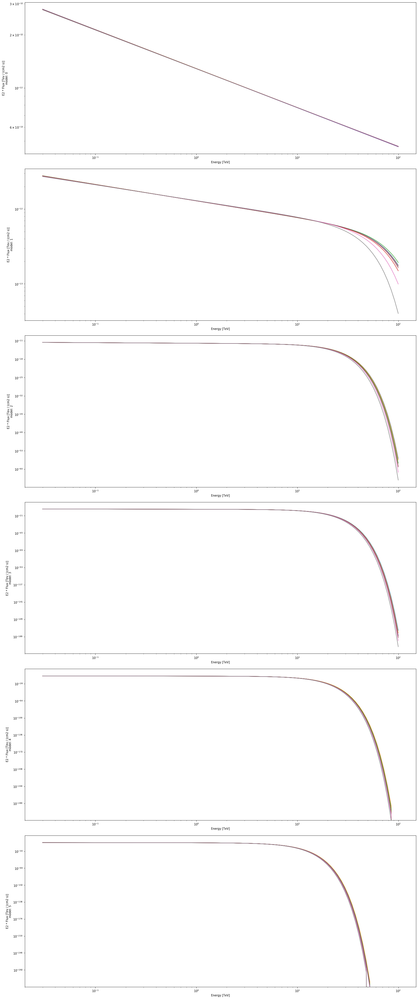

<Figure size 432x288 with 0 Axes>

In [35]:
fig = plt.figure(figsize=[20,48],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 1, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(6, 1, subplot_spec=gs0[0])
for n in range(6):
    ax = fig.add_subplot(gs1[n])
    for i in range(8):
        sim[i][n].plot(energy_range=energy_range, energy_power=2)
    plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {n}')
    
plt.show()
plt.savefig('energy_lightcurve')

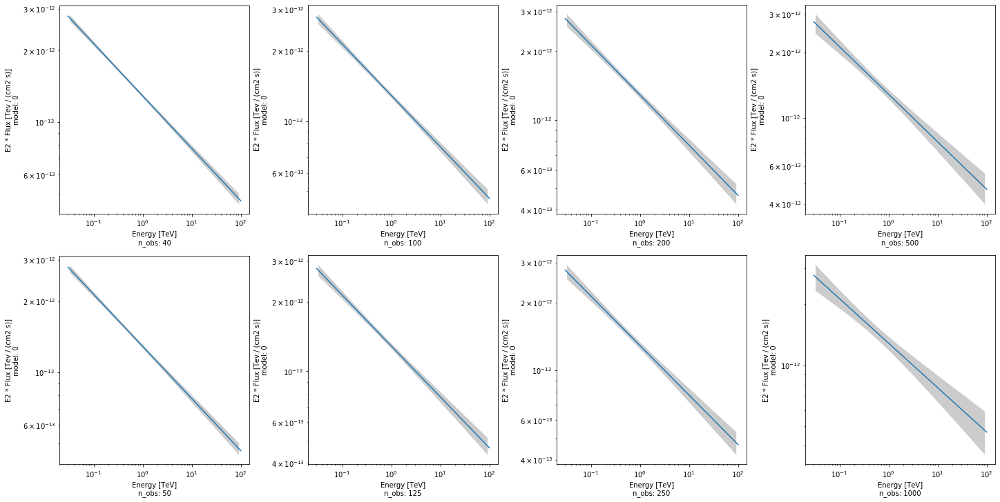

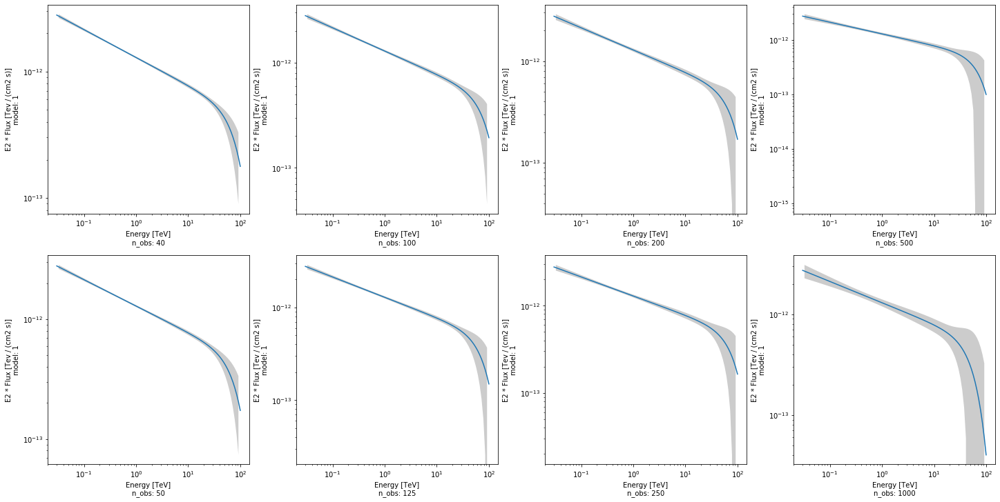

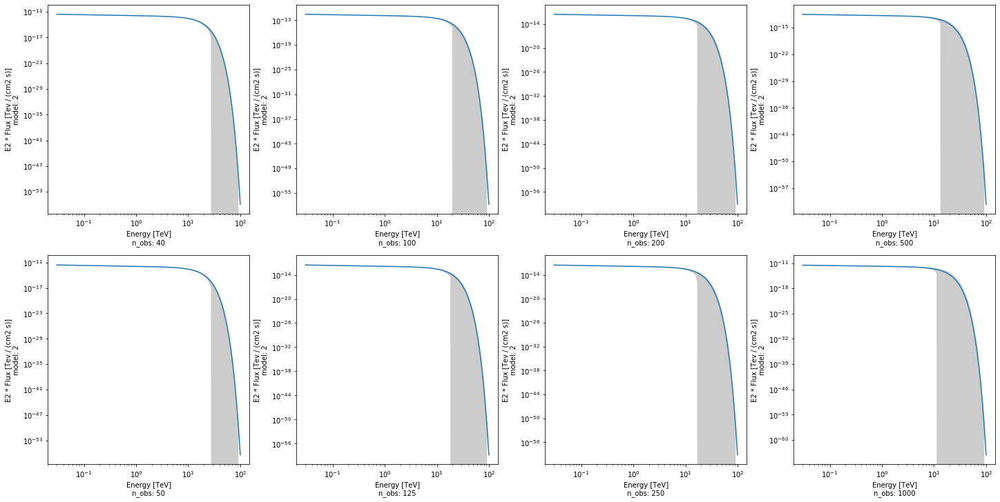

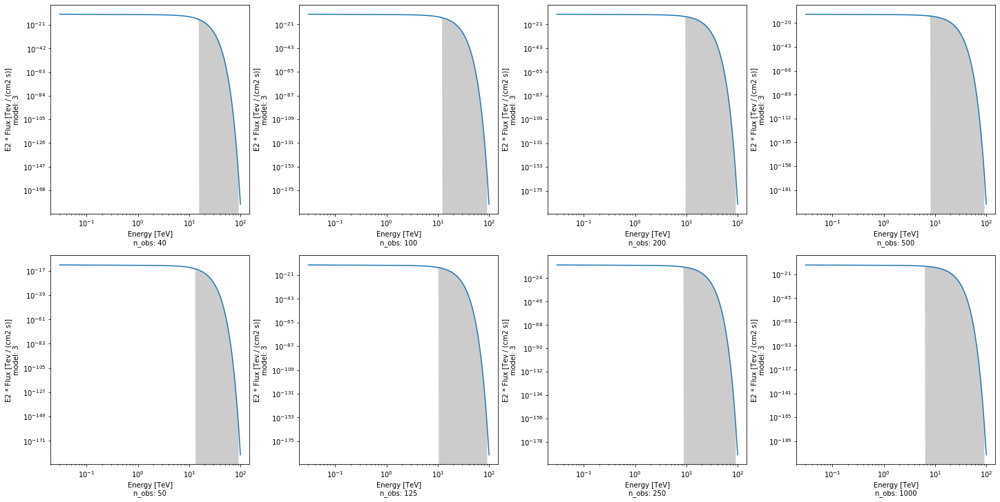

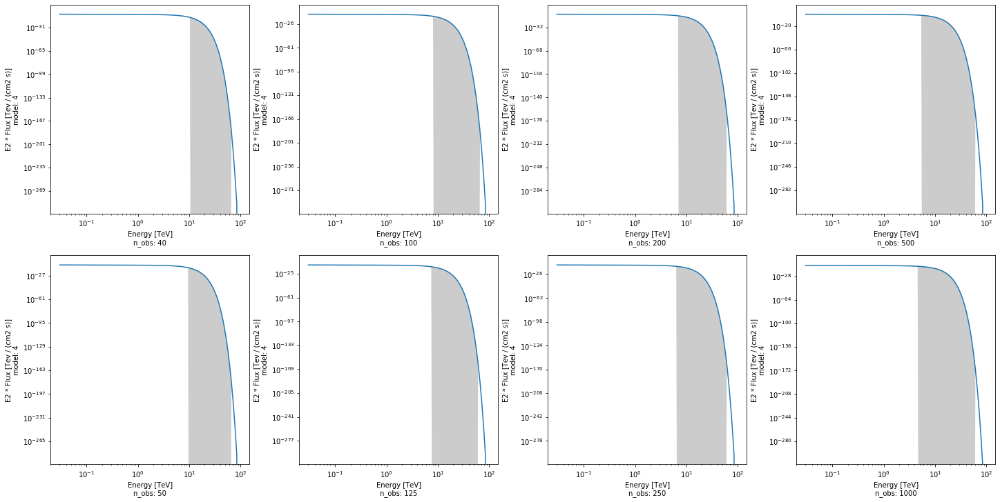

/home/rishank/anaconda2/envs/gammapy-0.15/lib/python3.6/site-packages/matplotlib/ticker.py:1123: RuntimeWarning: divide by zero encountered in double_scalars
  coeff = np.round(x / b ** exponent)


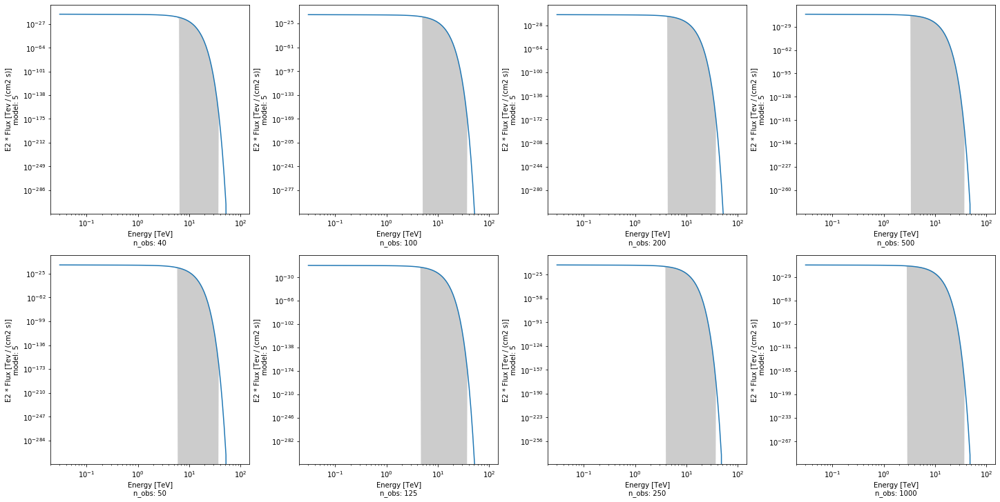

In [36]:
for i in range(6):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 4, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[n][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][i], covar=covar[n][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[n+2][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][i], covar=covar[n+2][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(2):
        ax = fig.add_subplot(gs3[n])
        sim[n+4][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][i], covar=covar[n+4][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    gs4 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[3])
    for n in range(2):
        ax = fig.add_subplot(gs4[n])
        sim[n+6][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+6][i], covar=covar[n+6][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+6]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    plt.show()

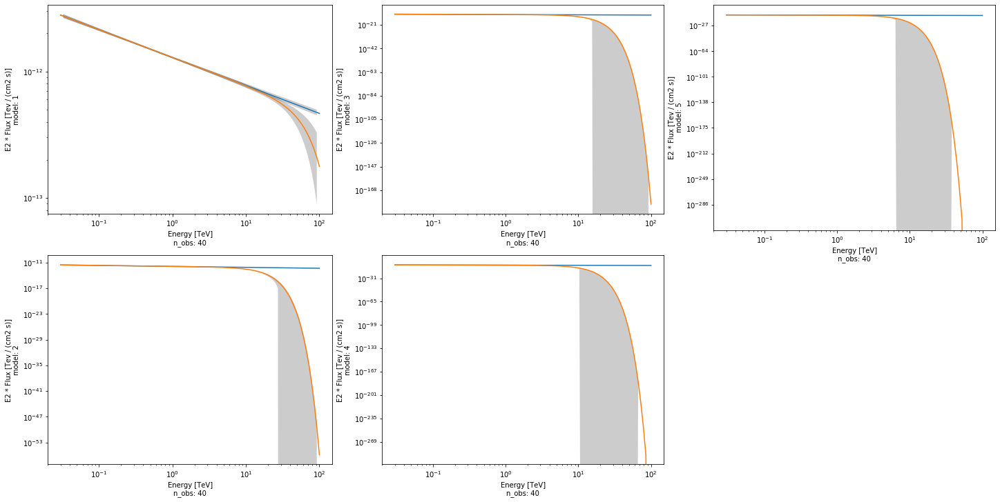

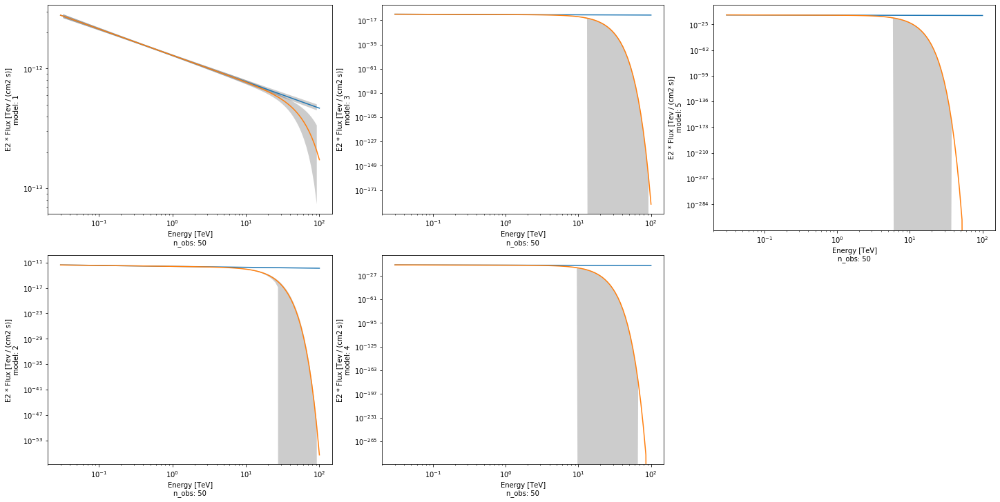

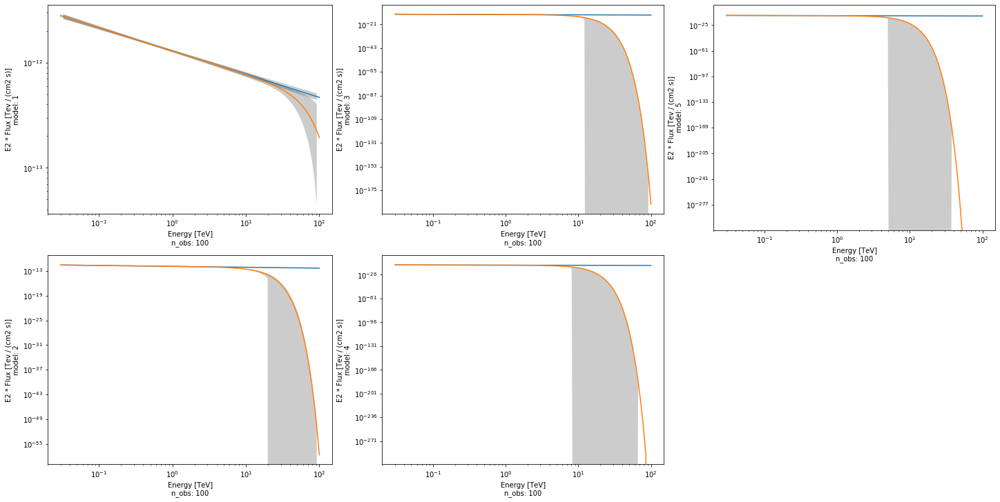

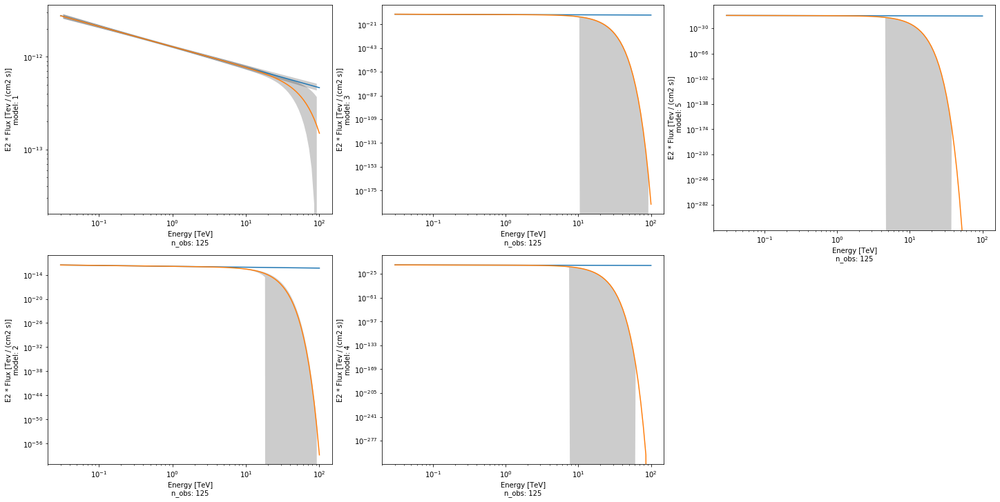

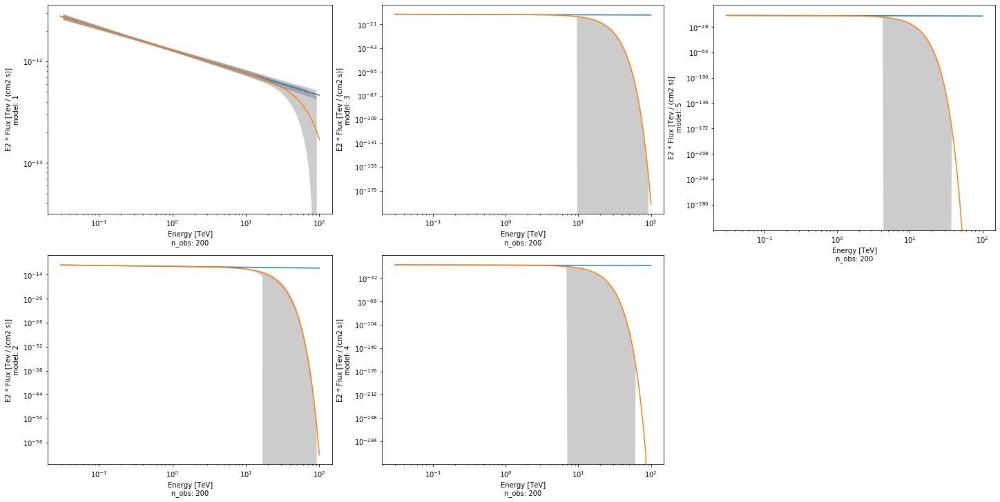

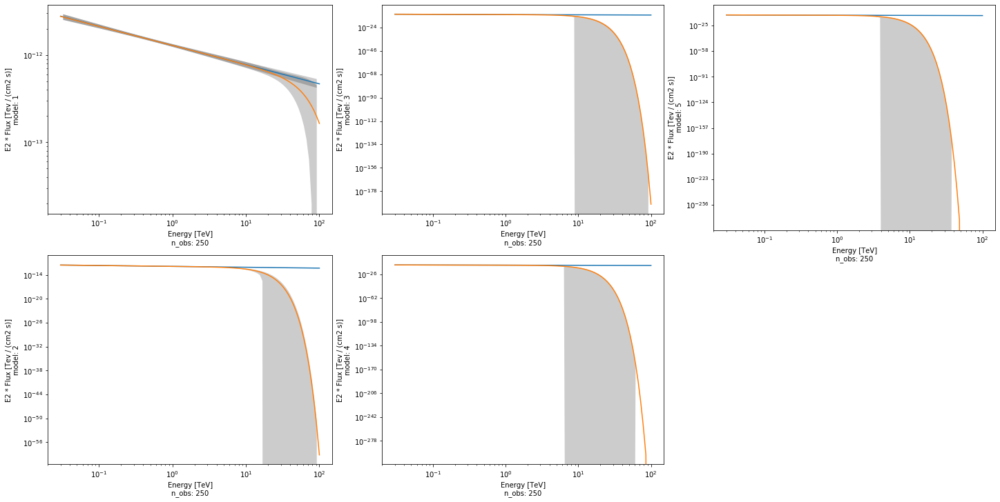

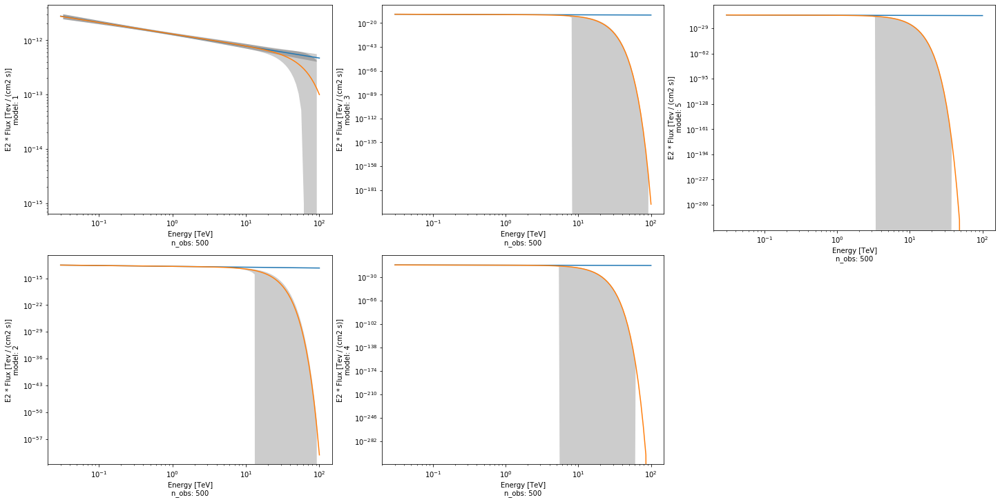

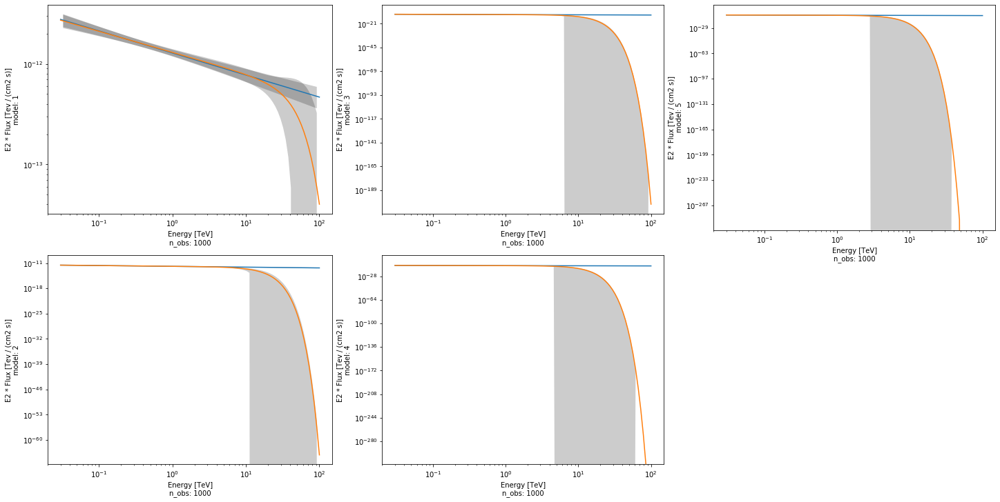

In [37]:
for i in range(8):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 3, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[i][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][0], covar=covar[i][0],energy_range=energy_range, energy_power=2)
        sim[i][n+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][n+1], covar=covar[i][n+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[i]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {n+1}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[i][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][0], covar=covar[i][0],energy_range=energy_range, energy_power=2)
        sim[i][n+3].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][n+3], covar=covar[i][n+3],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[i]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {n+3}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(1):
        ax = fig.add_subplot(gs3[n])
        sim[i][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][0], covar=covar[i][0],energy_range=energy_range, energy_power=2)
        sim[i][n+5].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][n+5], covar=covar[i][n+5],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[i]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {n+5}')

    plt.show()

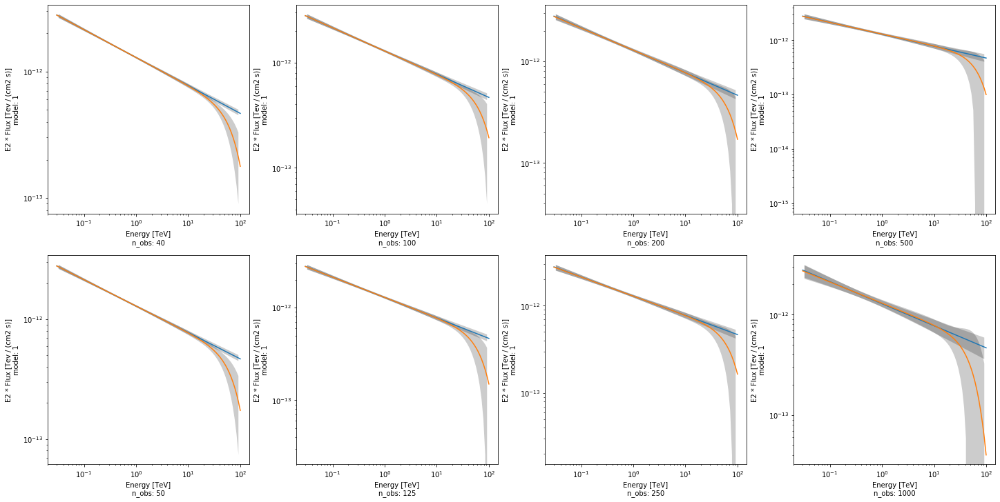

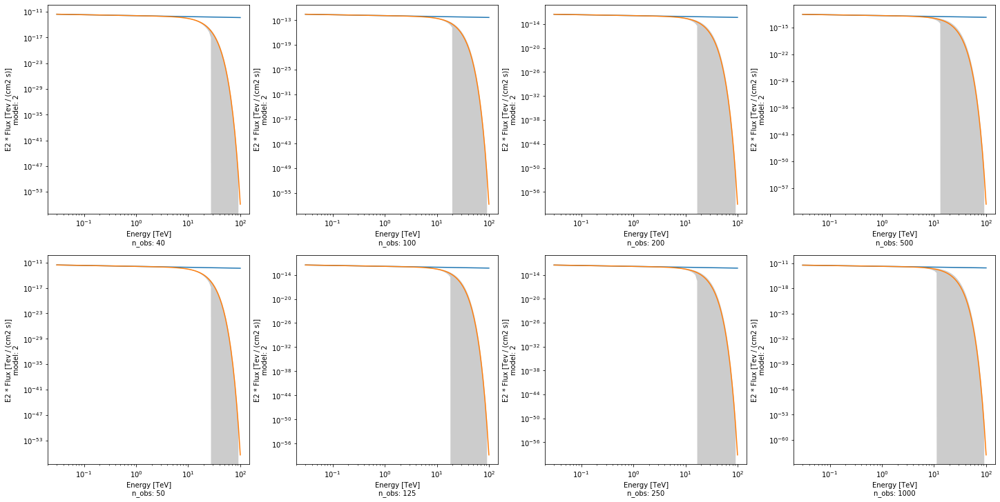

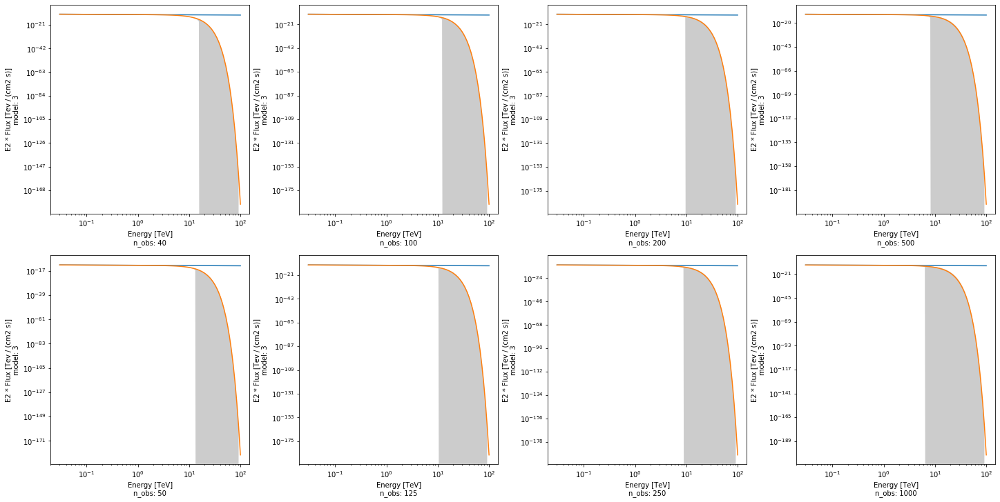

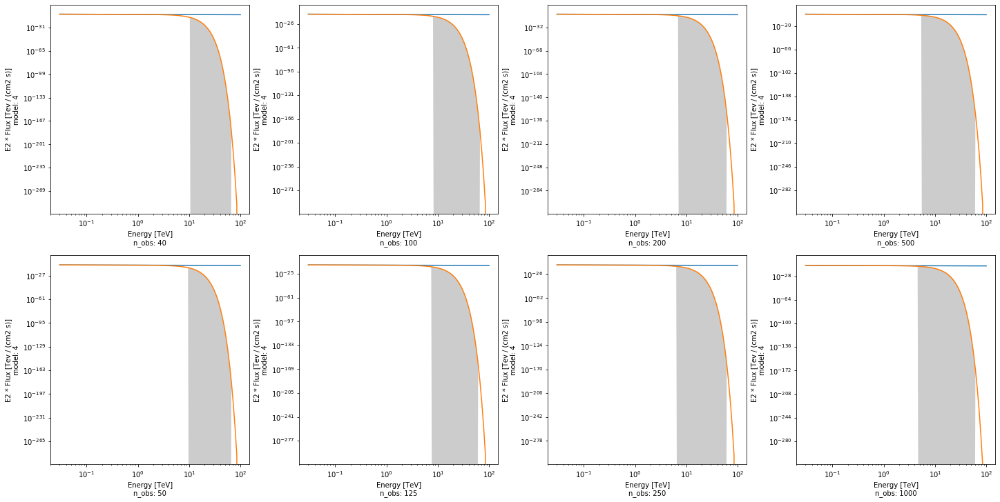

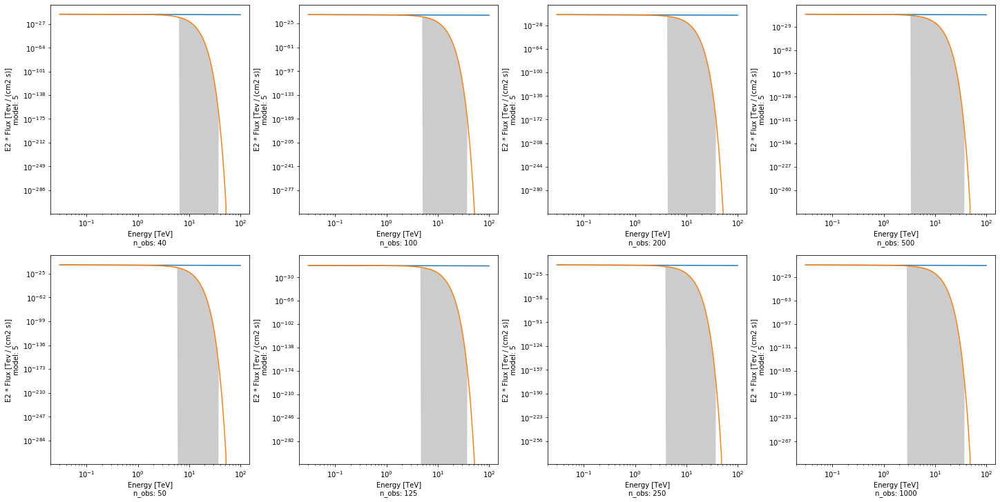

In [38]:
for i in range(5):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 4, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[n][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][0], covar=covar[n][0],energy_range=energy_range, energy_power=2)
        sim[n][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][i+1], covar=covar[n][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i+1}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[n+2][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][0], covar=covar[n+2][0],energy_range=energy_range, energy_power=2)
        sim[n+2][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][i+1], covar=covar[n+2][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i+1}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(2):
        ax = fig.add_subplot(gs3[n])
        sim[n+4][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][0], covar=covar[n+4][0],energy_range=energy_range, energy_power=2)
        sim[n+4][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][i+1], covar=covar[n+4][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i+1}')

    gs4 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[3])
    for n in range(2):
        ax = fig.add_subplot(gs4[n])
        sim[n+6][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+6][0], covar=covar[n+6][0],energy_range=energy_range, energy_power=2)
        sim[n+6][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+6][i+1], covar=covar[n+6][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+6]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i+1}')

    plt.show()

In [39]:
%%time
res_1 = [[0 for i in range(cols)] for j in range(rows)]
minuit_opts = {"tol": 0.001, "strategy": 1}
for i in range(8):
    results_1 = []
    for dataset in datas[i][0]:
        dataset.models = model[i][0].copy()
        fit_1 = Fit([dataset])
        result_1 = fit_1.run(optimize_opts=minuit_opts)
        results_1.append(
            {
                "index": result_1.parameters["index"].value,
                "amplitude": result_1.parameters["amplitude"].value,
                "reference":result_1.parameters["reference"].value,
                "covariance": result_1.parameters.covariance,
            }
        )
        print(result_1.parameters.to_table())
    res_1[i][0]=results_1

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 9.028e-03                nan nan  False
amplitude 1.318e-12 1.964e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 9.318e-03                nan nan  False
amplitude 1.258e-12 1.930e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 9.283e-03                nan nan  False
amplitude 1.263e-12 1.943e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 9.023e-03                nan nan  False
amplitude 1.315e-12 1.977e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 9.374e-03                nan nan  False
amplitude 1.241e-12 1.927e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 9.174e-03                nan nan  False
amplitude 1.278e-12 1.955e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 1.030e-02                nan nan  False
amplitude 1.260e-12 2.169e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 1.016e-02                nan nan  False
amplitude 1.299e-12 2.201e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 1.041e-02                nan nan  False
amplitude 1.246e-12 2.164e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 1.003e-02                nan nan  False
amplitude 1.337e-12 2.214e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 1.425e-02                nan nan  False
amplitude 1.318e-12 3.109e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 1.501e-02                nan nan  False
amplitude 1.230e-12 3.024e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 1.463e-02                nan nan  False
amplitude 1.265e-12 3.065e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 1.453e-02                nan nan  False
amplitude 1.273e-12 3.087e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 1.406e-02                nan nan  False
amplitude 1.334e-12 3.151e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 1.501e-02                nan nan  False
amplitude 1.231e-12 3.032e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 1.459e-02                nan nan  False
amplitude 1.277e-12 3.081e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 1.470e-02                nan nan  False
amplitude 1.258e-12 3.068e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 1.423e-02                nan nan  False
amplitude 1.318e-12 3.128e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 1.439e-02                nan nan  False
amplitude 1.299e-12 3.113e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 1.469e-02                nan nan  False
amplitude 1.256e-12 3.074e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 1.638e-02                nan nan  False
amplitude 1.281e-12 3.436e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 1.616e-02                nan nan  False
amplitude 1.286e-12 3.469e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 1.651e-02                nan nan  False
amplitude 1.231e-12 3.422e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 1.671e-02                nan nan  False
amplitude 1.238e-12 3.378e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 1.619e-02                nan nan  False
amplitude 1.285e-12 3.470e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 1.640e-02                nan nan  False
amplitude 1.247e-12 3.419e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 1.602e-02                nan nan  False
amplitude 1.322e-12 3.486e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 1.698e-02                nan nan  False
amplitude 1.219e-12 3.373e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 1.618e-02                nan nan  False
amplitude 1.286e-12 3.450e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 1.658e-02                nan nan  False
amplitude 1.226e-12 3.407e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 1.635e-02                nan nan  False
amplitude 1.257e-12 3.421e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 1.583e-02                nan nan  False
amplitude 1.332e-12 3.501e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 2.067e-02                nan nan  False
amplitude 1.302e-12 4.372e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 2.025e-02                nan nan  False
amplitude 1.288e-12 4.384e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 1.969e-02                nan nan  False
amplitude 1.362e-12 4.466e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 2.039e-02                nan nan  False
amplitude 1.335e-12 4.389e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 2.093e-02                nan nan  False
amplitude 1.260e-12 4.322e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 2.065e-02                nan nan  False
amplitude 1.269e-12 4.325e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 2.065e-02                nan nan  False
amplitude 1.260e-12 4.329e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 2.032e-02                nan nan  False
amplitude 1.298e-12 4.390e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 2.008e-02                nan nan  False
amplitude 1.290e-12 4.393e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 2.013e-02                nan nan  False
amplitude 1.322e-12 4.396e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 2.035e-02                nan nan  False
amplitude 1.303e-12 4.376e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 2.011e-02                nan nan  False
amplitude 1.314e-12 4.394e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 2.109e-02                nan nan  False
amplitude 1.248e-12 4.308e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 2.024e-02                nan nan  False
amplitude 1.281e-12 4.368e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 2.053e-02                nan nan  False
amplitude 1.298e-12 4.391e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 2.108e-02                nan nan  False
amplitude 1.230e-12 4.284e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 2.035e-02                nan nan  False
amplitude 1.314e-12 4.397e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 2.092e-02                nan nan  False
amplitude 1.265e-12 4.343e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 2.058e-02                nan nan  False
amplitude 1.287e-12 4.372e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 2.086e-02                nan nan  False
amplitude 1.268e-12 4.324e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 2.025e-02                nan nan  False
amplitude 1.282e-12 4.383e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 2.236e-02                nan nan  False
amplitude 1.328e-12 4.950e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 2.322e-02                nan nan  False
amplitude 1.260e-12 4.843e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 2.260e-02                nan nan  False
amplitude 1.299e-12 4.942e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.190e+00 2.361e-02                nan nan  False
amplitude 1.256e-12 4.803e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 2.322e-02                nan nan  False
amplitude 1.252e-12 4.877e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 2.311e-02                nan nan  False
amplitude 1.235e-12 4.835e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 2.244e-02                nan nan  False
amplitude 1.314e-12 4.926e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 2.235e-02                nan nan  False
amplitude 1.329e-12 4.920e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 2.440e-02                nan nan  False
amplitude 1.187e-12 4.718e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 2.305e-02                nan nan  False
amplitude 1.277e-12 4.831e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 2.294e-02                nan nan  False
amplitude 1.278e-12 4.885e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 2.348e-02                nan nan  False
amplitude 1.235e-12 4.807e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 2.345e-02                nan nan  False
amplitude 1.233e-12 4.824e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 2.283e-02                nan nan  False
amplitude 1.258e-12 4.866e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 2.322e-02                nan nan  False
amplitude 1.262e-12 4.894e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 2.286e-02                nan nan  False
amplitude 1.319e-12 4.914e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 2.311e-02                nan nan  False
amplitude 1.256e-12 4.865e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 2.187e-02                nan nan  False
amplitude 1.366e-12 5.009e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 2.339e-02                nan nan  False
amplitude 1.240e-12 4.784e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 2.378e-02                nan nan  False
amplitude 1.250e-12 4.816e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 2.247e-02                nan nan  False
amplitude 1.332e-12 4.924e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 2.317e-02                nan nan  False
amplitude 1.210e-12 4.824e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 2.285e-02                nan nan  False
amplitude 1.325e-12 4.914e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 2.212e-02                nan nan  False
amplitude 1.325e-12 4.976e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 2.220e-02                nan nan  False
amplitude 1.321e-12 4.946e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 3.021e-02                nan nan  False
amplitude 1.446e-12 7.210e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 3.361e-02                nan nan  False
amplitude 1.210e-12 6.717e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 3.237e-02                nan nan  False
amplitude 1.275e-12 6.912e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 3.314e-02                nan nan  False
amplitude 1.256e-12 6.779e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 3.120e-02                nan nan  False
amplitude 1.362e-12 7.088e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 3.375e-02                nan nan  False
amplitude 1.214e-12 6.761e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 3.270e-02                nan nan  False
amplitude 1.256e-12 6.883e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.287e+00 3.378e-02                nan nan  False
amplitude 1.215e-12 6.837e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 3.130e-02                nan nan  False
amplitude 1.329e-12 7.049e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 3.085e-02                nan nan  False
amplitude 1.336e-12 7.045e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 3.371e-02                nan nan  False
amplitude 1.187e-12 6.728e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 3.374e-02                nan nan  False
amplitude 1.217e-12 6.761e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.165e+00 3.268e-02                nan nan  False
amplitude 1.320e-12 6.900e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.261e+00 3.386e-02                nan nan  False
amplitude 1.217e-12 6.747e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 3.416e-02                nan nan  False
amplitude 1.141e-12 6.609e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 3.158e-02                nan nan  False
amplitude 1.334e-12 7.020e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 3.189e-02                nan nan  False
amplitude 1.296e-12 6.934e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 3.224e-02                nan nan  False
amplitude 1.272e-12 6.922e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 3.189e-02                nan nan  False
amplitude 1.345e-12 7.007e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 3.255e-02                nan nan  False
amplitude 1.275e-12 6.873e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 3.178e-02                nan nan  False
amplitude 1.323e-12 7.014e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 3.333e-02                nan nan  False
amplitude 1.214e-12 6.802e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 3.237e-02                nan nan  False
amplitude 1.314e-12 6.941e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 3.422e-02                nan nan  False
amplitude 1.204e-12 6.682e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 3.112e-02                nan nan  False
amplitude 1.389e-12 7.113e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 3.439e-02                nan nan  False
amplitude 1.173e-12 6.699e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 3.141e-02                nan nan  False
amplitude 1.343e-12 6.974e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 3.218e-02                nan nan  False
amplitude 1.301e-12 6.960e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 3.201e-02                nan nan  False
amplitude 1.331e-12 7.001e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 3.303e-02                nan nan  False
amplitude 1.257e-12 6.888e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 3.139e-02                nan nan  False
amplitude 1.343e-12 7.014e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 3.288e-02                nan nan  False
amplitude 1.286e-12 6.880e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 3.208e-02                nan nan  False
amplitude 1.270e-12 6.927e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 3.279e-02                nan nan  False
amplitude 1.333e-12 6.921e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.281e+00 3.187e-02                nan nan  False
amplitude 1.267e-12 6.947e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 3.158e-02                nan nan  False
amplitude 1.311e-12 6.966e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 3.248e-02                nan nan  False
amplitude 1.291e-12 6.980e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 3.393e-02                nan nan  False
amplitude 1.167e-12 6.649e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 3.183e-02                nan nan  False
amplitude 1.332e-12 7.014e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 3.226e-02                nan nan  False
amplitude 1.298e-12 6.958e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 3.309e-02                nan nan  False
amplitude 1.249e-12 6.852e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 3.188e-02                nan nan  False
amplitude 1.315e-12 7.009e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.284e+00 3.115e-02                nan nan  False
amplitude 1.328e-12 7.092e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 3.147e-02                nan nan  False
amplitude 1.342e-12 6.970e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 3.387e-02                nan nan  False
amplitude 1.212e-12 6.771e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 3.259e-02                nan nan  False
amplitude 1.257e-12 6.809e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 3.169e-02                nan nan  False
amplitude 1.308e-12 7.022e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 3.386e-02                nan nan  False
amplitude 1.250e-12 6.812e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 3.241e-02                nan nan  False
amplitude 1.267e-12 6.861e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 3.297e-02                nan nan  False
amplitude 1.268e-12 6.828e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 3.171e-02                nan nan  False
amplitude 1.325e-12 7.023e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 3.207e-02                nan nan  False
amplitude 1.270e-12 6.918e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 3.336e-02                nan nan  False
amplitude 1.241e-12 6.811e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 4.601e-02                nan nan  False
amplitude 1.286e-12 9.751e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 4.401e-02                nan nan  False
amplitude 1.372e-12 1.006e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 4.428e-02                nan nan  False
amplitude 1.315e-12 9.992e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.292e+00 4.380e-02                nan nan  False
amplitude 1.319e-12 1.003e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.139e+00 4.574e-02                nan nan  False
amplitude 1.356e-12 9.871e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.278e+00 4.692e-02                nan nan  False
amplitude 1.181e-12 9.540e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 4.762e-02                nan nan  False
amplitude 1.283e-12 9.743e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 4.628e-02                nan nan  False
amplitude 1.273e-12 9.663e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.273e+00 4.439e-02                nan nan  False
amplitude 1.306e-12 9.903e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.160e+00 4.558e-02                nan nan  False
amplitude 1.313e-12 9.800e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 4.780e-02                nan nan  False
amplitude 1.188e-12 9.456e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 5.171e-02                nan nan  False
amplitude 1.108e-12 9.269e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 4.353e-02                nan nan  False
amplitude 1.392e-12 1.008e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.107e+00 4.446e-02                nan nan  False
amplitude 1.443e-12 1.021e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 4.729e-02                nan nan  False
amplitude 1.166e-12 9.480e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 4.506e-02                nan nan  False
amplitude 1.324e-12 9.768e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 4.525e-02                nan nan  False
amplitude 1.306e-12 9.788e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 4.245e-02                nan nan  False
amplitude 1.492e-12 1.029e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 4.477e-02                nan nan  False
amplitude 1.345e-12 9.934e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.266e+00 4.698e-02                nan nan  False
amplitude 1.225e-12 9.713e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.152e+00 4.844e-02                nan nan  False
amplitude 1.212e-12 9.555e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 4.982e-02                nan nan  False
amplitude 1.181e-12 9.548e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 4.650e-02                nan nan  False
amplitude 1.269e-12 9.606e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 4.359e-02                nan nan  False
amplitude 1.388e-12 1.006e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 4.579e-02                nan nan  False
amplitude 1.283e-12 9.769e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 4.404e-02                nan nan  False
amplitude 1.320e-12 9.780e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 4.429e-02                nan nan  False
amplitude 1.416e-12 1.011e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.290e+00 4.936e-02                nan nan  False
amplitude 1.149e-12 9.435e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 4.733e-02                nan nan  False
amplitude 1.290e-12 9.812e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 4.557e-02                nan nan  False
amplitude 1.296e-12 9.732e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 4.648e-02                nan nan  False
amplitude 1.193e-12 9.510e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.099e+00 4.833e-02                nan nan  False
amplitude 1.246e-12 9.526e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.342e+00 4.500e-02                nan nan  False
amplitude 1.240e-12 9.816e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.288e+00 5.001e-02                nan nan  False
amplitude 1.126e-12 9.492e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 4.772e-02                nan nan  False
amplitude 1.246e-12 9.507e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 4.701e-02                nan nan  False
amplitude 1.229e-12 9.614e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 4.787e-02                nan nan  False
amplitude 1.212e-12 9.610e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 4.723e-02                nan nan  False
amplitude 1.226e-12 9.650e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 4.636e-02                nan nan  False
amplitude 1.277e-12 9.819e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 4.190e-02                nan nan  False
amplitude 1.462e-12 1.033e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 4.759e-02                nan nan  False
amplitude 1.267e-12 9.692e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 4.769e-02                nan nan  False
amplitude 1.254e-12 9.643e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 4.972e-02                nan nan  False
amplitude 1.163e-12 9.381e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.280e+00 4.587e-02                nan nan  False
amplitude 1.247e-12 9.704e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 4.449e-02                nan nan  False
amplitude 1.329e-12 9.882e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 4.262e-02                nan nan  False
amplitude 1.363e-12 1.021e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 4.610e-02                nan nan  False
amplitude 1.317e-12 9.713e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.176e+00 4.666e-02                nan nan  False
amplitude 1.293e-12 9.738e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 4.391e-02                nan nan  False
amplitude 1.326e-12 9.819e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 4.758e-02                nan nan  False
amplitude 1.208e-12 9.525e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.274e+00 4.462e-02                nan nan  False
amplitude 1.325e-12 9.982e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 4.464e-02                nan nan  False
amplitude 1.353e-12 1.017e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 4.612e-02                nan nan  False
amplitude 1.278e-12 9.610e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.279e+00 4.807e-02                nan nan  False
amplitude 1.200e-12 9.627e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 4.174e-02                nan nan  False
amplitude 1.465e-12 1.024e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 4.903e-02                nan nan  False
amplitude 1.156e-12 9.370e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.266e+00 4.665e-02                nan nan  False
amplitude 1.243e-12 9.754e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 4.716e-02                nan nan  False
amplitude 1.296e-12 9.865e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.129e+00 4.263e-02                nan nan  False
amplitude 1.464e-12 1.022e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 4.789e-02                nan nan  False
amplitude 1.214e-12 9.506e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.157e+00 4.554e-02                nan nan  False
amplitude 1.306e-12 9.750e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 5.050e-02                nan nan  False
amplitude 1.118e-12 9.209e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 4.279e-02                nan nan  False
amplitude 1.421e-12 1.030e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 4.380e-02                nan nan  False
amplitude 1.339e-12 1.002e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 4.402e-02                nan nan  False
amplitude 1.397e-12 9.993e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 4.547e-02                nan nan  False
amplitude 1.334e-12 9.918e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.261e+00 4.869e-02                nan nan  False
amplitude 1.153e-12 9.420e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 4.600e-02                nan nan  False
amplitude 1.355e-12 9.927e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 4.508e-02                nan nan  False
amplitude 1.339e-12 9.889e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 4.802e-02                nan nan  False
amplitude 1.239e-12 9.552e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 4.416e-02                nan nan  False
amplitude 1.355e-12 9.975e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 4.591e-02                nan nan  False
amplitude 1.314e-12 9.783e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 4.445e-02                nan nan  False
amplitude 1.337e-12 9.990e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 4.498e-02                nan nan  False
amplitude 1.348e-12 9.891e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 5.194e-02                nan nan  False
amplitude 1.062e-12 9.118e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.101e+00 4.663e-02                nan nan  False
amplitude 1.297e-12 9.747e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 4.674e-02                nan nan  False
amplitude 1.202e-12 9.505e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 4.390e-02                nan nan  False
amplitude 1.368e-12 9.983e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.104e+00 4.639e-02                nan nan  False
amplitude 1.305e-12 9.701e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 4.622e-02                nan nan  False
amplitude 1.296e-12 9.764e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 4.045e-02                nan nan  False
amplitude 1.514e-12 1.037e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.150e+00 4.584e-02                nan nan  False
amplitude 1.363e-12 9.989e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 4.386e-02                nan nan  False
amplitude 1.427e-12 1.015e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 4.557e-02                nan nan  False
amplitude 1.262e-12 9.803e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 4.733e-02                nan nan  False
amplitude 1.239e-12 9.587e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 4.178e-02                nan nan  False
amplitude 1.415e-12 1.027e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.268e+00 4.727e-02                nan nan  False
amplitude 1.215e-12 9.645e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 4.883e-02                nan nan  False
amplitude 1.162e-12 9.420e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.261e+00 4.621e-02                nan nan  False
amplitude 1.239e-12 9.712e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.267e+00 4.486e-02                nan nan  False
amplitude 1.267e-12 9.842e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.329e+00 4.740e-02                nan nan  False
amplitude 1.186e-12 9.766e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 4.438e-02                nan nan  False
amplitude 1.343e-12 9.920e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 4.193e-02                nan nan  False
amplitude 1.454e-12 1.037e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 4.259e-02                nan nan  False
amplitude 1.403e-12 9.938e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 4.663e-02                nan nan  False
amplitude 1.337e-12 9.885e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 4.658e-02                nan nan  False
amplitude 1.278e-12 9.657e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 4.146e-02                nan nan  False
amplitude 1.469e-12 1.021e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 4.718e-02                nan nan  False
amplitude 1.220e-12 9.637e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 4.512e-02                nan nan  False
amplitude 1.307e-12 9.831e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- ----------

In [40]:
for j in range(5):
    for i in range(8):
        results_1 = []
        for dataset in datas[i][j+1]:
            dataset.models = model[i][j+1].copy()
            fit_1 = Fit([dataset])
            result_1 = fit_1.run(optimize_opts=minuit_opts)
            results_1.append(
                {
                    "index": result_1.parameters["index"].value,
                    "amplitude": result_1.parameters["amplitude"].value,
                    "lambda_": result_1.parameters["lambda_"].value,
                    "reference":result_1.parameters["reference"].value,
                    "alpha":result_1.parameters["alpha"].value,
                    "covariance": result_1.parameters.covariance,
                }
            )
            print(result_1.parameters.to_table())
        res_1[i][j+1]=results_1

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 9.963e-03                nan nan  False
amplitude 1.326e-12 2.074e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.398e-02 2.690e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 1.020e-02                nan nan  False
amplitude 1.262e-12 2.028e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.217e-02 2.894e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 1.003e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 9.967e-03                nan nan  False
amplitude 1.305e-12 2.069e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.337e-02 2.788e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 1.005e-02                nan nan  False
amplitude 1.246e-12 2.010e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.319e-03 4.330e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 9.978e-03           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 1.116e-02                nan nan  False
amplitude 1.326e-12 2.322e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.403e-02 3.007e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 1.149e-02                nan nan  False
amplitude 1.257e-12 2.268e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.308e-02 3.159e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 1.122e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 1.112e-02                nan nan  False
amplitude 1.307e-12 2.320e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.341e-02 3.133e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 1.123e-02                nan nan  False
amplitude 1.238e-12 2.248e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.729e-03 6.254e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 1.116e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 1.101e-02                nan nan  False
amplitude 1.325e-12 2.316e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.302e-02 3.017e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 1.122e-02                nan nan  False
amplitude 1.269e-12 2.269e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.433e-03 4.254e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 1.124e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 1.551e-02                nan nan  False
amplitude 1.315e-12 3.236e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.380e-03 5.229e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 1.626e-02                nan nan  False
amplitude 1.277e-12 3.266e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.797e-02 4.270e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 1.526e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 1.518e-02                nan nan  False
amplitude 1.330e-12 3.289e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.732e-03 5.873e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 1.614e-02                nan nan  False
amplitude 1.222e-12 3.173e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.070e-02 5.038e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 1.559e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 1.562e-02                nan nan  False
amplitude 1.332e-12 3.271e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.121e-02 4.474e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 1.607e-02                nan nan  False
amplitude 1.263e-12 3.214e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.202e-02 4.556e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 1.601e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 1.575e-02                nan nan  False
amplitude 1.283e-12 3.221e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.069e-03 6.224e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 1.580e-02                nan nan  False
amplitude 1.274e-12 3.230e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.443e-03 5.564e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 1.566e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 1.603e-02                nan nan  False
amplitude 1.262e-12 3.187e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.335e-03 5.812e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 1.569e-02                nan nan  False
amplitude 1.309e-12 3.256e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.264e-02 4.395e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 1.582e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 1.625e-02                nan nan  False
amplitude 1.290e-12 3.429e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.941e-06 1.780e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 1.735e-02                nan nan  False
amplitude 1.344e-12 3.708e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.412e-02 4.764e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 1.714e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 1.736e-02                nan nan  False
amplitude 1.321e-12 3.667e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.252e-02 4.942e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 1.832e-02                nan nan  False
amplitude 1.188e-12 3.489e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.591e-03 1.329e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 1.742e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 1.718e-02                nan nan  False
amplitude 1.351e-12 3.706e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.294e-02 4.837e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 1.765e-02                nan nan  False
amplitude 1.263e-12 3.557e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.794e-03 1.565e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 1.815e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 1.770e-02                nan nan  False
amplitude 1.296e-12 3.672e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.353e-02 5.080e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 1.746e-02                nan nan  False
amplitude 1.295e-12 3.628e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.218e-02 5.053e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 1.772e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 1.621e-02                nan nan  False
amplitude 1.285e-12 3.449e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.229e-05 2.612e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 1.786e-02                nan nan  False
amplitude 1.325e-12 3.734e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.125e-02 4.796e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 1.757e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 1.793e-02                nan nan  False
amplitude 1.306e-12 3.718e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.959e-02 4.824e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 1.786e-02                nan nan  False
amplitude 1.242e-12 3.573e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.292e-03 7.279e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 1.730e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 2.254e-02                nan nan  False
amplitude 1.269e-12 4.511e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.917e-03 6.698e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 2.076e-02                nan nan  False
amplitude 1.286e-12 4.371e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.314e-05 8.861e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 2.293e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 2.212e-02                nan nan  False
amplitude 1.291e-12 4.573e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.671e-03 1.566e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.242e+00 1.999e-02                nan nan  False
amplitude  1.305e-12 4.398e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -6.923e-05 6.702e-03          TeV-1 nan nan  False
    alpha  2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 2.301e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 2.243e-02                nan nan  False
amplitude 1.294e-12 4.565e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.131e-02 6.505e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 2.318e-02                nan nan  False
amplitude 1.265e-12 4.510e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.329e-02 5.757e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 2.246e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 2.327e-02                nan nan  False
amplitude 1.229e-12 4.493e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.567e-02 6.056e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 2.351e-02                nan nan  False
amplitude 1.210e-12 4.477e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.204e-02 6.643e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 2.287e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 2.282e-02                nan nan  False
amplitude 1.343e-12 4.735e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.136e-02 6.057e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 2.294e-02                nan nan  False
amplitude 1.288e-12 4.542e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.124e-02 6.061e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 2.201e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 2.229e-02                nan nan  False
amplitude 1.272e-12 4.557e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.338e-03 7.801e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 2.106e-02                nan nan  False
amplitude 1.219e-12 4.287e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.320e-05 1.017e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 2.372e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 2.070e-02                nan nan  False
amplitude 1.292e-12 4.355e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.507e-05 3.120e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 2.031e-02                nan nan  False
amplitude 1.282e-12 4.367e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.530e-05 1.277e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 2.279e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 2.199e-02                nan nan  False
amplitude 1.336e-12 4.646e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.154e-02 6.138e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 2.220e-02                nan nan  False
amplitude 1.338e-12 4.618e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.784e-03 6.958e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 2.318e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 2.231e-02                nan nan  False
amplitude 1.359e-12 4.671e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.635e-02 5.403e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 2.217e-02                nan nan  False
amplitude 1.259e-12 4.567e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.740e-03 8.568e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 2.219e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 2.278e-02                nan nan  False
amplitude 1.302e-12 4.636e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.827e-02 5.826e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 2.235e-02                nan nan  False
amplitude 1.278e-12 4.581e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.380e-03 7.315e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.190e+00 2.282e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 2.431e-02                nan nan  False
amplitude 1.276e-12 5.060e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.395e-03 1.416e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 2.295e-02                nan nan  False
amplitude 1.293e-12 4.896e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.860e-06 1.088e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 2.553e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 2.489e-02                nan nan  False
amplitude 1.282e-12 5.112e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.798e-03 1.174e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 2.279e-02                nan nan  False
amplitude 1.278e-12 4.890e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.423e-05 9.155e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 2.568e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 2.532e-02                nan nan  False
amplitude 1.299e-12 5.160e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.461e-02 6.708e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 2.590e-02                nan nan  False
amplitude 1.266e-12 5.024e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.144e-02 6.716e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 2.528e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 2.530e-02                nan nan  False
amplitude 1.251e-12 5.096e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.502e-02 7.069e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 2.641e-02                nan nan  False
amplitude 1.199e-12 4.997e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.449e-02 6.910e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 2.577e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 2.528e-02                nan nan  False
amplitude 1.338e-12 5.281e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.937e-02 6.804e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 2.553e-02                nan nan  False
amplitude 1.277e-12 5.046e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.629e-03 8.844e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 2.446e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 2.473e-02                nan nan  False
amplitude 1.276e-12 5.076e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.191e-03 1.919e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 2.360e-02                nan nan  False
amplitude 1.211e-12 4.786e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.239e-05 7.232e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 2.661e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.218e+00 2.259e-02                nan nan  False
amplitude  1.329e-12 4.931e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -1.700e-05 1.028e-02          TeV-1 nan nan  False
    alpha  2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 2.266e-02                nan nan  False
amplitude 1.289e-12 4.887e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.400e-05 1.044e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 2.569e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 2.508e-02                nan nan  False
amplitude 1.319e-12 5.196e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.351e-02 6.620e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 2.462e-02                nan nan  False
amplitude 1.334e-12 5.127e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.274e-03 1.673e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 2.560e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 2.428e-02                nan nan  False
amplitude 1.351e-12 5.192e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.030e-02 7.130e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 2.518e-02                nan nan  False
amplitude 1.227e-12 5.045e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.986e-03 1.190e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 2.487e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 2.546e-02                nan nan  False
amplitude 1.314e-12 5.230e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.976e-02 6.512e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 2.615e-02                nan nan  False
amplitude 1.192e-12 4.951e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.949e-03 1.048e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 2.498e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 2.310e-02                nan nan  False
amplitude 1.252e-12 4.857e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.911e-05 1.008e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 2.535e-02                nan nan  False
amplitude 1.271e-12 5.057e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.007e-03 1.047e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 2.419e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 2.508e-02                nan nan  False
amplitude 1.316e-12 5.150e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.383e-02 6.727e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 2.515e-02                nan nan  False
amplitude 1.284e-12 5.071e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.257e-02 6.764e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 2.534e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 2.430e-02                nan nan  False
amplitude 1.343e-12 5.209e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.800e-03 8.109e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 2.328e-02                nan nan  False
amplitude 1.234e-12 4.866e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.962e-07 1.600e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 2.387e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 3.802e-02                nan nan  False
amplitude 1.246e-12 7.150e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.521e-02 9.921e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 3.560e-02                nan nan  False
amplitude 1.273e-12 7.289e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.579e-03 1.176e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 3.709e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 3.398e-02                nan nan  False
amplitude 1.429e-12 7.570e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.613e-02 8.320e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 3.221e-02                nan nan  False
amplitude 1.263e-12 6.915e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.839e-05 2.925e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 3.838e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 3.188e-02                nan nan  False
amplitude 1.284e-12 6.915e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.001e-06 8.692e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.159e+00 3.768e-02                nan nan  False
amplitude 1.367e-12 7.669e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.051e-02 9.782e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 3.953e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 3.766e-02                nan nan  False
amplitude 1.292e-12 7.395e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.990e-02 9.689e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 3.601e-02                nan nan  False
amplitude 1.302e-12 7.257e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.525e-02 8.259e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 3.974e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 3.541e-02                nan nan  False
amplitude 1.263e-12 7.284e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.149e-02 1.090e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 3.671e-02                nan nan  False
amplitude 1.214e-12 7.026e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.976e-03 1.336e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 3.628e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 3.687e-02                nan nan  False
amplitude 1.224e-12 7.025e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.379e-03 1.212e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 3.657e-02                nan nan  False
amplitude 1.234e-12 7.062e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.458e-03 1.089e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 3.469e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 3.880e-02                nan nan  False
amplitude 1.209e-12 7.322e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.461e-02 1.117e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 3.304e-02                nan nan  False
amplitude 1.439e-12 7.508e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.513e-03 1.003e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.150e+00 3.662e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 3.777e-02                nan nan  False
amplitude 1.196e-12 7.064e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.561e-02 1.049e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 3.412e-02                nan nan  False
amplitude 1.194e-12 6.687e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.541e-06 6.386e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.204e+00 3.175e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 3.465e-02                nan nan  False
amplitude 1.279e-12 7.225e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.714e-03 1.327e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.191e+00 3.161e-02                nan nan  False
amplitude  1.375e-12 7.083e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -3.153e-05 8.568e-03          TeV-1 nan nan  False
    alpha  2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 3.544e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.157e+00 3.699e-02                nan nan  False
amplitude 1.314e-12 7.436e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.235e-02 8.898e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 3.584e-02                nan nan  False
amplitude 1.251e-12 7.276e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.117e-02 9.605e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 3.659e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 3.648e-02                nan nan  False
amplitude 1.273e-12 7.145e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.695e-02 8.099e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 3.818e-02                nan nan  False
amplitude 1.283e-12 7.499e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.884e-02 1.017e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 3.306e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.146e+00 4.334e-02                nan nan  False
amplitude 1.346e-12 8.669e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.142e-02 1.665e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 3.544e-02                nan nan  False
amplitude 1.313e-12 7.210e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.091e-03 1.071e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 3.778e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 3.123e-02                nan nan  False
amplitude 1.372e-12 7.064e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.962e-05 3.208e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 3.492e-02                nan nan  False
amplitude 1.289e-12 7.145e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.261e-03 1.613e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 3.829e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 3.598e-02                nan nan  False
amplitude 1.286e-12 7.365e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.638e-02 1.025e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 3.089e-02                nan nan  False
amplitude 1.439e-12 7.228e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.643e-04 4.042e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 3.372e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 3.270e-02                nan nan  False
amplitude 1.286e-12 6.906e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.550e-05 1.299e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 3.444e-02                nan nan  False
amplitude 1.277e-12 7.174e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.021e-03 1.237e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.154e+00 3.689e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 3.530e-02                nan nan  False
amplitude 1.242e-12 7.159e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.182e-03 1.840e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.185e+00 3.335e-02                nan nan  False
amplitude  1.251e-12 6.795e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -9.614e-06 1.220e-02          TeV-1 nan nan  False
    alpha  2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 3.449e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 3.597e-02                nan nan  False
amplitude 1.315e-12 7.371e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.878e-02 9.011e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 3.799e-02                nan nan  False
amplitude 1.284e-12 7.481e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.454e-02 1.079e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 3.407e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 3.789e-02                nan nan  False
amplitude 1.220e-12 7.193e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.286e-02 9.554e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 3.271e-02                nan nan  False
amplitude 1.259e-12 6.861e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.210e-04 3.852e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.266e+00 3.491e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 3.647e-02                nan nan  False
amplitude 1.329e-12 7.427e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.938e-02 9.642e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 3.543e-02                nan nan  False
amplitude 1.319e-12 7.435e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.784e-02 9.554e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.216e+00 3.308e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.288e+00 3.532e-02                nan nan  False
amplitude 1.258e-12 7.411e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.881e-02 1.122e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.142e+00 3.674e-02                nan nan  False
amplitude 1.296e-12 7.113e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.847e-03 1.382e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 3.522e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 3.545e-02                nan nan  False
amplitude 1.265e-12 7.248e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.177e-02 1.117e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 3.811e-02                nan nan  False
amplitude 1.233e-12 7.339e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.327e-02 1.074e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 3.615e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 3.502e-02                nan nan  False
amplitude 1.338e-12 7.532e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.925e-02 9.860e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 3.747e-02                nan nan  False
amplitude 1.314e-12 7.299e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.233e-02 9.041e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 3.295e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.145e+00 3.674e-02                nan nan  False
amplitude 1.327e-12 7.281e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.717e-02 8.363e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 3.251e-02                nan nan  False
amplitude 1.322e-12 6.928e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.242e-05 7.131e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 3.682e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 3.540e-02                nan nan  False
amplitude 1.273e-12 7.303e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.548e-02 1.103e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 3.319e-02                nan nan  False
amplitude 1.261e-12 6.802e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.868e-05 1.838e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 3.564e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 3.306e-02                nan nan  False
amplitude 1.271e-12 6.873e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.231e-04 1.984e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 4.601e-02                nan nan  False
amplitude 1.477e-12 1.065e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.330e-03 1.515e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 5.132e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.162e+00 5.651e-02                nan nan  False
amplitude 1.152e-12 9.715e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.248e-02 1.334e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 5.095e-02                nan nan  False
amplitude 1.355e-12 1.055e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.952e-02 1.180e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 5.237e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 4.316e-02                nan nan  False
amplitude 1.427e-12 1.009e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.569e-04 1.833e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 5.097e-02                nan nan  False
amplitude 1.280e-12 1.013e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.027e-02 1.486e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 5.230e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 4.893e-02                nan nan  False
amplitude 1.183e-12 9.456e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.382e-04 4.530e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 5.541e-02                nan nan  False
amplitude 1.388e-12 1.251e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.265e-02 2.546e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 4.946e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.133e+00 5.560e-02                nan nan  False
amplitude 1.261e-12 1.006e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.047e-02 1.105e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 5.029e-02                nan nan  False
amplitude 1.198e-12 1.010e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.798e-03 1.964e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.261e+00 4.309e-02        

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.296e+00 4.432e-02                nan nan  False
amplitude  1.291e-12 9.861e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -4.308e-05 1.556e-02          TeV-1 nan nan  False
    alpha  2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 4.697e-02                nan nan  False
amplitude 1.214e-12 9.591e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.228e-04 1.843e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.123e+00 5.584e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 5.047e-02                nan nan  False
amplitude 1.104e-12 9.252e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.349e-04 1.412e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 5.127e-02                nan nan  False
amplitude 1.291e-12 1.029e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.476e-02 1.312e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 5.033e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.206e+00 4.538e-02                nan nan  False
amplitude  1.383e-12 1.003e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -5.125e-06 1.220e-02          TeV-1 nan nan  False
    alpha  2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.113e+00 6.326e-02                nan nan  False
amplitude 1.194e-12 1.050e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.056e-02 1.661e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.136e+00 4.958e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.293e+00 5.141e-02                nan nan  False
amplitude 1.166e-12 1.005e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.744e-02 1.460e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 4.858e-02                nan nan  False
amplitude 1.340e-12 1.035e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.734e-03 3.801e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 5.108e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.243e+00 4.282e-02                nan nan  False
amplitude  1.369e-12 1.008e-13 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -5.698e-06 2.005e-02          TeV-1 nan nan  False
    alpha  2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.224e+00 4.806e-02                nan nan  False
amplitude  1.207e-12 9.469e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -9.786e-07 1.558e-02          TeV-1 nan nan  False
    alpha  2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 4.518e

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.140e+00 5.578e-02                nan nan  False
amplitude 1.310e-12 1.115e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.319e-02 1.680e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 4.475e-02                nan nan  False
amplitude 1.319e-12 9.936e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.093e-04 2.787e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 4.885e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 5.139e-02                nan nan  False
amplitude 1.394e-12 1.100e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.036e-02 1.448e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.292e+00 5.109e-02                nan nan  False
amplitude 1.248e-12 1.061e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.815e-02 1.711e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 4.556e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.313e+00 4.856e-02                nan nan  False
amplitude 1.136e-12 9.487e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.521e-05 1.319e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 5.101e-02                nan nan  False
amplitude 1.313e-12 1.033e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.164e-02 1.370e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.203e+00 4.756e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.152e+00 5.532e-02                nan nan  False
amplitude 1.364e-12 1.116e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.019e-02 1.593e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 4.769e-02                nan nan  False
amplitude 1.331e-12 1.023e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.007e-02 1.421e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.176e+00 4.848e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 4.793e-02                nan nan  False
amplitude 1.366e-12 1.030e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.002e-02 1.413e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 4.575e-02                nan nan  False
amplitude 1.302e-12 9.877e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.806e-05 1.654e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.303e+00 5.622e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 5.281e-02                nan nan  False
amplitude 1.152e-12 9.681e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.488e-03 7.676e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 5.243e-02                nan nan  False
amplitude 1.238e-12 1.016e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.657e-02 1.376e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 4.997e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.073e+00 5.559e-02                nan nan  False
amplitude 1.272e-12 1.003e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.741e-02 1.041e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.316e+00 5.046e-02                nan nan  False
amplitude 1.288e-12 1.090e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.245e-02 1.855e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 5.372e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 5.102e-02                nan nan  False
amplitude 1.345e-12 1.075e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.614e-02 1.370e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 5.148e-02                nan nan  False
amplitude 1.137e-12 9.393e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.041e-04 7.659e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.156e+00 5.241e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 5.018e-02                nan nan  False
amplitude 1.360e-12 1.082e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.474e-02 1.474e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.135e+00 5.158e-02                nan nan  False
amplitude 1.408e-12 1.081e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.350e-02 1.265e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 5.066e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 4.829e-02                nan nan  False
amplitude 1.346e-12 1.033e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.367e-02 1.209e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 4.869e-02                nan nan  False
amplitude 1.148e-12 9.425e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.870e-04 2.490e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.311e+00 4.696e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 5.141e-02                nan nan  False
amplitude 1.448e-12 1.201e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.950e-02 1.987e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 4.606e-02                nan nan  False
amplitude 1.285e-12 9.786e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.014e-04 1.858e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 4.928e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 5.112e-02                nan nan  False
amplitude 1.177e-12 9.885e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.244e-02 1.667e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 4.884e-02                nan nan  False
amplitude 1.368e-12 1.059e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.372e-02 1.310e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.142e+00 5.371e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 4.671e-02                nan nan  False
amplitude 1.399e-12 1.040e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.311e-03 1.433e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 5.411e-02                nan nan  False
amplitude 1.309e-12 1.084e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.757e-02 1.667e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 4.907e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 5.040e-02                nan nan  False
amplitude 1.208e-12 9.472e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.234e-05 1.992e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.122e+00 5.171e-02                nan nan  False
amplitude 1.331e-12 1.035e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.984e-02 1.181e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.157e+00 4.940e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 4.787e-02                nan nan  False
amplitude 1.454e-12 1.087e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.863e-02 1.336e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 5.136e-02                nan nan  False
amplitude 1.221e-12 9.955e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.057e-03 1.701e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.151e+00 5.602e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 4.488e-02                nan nan  False
amplitude 1.317e-12 9.796e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.685e-05 1.677e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 5.282e-02                nan nan  False
amplitude 1.308e-12 1.109e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.262e-02 1.721e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 5.626e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 4.914e-02                nan nan  False
amplitude 1.317e-12 1.022e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.300e-03 2.477e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.143e+00 5.101e-02                nan nan  False
amplitude 1.315e-12 1.027e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.770e-02 1.194e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 5.009e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 4.424e-02                nan nan  False
amplitude 1.348e-12 9.887e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.570e-05 1.255e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 5.053e-02                nan nan  False
amplitude 1.215e-12 9.950e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.557e-03 3.453e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 4.589e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 4.806e-02                nan nan  False
amplitude 1.408e-12 1.049e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.511e-03 3.345e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 4.662e-02                nan nan  False
amplitude 1.400e-12 1.088e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.769e-02 1.469e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 4.528e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.176e+00 4.487e-02                nan nan  False
amplitude  1.340e-12 9.844e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -7.744e-07 1.252e-02          TeV-1 nan nan  False
    alpha  2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 5.017e-02                nan nan  False
amplitude 1.326e-12 1.044e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.668e-02 1.260e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 5.056e-02    

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.143e+00 4.694e-02                nan nan  False
amplitude  1.272e-12 9.547e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -5.557e-06 1.494e-02          TeV-1 nan nan  False
    alpha  2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 4.858e-02                nan nan  False
amplitude 1.350e-12 1.035e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.484e-03 1.677e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.288e+00 4.548e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 5.247e-02                nan nan  False
amplitude 1.304e-12 1.064e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.459e-02 1.359e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 5.010e-02                nan nan  False
amplitude 1.261e-12 1.029e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.349e-02 1.481e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 6.344e-02           

   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.212e+00 4.811e-02                nan nan  False
amplitude  1.166e-12 9.393e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -4.315e-05 1.206e-02          TeV-1 nan nan  False
    alpha  2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 4.922e-02                nan nan  False
amplitude 1.439e-12 1.085e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.199e-02 1.163e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.207e+00 4.835e-02 

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 5.216e-02                nan nan  False
amplitude 1.296e-12 1.018e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.376e-02 1.249e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 4.670e-02                nan nan  False
amplitude 1.296e-12 9.770e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.288e-05 1.070e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 5.339e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 5.121e-02                nan nan  False
amplitude 1.357e-12 1.056e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.460e-02 1.261e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 4.338e-02                nan nan  False
amplitude 1.438e-12 1.013e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.254e-05 2.012e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.294e+00 5.059e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 4.989e-02                nan nan  False
amplitude 1.282e-12 1.021e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.802e-03 1.539e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 5.490e-02                nan nan  False
amplitude 1.265e-12 1.111e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.698e-02 1.932e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 4.544e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.089e+00 5.522e-02                nan nan  False
amplitude 1.279e-12 1.012e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.969e-02 1.110e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 4.791e-02                nan nan  False
amplitude 1.206e-12 9.506e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.156e-04 1.614e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.193e+00 5.090e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.159e+00 5.080e-02                nan nan  False
amplitude 1.356e-12 1.030e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.086e-02 1.240e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.293e+00 4.764e-02                nan nan  False
amplitude 1.209e-12 9.560e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.182e-04 4.213e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 4.761e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.150e+00 5.906e-02                nan nan  False
amplitude 1.288e-12 1.072e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.571e-02 1.554e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.116e+00 5.072e-02                nan nan  False
amplitude 1.327e-12 1.015e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.563e-03 1.647e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.270e+00 4.821e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 4.912e-02                nan nan  False
amplitude 1.329e-12 1.042e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.752e-02 1.184e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.150e+00 5.189e-02                nan nan  False
amplitude 1.290e-12 1.015e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.631e-02 1.068e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.283e+00 4.937e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 5.045e-02                nan nan  False
amplitude 1.299e-12 1.021e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.136e-02 1.365e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 5.372e-02                nan nan  False
amplitude 1.270e-12 1.027e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.271e-02 1.282e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.323e+00 4.912e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.119e+00 4.539e-02                nan nan  False
amplitude 1.332e-12 9.733e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.925e-06 2.010e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 4.684e-02                nan nan  False
amplitude 1.446e-12 1.068e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.119e-02 1.311e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 5.124e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 5.849e-02                nan nan  False
amplitude 1.042e-12 9.532e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.123e-02 1.465e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 5.182e-02                nan nan  False
amplitude 1.254e-12 9.943e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.555e-02 1.170e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 6.650e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.142e+00 5.437e-02                nan nan  False
amplitude 1.247e-12 1.031e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.608e-02 1.283e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 5.086e-02                nan nan  False
amplitude 1.162e-12 9.393e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.006e-04 5.231e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.221e+00 4.457e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 5.418e-02                nan nan  False
amplitude 1.179e-12 9.952e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.451e-02 1.366e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 4.982e-02                nan nan  False
amplitude 1.267e-12 1.048e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.663e-02 1.564e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 5.398e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.287e+00 5.551e-02                nan nan  False
amplitude 1.134e-12 1.020e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.675e-02 1.738e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.283e+00 4.661e-02                nan nan  False
amplitude  1.236e-12 9.719e-14 cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ -8.167e-06 8.552e-03          TeV-1 nan nan  False
    alpha  2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 4.715e-02    

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 5.254e-02                nan nan  False
amplitude 1.367e-12 1.128e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.503e-02 1.673e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.284e+00 4.954e-02                nan nan  False
amplitude 1.291e-12 1.039e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.463e-02 1.360e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.268e+00 5.063e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 4.975e-02                nan nan  False
amplitude 1.333e-12 1.049e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.688e-02 1.372e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.173e+00 5.331e-02                nan nan  False
amplitude 1.274e-12 9.919e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.192e-03 3.573e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.203e+00 4.658e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.130e+00 5.727e-02                nan nan  False
amplitude 1.386e-12 1.167e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.224e-02 1.852e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.127e+00 5.643e-02                nan nan  False
amplitude 1.375e-12 1.106e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.573e-02 1.476e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 5.475e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 4.754e-02                nan nan  False
amplitude 1.410e-12 1.064e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.728e-02 1.150e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 5.667e-02                nan nan  False
amplitude 1.294e-12 1.091e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.133e-02 1.739e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 4.353e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 1.294e-02                nan nan  False
amplitude 1.287e-12 2.569e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.938e-02 5.982e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 1.299e-02                nan nan  False
amplitude 1.258e-12 2.558e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.899e-02 6.184e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 1.344e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 1.366e-02                nan nan  False
amplitude 1.342e-12 2.868e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.182e-01 7.351e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 1.278e-02                nan nan  False
amplitude 1.300e-12 2.639e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.368e-02 6.382e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 1.370e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 1.444e-02                nan nan  False
amplitude 1.283e-12 2.859e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.824e-02 6.667e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 1.439e-02                nan nan  False
amplitude 1.276e-12 2.884e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.021e-02 6.940e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 1.499e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 1.529e-02                nan nan  False
amplitude 1.331e-12 3.191e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.167e-01 8.054e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 1.413e-02                nan nan  False
amplitude 1.301e-12 2.934e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.152e-02 7.026e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 1.524e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 1.467e-02                nan nan  False
amplitude 1.324e-12 3.026e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.014e-01 7.271e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 2.136e-02                nan nan  False
amplitude 1.362e-12 4.377e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.084e-01 1.030e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 2.167e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 2.212e-02                nan nan  False
amplitude 1.306e-12 4.482e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.209e-01 1.165e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 2.040e-02                nan nan  False
amplitude 1.314e-12 4.206e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.724e-02 1.001e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 2.259e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 2.065e-02                nan nan  False
amplitude 1.342e-12 4.265e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.008e-01 1.012e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 2.089e-02                nan nan  False
amplitude 1.327e-12 4.298e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.015e-01 1.035e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 2.158e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 2.136e-02                nan nan  False
amplitude 1.262e-12 4.242e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.044e-01 1.111e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 2.151e-02                nan nan  False
amplitude 1.300e-12 4.360e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.123e-01 1.108e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 1.964e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 2.095e-02                nan nan  False
amplitude 1.349e-12 4.351e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.047e-01 1.026e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 2.027e-02                nan nan  False
amplitude 1.279e-12 4.107e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.084e-02 9.992e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 2.027e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 1.981e-02                nan nan  False
amplitude 1.261e-12 4.004e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.229e-02 9.617e-03          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 2.463e-02                nan nan  False
amplitude 1.392e-12 5.175e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.254e-01 1.258e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 2.401e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 2.482e-02                nan nan  False
amplitude 1.318e-12 5.101e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.249e-01 1.356e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 2.268e-02                nan nan  False
amplitude 1.308e-12 4.657e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.405e-02 1.116e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 2.516e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 2.234e-02                nan nan  False
amplitude 1.339e-12 4.699e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.382e-02 1.082e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 2.294e-02                nan nan  False
amplitude 1.338e-12 4.796e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.008e-01 1.129e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 2.437e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 2.330e-02                nan nan  False
amplitude 1.273e-12 4.657e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.803e-02 1.165e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 2.446e-02                nan nan  False
amplitude 1.283e-12 4.922e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.165e-01 1.298e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 2.223e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 2.255e-02                nan nan  False
amplitude 1.270e-12 4.558e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.867e-02 1.122e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 2.275e-02                nan nan  False
amplitude 1.266e-12 4.672e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.802e-02 1.211e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 2.409e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 2.260e-02                nan nan  False
amplitude 1.259e-12 4.470e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.395e-02 1.065e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 2.244e-02                nan nan  False
amplitude 1.268e-12 4.415e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.055e-02 1.013e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 2.413e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 2.409e-02                nan nan  False
amplitude 1.296e-12 4.849e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.093e-01 1.251e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 2.375e-02                nan nan  False
amplitude 1.413e-12 5.237e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.223e-01 1.285e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 2.491e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 2.898e-02                nan nan  False
amplitude 1.239e-12 5.537e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.439e-02 1.293e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 3.108e-02                nan nan  False
amplitude 1.345e-12 6.274e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.158e-01 1.514e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 3.004e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 2.863e-02                nan nan  False
amplitude 1.332e-12 5.841e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.932e-02 1.314e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 2.917e-02                nan nan  False
amplitude 1.316e-12 6.215e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.108e-01 1.615e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 3.058e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 2.897e-02                nan nan  False
amplitude 1.283e-12 5.990e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.914e-02 1.531e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 2.857e-02                nan nan  False
amplitude 1.264e-12 5.618e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.142e-02 1.297e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 3.000e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 2.906e-02                nan nan  False
amplitude 1.288e-12 5.759e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.983e-02 1.380e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 2.745e-02                nan nan  False
amplitude 1.322e-12 5.771e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.647e-02 1.345e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 2.929e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 2.995e-02                nan nan  False
amplitude 1.302e-12 6.058e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.032e-01 1.485e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 3.059e-02                nan nan  False
amplitude 1.276e-12 6.112e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.104e-01 1.580e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 3.081e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 2.904e-02                nan nan  False
amplitude 1.290e-12 6.042e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.019e-01 1.531e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 2.819e-02                nan nan  False
amplitude 1.218e-12 5.542e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.255e-02 1.361e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 3.420e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 3.060e-02                nan nan  False
amplitude 1.290e-12 6.283e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.157e-01 1.690e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 3.146e-02                nan nan  False
amplitude 1.277e-12 6.224e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.145e-01 1.653e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 2.771e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 3.029e-02                nan nan  False
amplitude 1.182e-12 5.618e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.248e-02 1.470e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 3.081e-02                nan nan  False
amplitude 1.242e-12 5.976e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.044e-01 1.551e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.190e+00 3.127e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 2.959e-02                nan nan  False
amplitude 1.314e-12 5.919e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.535e-02 1.397e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 2.850e-02                nan nan  False
amplitude 1.280e-12 5.839e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.081e-02 1.419e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 3.053e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.267e+00 3.015e-02                nan nan  False
amplitude 1.173e-12 5.762e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.955e-02 1.651e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 2.881e-02                nan nan  False
amplitude 1.319e-12 5.849e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.253e-02 1.355e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 3.082e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 3.259e-02                nan nan  False
amplitude 1.241e-12 6.200e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.576e-02 1.452e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 3.444e-02                nan nan  False
amplitude 1.363e-12 7.195e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.197e-01 1.797e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 3.344e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 3.191e-02                nan nan  False
amplitude 1.342e-12 6.515e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.822e-02 1.443e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 3.232e-02                nan nan  False
amplitude 1.317e-12 6.911e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.087e-01 1.795e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 3.380e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 3.282e-02                nan nan  False
amplitude 1.267e-12 6.628e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.972e-02 1.714e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 3.136e-02                nan nan  False
amplitude 1.295e-12 6.361e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.935e-02 1.401e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.293e+00 3.317e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 3.530e-02                nan nan  False
amplitude 1.369e-12 7.188e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.220e-01 1.746e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 3.364e-02                nan nan  False
amplitude 1.324e-12 6.699e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.015e-01 1.554e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 3.309e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 3.460e-02                nan nan  False
amplitude 1.320e-12 7.078e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.186e-01 1.809e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 3.410e-02                nan nan  False
amplitude 1.249e-12 6.698e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.034e-01 1.735e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 3.679e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 3.612e-02                nan nan  False
amplitude 1.321e-12 7.742e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.210e-01 2.408e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 3.200e-02                nan nan  False
amplitude 1.185e-12 6.069e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.004e-02 1.502e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 3.631e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 3.441e-02                nan nan  False
amplitude 1.296e-12 7.095e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.187e-01 1.920e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 3.520e-02                nan nan  False
amplitude 1.269e-12 6.961e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.166e-01 1.850e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 3.051e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 3.394e-02                nan nan  False
amplitude 1.160e-12 6.119e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.612e-02 1.571e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 3.457e-02                nan nan  False
amplitude 1.241e-12 6.686e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.045e-01 1.743e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 3.572e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 3.207e-02                nan nan  False
amplitude 1.316e-12 6.616e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.464e-02 1.594e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 3.153e-02                nan nan  False
amplitude 1.273e-12 6.404e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.521e-02 1.535e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.173e+00 3.404e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.278e+00 3.316e-02                nan nan  False
amplitude 1.150e-12 6.259e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.174e-02 1.791e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 3.273e-02                nan nan  False
amplitude 1.331e-12 6.640e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.785e-02 1.524e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 3.434e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.151e+00 3.493e-02                nan nan  False
amplitude 1.371e-12 7.065e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.176e-01 1.683e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 3.395e-02                nan nan  False
amplitude 1.215e-12 6.448e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.493e-02 1.710e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 3.279e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 3.187e-02                nan nan  False
amplitude 1.203e-12 6.143e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.007e-02 1.516e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.142e+00 3.765e-02                nan nan  False
amplitude 1.363e-12 7.646e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.426e-01 1.982e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 3.204e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.333e+00 4.198e-02                nan nan  False
amplitude 1.153e-12 8.431e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.925e-02 2.121e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.290e+00 4.305e-02                nan nan  False
amplitude 1.251e-12 8.885e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.028e-02 2.236e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 4.835e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 4.686e-02                nan nan  False
amplitude 1.330e-12 9.619e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.005e-01 2.365e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 4.203e-02                nan nan  False
amplitude 1.264e-12 8.555e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.542e-02 1.861e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 5.048e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.146e+00 5.184e-02                nan nan  False
amplitude 1.256e-12 9.248e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.056e-01 2.253e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.157e+00 5.007e-02                nan nan  False
amplitude 1.223e-12 8.888e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.398e-02 2.135e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.315e+00 4.435e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 4.667e-02                nan nan  False
amplitude 1.186e-12 8.771e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.876e-02 2.167e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 5.544e-02                nan nan  False
amplitude 1.194e-12 1.005e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.300e-01 2.897e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.141e+00 5.393e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 4.744e-02                nan nan  False
amplitude 1.364e-12 9.831e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.090e-01 2.310e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 5.235e-02                nan nan  False
amplitude 1.307e-12 1.028e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.290e-01 2.697e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 4.859e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 4.679e-02                nan nan  False
amplitude 1.360e-12 9.832e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.114e-01 2.307e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 4.608e-02                nan nan  False
amplitude 1.141e-12 8.113e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.098e-02 1.967e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 4.810e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 4.697e-02                nan nan  False
amplitude 1.302e-12 9.509e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.014e-01 2.467e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 4.411e-02                nan nan  False
amplitude 1.197e-12 8.663e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.665e-02 2.136e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.107e+00 5.331e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.119e+00 5.337e-02                nan nan  False
amplitude 1.426e-12 1.095e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.410e-01 2.706e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 4.529e-02                nan nan  False
amplitude 1.370e-12 9.500e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.333e-02 2.089e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 5.682e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.140e+00 4.855e-02                nan nan  False
amplitude 1.487e-12 1.060e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.197e-01 2.355e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 5.036e-02                nan nan  False
amplitude 1.277e-12 1.019e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.166e-01 2.973e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 4.831e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 5.039e-02                nan nan  False
amplitude 1.313e-12 1.002e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.160e-01 2.543e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 4.773e-02                nan nan  False
amplitude 1.299e-12 9.743e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.073e-01 2.427e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 4.461e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 5.221e-02                nan nan  False
amplitude 1.260e-12 1.074e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.445e-01 3.386e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 5.011e-02                nan nan  False
amplitude 1.397e-12 1.082e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.423e-01 2.837e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 4.785e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 4.542e-02                nan nan  False
amplitude 1.330e-12 8.937e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.313e-02 1.893e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 4.887e-02                nan nan  False
amplitude 1.246e-12 9.579e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.112e-01 2.469e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 4.558e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 4.411e-02                nan nan  False
amplitude 1.494e-12 1.045e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.120e-01 2.390e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.300e+00 4.386e-02                nan nan  False
amplitude 1.165e-12 8.594e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.457e-02 2.193e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 4.678e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 4.647e-02                nan nan  False
amplitude 1.335e-12 9.505e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.578e-02 2.206e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 4.477e-02                nan nan  False
amplitude 1.353e-12 9.223e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.840e-02 2.038e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 4.944e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 4.928e-02                nan nan  False
amplitude 1.293e-12 9.970e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.195e-01 2.636e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 4.854e-02                nan nan  False
amplitude 1.434e-12 1.065e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.270e-01 2.626e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.165e+00 5.224e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.095e+00 6.308e-02                nan nan  False
amplitude 1.465e-12 1.426e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.997e-01 4.265e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.146e+00 4.833e-02                nan nan  False
amplitude 1.546e-12 1.137e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.442e-01 2.532e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 4.494e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.313e+00 3.937e-02                nan nan  False
amplitude 1.267e-12 8.490e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.096e-02 1.921e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 5.283e-02                nan nan  False
amplitude 1.305e-12 1.066e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.431e-01 2.942e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 5.074e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 4.404e-02                nan nan  False
amplitude 1.283e-12 8.947e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.108e-02 1.972e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 4.882e-02                nan nan  False
amplitude 1.333e-12 1.012e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.169e-01 2.427e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 5.156e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 4.827e-02                nan nan  False
amplitude 1.215e-12 9.466e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.050e-01 2.667e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 5.068e-02                nan nan  False
amplitude 1.267e-12 1.012e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.286e-01 2.886e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 4.919e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 4.609e-02                nan nan  False
amplitude 1.231e-12 9.102e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.223e-02 2.321e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 5.524e-02                nan nan  False
amplitude 1.351e-12 1.083e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.508e-01 2.753e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 4.637e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.122e+00 4.903e-02                nan nan  False
amplitude 1.402e-12 9.579e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.014e-01 2.004e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.273e+00 4.442e-02                nan nan  False
amplitude 1.223e-12 8.743e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.605e-02 2.133e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 4.565e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 4.662e-02                nan nan  False
amplitude 1.364e-12 9.638e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.029e-01 2.222e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.303e+00 4.430e-02                nan nan  False
amplitude 1.096e-12 7.913e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.802e-02 1.889e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 5.177e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 4.876e-02                nan nan  False
amplitude 1.159e-12 8.862e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.896e-02 2.328e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 4.421e-02                nan nan  False
amplitude 1.344e-12 9.643e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.791e-02 2.381e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 4.536e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.148e+00 4.917e-02                nan nan  False
amplitude 1.455e-12 1.068e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.287e-01 2.403e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 4.807e-02                nan nan  False
amplitude 1.270e-12 9.507e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.087e-01 2.462e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 5.032e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 4.644e-02                nan nan  False
amplitude 1.243e-12 9.262e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.725e-02 2.414e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 4.997e-02                nan nan  False
amplitude 1.239e-12 9.727e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.126e-01 2.591e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 5.197e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.148e+00 7.073e-02                nan nan  False
amplitude 1.340e-12 1.405e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.170e-01 3.299e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.161e+00 6.528e-02                nan nan  False
amplitude 1.376e-12 1.321e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.481e-02 2.805e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.159e+00 6.349e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 6.967e-02                nan nan  False
amplitude 1.246e-12 1.372e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.097e-01 3.728e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.281e+00 6.745e-02                nan nan  False
amplitude 1.121e-12 1.232e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.921e-02 3.449e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.124e+00 7.816e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 7.740e-02                nan nan  False
amplitude 1.302e-12 1.730e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.633e-01 6.189e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 6.914e-02                nan nan  False
amplitude 1.196e-12 1.319e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.016e-01 3.736e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 7.093e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 6.986e-02                nan nan  False
amplitude 1.415e-12 1.586e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.435e-01 4.182e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.128e+00 6.910e-02                nan nan  False
amplitude 1.552e-12 1.592e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.414e-01 3.509e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 7.290e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 7.899e-02                nan nan  False
amplitude 1.333e-12 1.628e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.215e-01 5.105e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.154e+00 6.817e-02                nan nan  False
amplitude 1.384e-12 1.385e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.148e-01 3.154e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.133e+00 7.905e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 6.417e-02                nan nan  False
amplitude 1.340e-12 1.296e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.151e-02 2.874e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.173e+00 7.127e-02                nan nan  False
amplitude 1.309e-12 1.441e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.240e-01 3.780e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.360e+00 5.968e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.072e+00 7.796e-02                nan nan  False
amplitude 1.429e-12 1.492e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.413e-01 3.371e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 7.070e-02                nan nan  False
amplitude 1.221e-12 1.357e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.112e-01 3.654e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.273e+00 7.122e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 7.671e-02                nan nan  False
amplitude 1.201e-12 1.429e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.321e-01 4.503e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.162e+00 6.929e-02                nan nan  False
amplitude 1.509e-12 1.583e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.373e-01 3.720e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.335e+00 5.432e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.306e+00 5.689e-02                nan nan  False
amplitude 1.283e-12 1.222e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.826e-02 2.752e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.330e+00 6.561e-02                nan nan  False
amplitude 1.071e-12 1.161e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.761e-02 3.357e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.098e+00 7.108e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.107e+00 7.801e-02                nan nan  False
amplitude 1.390e-12 1.568e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.536e-01 3.833e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.268e+00 6.614e-02                nan nan  False
amplitude 1.240e-12 1.373e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.154e-01 3.842e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 6.202e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.305e+00 6.277e-02                nan nan  False
amplitude 1.127e-12 1.158e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.638e-02 2.793e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 6.965e-02                nan nan  False
amplitude 1.390e-12 1.450e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.299e-01 3.491e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.317e+00 6.011e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.161e+00 6.488e-02                nan nan  False
amplitude 1.476e-12 1.461e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.216e-01 3.209e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 6.600e-02                nan nan  False
amplitude 1.381e-12 1.387e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.043e-01 3.131e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.291e+00 6.382e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 6.561e-02                nan nan  False
amplitude 1.412e-12 1.422e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.169e-01 3.239e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 7.063e-02                nan nan  False
amplitude 1.375e-12 1.514e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.302e-01 3.899e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 6.353e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 6.773e-02                nan nan  False
amplitude 1.312e-12 1.373e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.095e-01 3.423e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.314e+00 6.621e-02                nan nan  False
amplitude 1.118e-12 1.199e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.187e-02 3.382e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 8.283e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.322e+00 6.378e-02                nan nan  False
amplitude 1.177e-12 1.275e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.744e-02 3.681e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.278e+00 6.228e-02                nan nan  False
amplitude 1.102e-12 1.115e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.910e-02 2.700e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.275e+00 6.173e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.280e+00 6.430e-02                nan nan  False
amplitude 1.240e-12 1.280e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.354e-02 3.205e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.152e+00 7.155e-02                nan nan  False
amplitude 1.364e-12 1.426e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.185e-01 3.520e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 7.088e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 7.059e-02                nan nan  False
amplitude 1.292e-12 1.368e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.127e-01 3.462e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 6.435e-02                nan nan  False
amplitude 1.327e-12 1.271e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.516e-02 2.805e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.403e+00 5.573e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 6.856e-02                nan nan  False
amplitude 1.471e-12 1.635e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.413e-01 4.429e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.279e+00 5.499e-02                nan nan  False
amplitude 1.231e-12 1.112e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.219e-02 2.113e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.383e+00 6.512e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.313e+00 6.002e-02                nan nan  False
amplitude 1.280e-12 1.297e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.826e-02 3.275e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 6.036e-02                nan nan  False
amplitude 1.503e-12 1.447e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.087e-01 3.270e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 6.604e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.161e+00 7.093e-02                nan nan  False
amplitude 1.332e-12 1.448e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.215e-01 3.692e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 7.752e-02                nan nan  False
amplitude 1.261e-12 1.550e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.592e-01 4.402e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 6.186e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.139e+00 6.600e-02                nan nan  False
amplitude 1.596e-12 1.536e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.273e-01 3.131e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.271e+00 6.743e-02                nan nan  False
amplitude 1.209e-12 1.335e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.053e-01 3.895e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.076e+00 6.680e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.354e+00 5.902e-02                nan nan  False
amplitude 1.119e-12 1.147e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.190e-02 2.862e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 6.726e-02                nan nan  False
amplitude 1.252e-12 1.352e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.058e-01 3.635e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 6.507e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.167e+00 6.872e-02                nan nan  False
amplitude 1.404e-12 1.409e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.128e-01 3.222e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 6.846e-02                nan nan  False
amplitude 1.242e-12 1.300e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.005e-01 3.187e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 6.867e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 7.086e-02                nan nan  False
amplitude 1.294e-12 1.348e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.066e-01 3.302e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 7.094e-02                nan nan  False
amplitude 1.586e-12 1.783e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.642e-01 4.598e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.128e+00 7.108e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.157e+00 6.532e-02                nan nan  False
amplitude 1.350e-12 1.294e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.613e-02 2.739e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.153e+00 7.568e-02                nan nan  False
amplitude 1.249e-12 1.364e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.189e-01 3.563e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.342e+00 6.127e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.117e+00 8.920e-02                nan nan  False
amplitude 1.567e-12 2.189e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.073e-01 6.359e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.118e+00 7.328e-02                nan nan  False
amplitude 1.289e-12 1.344e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.127e-01 3.156e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 6.234e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 6.850e-02                nan nan  False
amplitude 1.320e-12 1.429e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.142e-01 3.745e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.273e+00 5.736e-02                nan nan  False
amplitude 1.419e-12 1.328e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.659e-02 2.899e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 6.737e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 7.946e-02                nan nan  False
amplitude 1.224e-12 1.500e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.419e-01 4.651e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 6.111e-02                nan nan  False
amplitude 1.255e-12 1.168e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.384e-02 2.407e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 6.125e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 6.171e-02                nan nan  False
amplitude 1.425e-12 1.380e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.047e-01 3.035e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.149e+00 7.475e-02                nan nan  False
amplitude 1.233e-12 1.371e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.111e-01 3.454e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 6.608e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 6.609e-02                nan nan  False
amplitude 1.427e-12 1.403e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.054e-01 3.101e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 7.049e-02                nan nan  False
amplitude 1.179e-12 1.282e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.010e-01 3.670e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.135e+00 6.482e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 6.561e-02                nan nan  False
amplitude 1.222e-12 1.167e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.898e-02 2.428e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 6.314e-02                nan nan  False
amplitude 1.262e-12 1.265e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.490e-02 2.895e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.336e+00 6.645e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.119e+00 7.730e-02                nan nan  False
amplitude 1.369e-12 1.562e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.556e-01 3.938e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 7.002e-02                nan nan  False
amplitude 1.117e-12 1.147e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.349e-02 2.768e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 6.719e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 7.057e-02                nan nan  False
amplitude 1.226e-12 1.374e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.216e-01 3.726e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 6.457e-02                nan nan  False
amplitude 1.471e-12 1.577e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.395e-01 3.765e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.104e+00 7.574e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 6.739e-02                nan nan  False
amplitude 1.253e-12 1.339e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.035e-01 3.514e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.133e+00 7.448e-02                nan nan  False
amplitude 1.427e-12 1.550e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.474e-01 3.736e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 6.817e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 6.934e-02                nan nan  False
amplitude 1.328e-12 1.477e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.275e-01 4.109e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.334e+00 5.782e-02                nan nan  False
amplitude 1.142e-12 1.153e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.131e-02 2.856e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 6.547e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 6.272e-02                nan nan  False
amplitude 1.186e-12 1.165e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.272e-02 2.481e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 7.453e-02                nan nan  False
amplitude 1.204e-12 1.447e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.476e-01 4.195e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 7.470e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 6.364e-02                nan nan  False
amplitude 1.265e-12 1.182e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.719e-02 2.377e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 6.305e-02                nan nan  False
amplitude 1.419e-12 1.342e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.097e-02 2.902e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 6.755e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 5.762e-02                nan nan  False
amplitude 1.593e-12 1.424e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.572e-02 2.789e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.165e+00 7.186e-02                nan nan  False
amplitude 1.127e-12 1.200e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.476e-02 2.940e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 7.385e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.284e+00 5.739e-02                nan nan  False
amplitude 1.324e-12 1.260e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.451e-02 2.807e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.292e+00 7.086e-02                nan nan  False
amplitude 1.061e-12 1.266e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.031e-01 4.427e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index  2.181e+00 5.662e-02        

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 6.535e-02                nan nan  False
amplitude 1.334e-12 1.347e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.037e-01 3.114e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 6.383e-02                nan nan  False
amplitude 1.310e-12 1.248e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.192e-02 2.682e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 7.063e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.146e+00 7.374e-02                nan nan  False
amplitude 1.557e-12 1.786e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.896e-01 4.354e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 6.881e-02                nan nan  False
amplitude 1.155e-12 1.304e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.134e-01 3.680e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.128e+00 7.631e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 5.707e-02                nan nan  False
amplitude 1.313e-12 1.220e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.900e-02 2.583e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 6.363e-02                nan nan  False
amplitude 1.097e-12 1.101e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.896e-02 2.581e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.147e+00 7.762e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 6.277e-02                nan nan  False
amplitude 1.318e-12 1.347e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.013e-01 3.335e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 6.950e-02                nan nan  False
amplitude 1.304e-12 1.380e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.079e-01 3.797e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 7.277e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.038e+00 9.123e-02                nan nan  False
amplitude 1.421e-12 1.749e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.870e-01 4.628e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.305e+00 6.137e-02                nan nan  False
amplitude 1.160e-12 1.177e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.753e-02 2.917e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 5.698e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.119e+00 9.007e-02                nan nan  False
amplitude 1.324e-12 1.769e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.946e-01 5.628e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 7.126e-02                nan nan  False
amplitude 1.106e-12 1.194e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.502e-02 3.182e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 6.102e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.142e+00 6.930e-02                nan nan  False
amplitude 1.469e-12 1.503e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.343e-01 3.414e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.082e+00 8.081e-02                nan nan  False
amplitude 1.534e-12 1.763e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.709e-01 4.518e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.298e+00 7.370e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.130e+00 8.725e-02                nan nan  False
amplitude 1.430e-12 1.836e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.153e-01 4.998e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 6.914e-02                nan nan  False
amplitude 1.213e-12 1.343e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.097e-01 3.646e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 6.815e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 6.869e-02                nan nan  False
amplitude 1.151e-12 1.215e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.994e-02 3.191e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 6.147e-02                nan nan  False
amplitude 1.269e-12 1.237e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.183e-02 2.708e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.190e+00 7.116e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 6.464e-02                nan nan  False
amplitude 1.289e-12 1.252e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.146e-02 2.717e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 6.610e-02                nan nan  False
amplitude 1.355e-12 1.522e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.262e-01 4.556e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 7.048e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 6.526e-02                nan nan  False
amplitude 1.175e-12 1.271e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.689e-02 3.324e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 7.469e-02                nan nan  False
amplitude 1.198e-12 1.405e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.283e-01 4.340e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.115e+00 7.205e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 1.604e-02                nan nan  False
amplitude 1.278e-12 3.391e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.880e-01 1.093e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 1.636e-02                nan nan  False
amplitude 1.255e-12 3.374e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.884e-01 1.111e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 1.675e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 1.743e-02                nan nan  False
amplitude 1.350e-12 3.806e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.144e-01 1.223e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 1.655e-02                nan nan  False
amplitude 1.304e-12 3.516e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.967e-01 1.122e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 1.640e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 1.823e-02                nan nan  False
amplitude 1.307e-12 3.930e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.029e-01 1.262e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 1.807e-02                nan nan  False
amplitude 1.200e-12 3.558e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.748e-01 1.192e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 1.866e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 1.959e-02                nan nan  False
amplitude 1.369e-12 4.348e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.185e-01 1.400e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 1.857e-02                nan nan  False
amplitude 1.325e-12 4.005e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.955e-01 1.295e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 1.844e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 2.563e-02                nan nan  False
amplitude 1.236e-12 5.421e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.933e-01 1.914e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 2.702e-02                nan nan  False
amplitude 1.282e-12 5.760e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.106e-01 1.968e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.281e+00 2.445e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 2.668e-02                nan nan  False
amplitude 1.301e-12 5.641e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.892e-01 1.888e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 2.605e-02                nan nan  False
amplitude 1.309e-12 5.608e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.986e-01 1.818e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 2.671e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 2.509e-02                nan nan  False
amplitude 1.297e-12 5.261e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.861e-01 1.623e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 2.718e-02                nan nan  False
amplitude 1.232e-12 5.358e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.916e-01 1.791e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 2.671e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 2.593e-02                nan nan  False
amplitude 1.253e-12 5.365e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.919e-01 1.781e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 2.684e-02                nan nan  False
amplitude 1.252e-12 5.631e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.045e-01 1.962e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 2.841e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 2.501e-02                nan nan  False
amplitude 1.253e-12 5.091e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.714e-01 1.636e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 2.532e-02                nan nan  False
amplitude 1.303e-12 5.321e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.820e-01 1.651e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 2.818e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 3.224e-02                nan nan  False
amplitude 1.319e-12 7.048e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.452e-01 2.368e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 2.821e-02                nan nan  False
amplitude 1.221e-12 5.805e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.735e-01 2.025e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 2.887e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 2.888e-02                nan nan  False
amplitude 1.310e-12 6.320e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.967e-01 2.133e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 2.940e-02                nan nan  False
amplitude 1.336e-12 6.545e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.095e-01 2.180e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 2.944e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 2.914e-02                nan nan  False
amplitude 1.203e-12 5.618e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.734e-01 1.842e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 2.935e-02                nan nan  False
amplitude 1.238e-12 5.877e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.847e-01 1.937e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 3.175e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 3.188e-02                nan nan  False
amplitude 1.323e-12 6.754e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.332e-01 2.167e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 3.176e-02                nan nan  False
amplitude 1.336e-12 6.932e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.497e-01 2.217e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 3.071e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 2.822e-02                nan nan  False
amplitude 1.277e-12 5.803e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.816e-01 1.768e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 3.087e-02                nan nan  False
amplitude 1.305e-12 6.563e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.022e-01 2.221e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 2.960e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 2.798e-02                nan nan  False
amplitude 1.223e-12 5.732e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.794e-01 1.904e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 3.118e-02                nan nan  False
amplitude 1.327e-12 6.961e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.362e-01 2.339e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 2.893e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 3.531e-02                nan nan  False
amplitude 1.418e-12 7.937e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.884e-01 2.275e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 4.095e-02                nan nan  False
amplitude 1.287e-12 8.499e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.258e-01 2.899e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.277e+00 3.656e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 3.619e-02                nan nan  False
amplitude 1.312e-12 7.917e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.024e-01 2.543e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 3.991e-02                nan nan  False
amplitude 1.192e-12 8.059e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.912e-01 3.211e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 3.595e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 3.726e-02                nan nan  False
amplitude 1.391e-12 8.255e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.164e-01 2.418e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.142e+00 3.984e-02                nan nan  False
amplitude 1.373e-12 8.468e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.352e-01 2.458e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 3.970e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 3.762e-02                nan nan  False
amplitude 1.273e-12 7.773e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.995e-01 2.511e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 3.906e-02                nan nan  False
amplitude 1.462e-12 9.697e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.553e-01 3.067e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 3.615e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 3.843e-02                nan nan  False
amplitude 1.262e-12 7.992e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.169e-01 2.655e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.281e+00 3.429e-02                nan nan  False
amplitude 1.194e-12 6.976e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.747e-01 2.365e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 3.763e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 3.856e-02                nan nan  False
amplitude 1.318e-12 8.458e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.277e-01 2.849e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 3.798e-02                nan nan  False
amplitude 1.306e-12 8.088e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.092e-01 2.562e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 3.871e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 3.852e-02                nan nan  False
amplitude 1.293e-12 8.084e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.058e-01 2.714e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.111e+00 4.027e-02                nan nan  False
amplitude 1.536e-12 9.656e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.565e-01 2.692e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 3.982e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 3.750e-02                nan nan  False
amplitude 1.206e-12 7.472e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.954e-01 2.521e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 3.762e-02                nan nan  False
amplitude 1.257e-12 7.448e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.806e-01 2.414e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 3.473e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 3.745e-02                nan nan  False
amplitude 1.271e-12 7.867e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.113e-01 2.588e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 3.715e-02                nan nan  False
amplitude 1.277e-12 7.598e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.780e-01 2.469e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 3.918e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 3.929e-02                nan nan  False
amplitude 1.252e-12 7.850e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.999e-01 2.610e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 3.844e-02                nan nan  False
amplitude 1.361e-12 8.497e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.235e-01 2.659e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.313e+00 3.562e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 4.518e-02                nan nan  False
amplitude 1.321e-12 9.663e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.342e-01 3.113e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.281e+00 4.093e-02                nan nan  False
amplitude 1.139e-12 7.860e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.895e-01 2.752e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.303e+00 3.779e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 4.623e-02                nan nan  False
amplitude 1.209e-12 9.602e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.204e-01 3.791e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 4.096e-02                nan nan  False
amplitude 1.253e-12 8.304e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.918e-01 2.656e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 3.895e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.155e+00 4.475e-02                nan nan  False
amplitude 1.349e-12 9.471e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.303e-01 2.894e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 4.524e-02                nan nan  False
amplitude 1.281e-12 9.619e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.126e-01 3.500e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.143e+00 4.966e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 4.379e-02                nan nan  False
amplitude 1.462e-12 1.093e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.484e-01 3.530e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 4.556e-02                nan nan  False
amplitude 1.328e-12 1.025e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.091e-01 3.869e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 4.733e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.271e+00 4.058e-02                nan nan  False
amplitude 1.247e-12 8.863e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.976e-01 3.296e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 4.133e-02                nan nan  False
amplitude 1.178e-12 8.047e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.777e-01 2.771e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.305e+00 3.701e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 4.277e-02                nan nan  False
amplitude 1.229e-12 8.452e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.992e-01 2.777e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 4.359e-02                nan nan  False
amplitude 1.370e-12 9.945e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.329e-01 3.254e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 4.155e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.176e+00 4.394e-02                nan nan  False
amplitude 1.338e-12 9.483e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.363e-01 2.910e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 4.187e-02                nan nan  False
amplitude 1.261e-12 8.867e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.985e-01 3.136e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 4.054e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 3.735e-02                nan nan  False
amplitude 1.305e-12 8.038e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.636e-01 2.484e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 3.906e-02                nan nan  False
amplitude 1.087e-12 6.894e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.441e-01 2.261e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 4.215e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 4.370e-02                nan nan  False
amplitude 1.300e-12 9.619e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.458e-01 3.207e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 5.015e-02                nan nan  False
amplitude 1.372e-12 1.157e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.204e-01 4.532e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 4.105e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 4.784e-02                nan nan  False
amplitude 1.354e-12 1.033e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.543e-01 3.367e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.314e+00 3.925e-02                nan nan  False
amplitude 1.045e-12 7.008e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.394e-01 2.749e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 5.273e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 4.221e-02                nan nan  False
amplitude 1.370e-12 9.534e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.396e-01 2.912e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 3.888e-02                nan nan  False
amplitude 1.291e-12 8.685e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.921e-01 2.857e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 3.801e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 4.138e-02                nan nan  False
amplitude 1.313e-12 8.423e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.928e-01 2.447e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 4.211e-02                nan nan  False
amplitude 1.196e-12 8.312e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.967e-01 2.833e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 4.173e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.152e+00 4.514e-02                nan nan  False
amplitude 1.465e-12 1.085e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.835e-01 3.223e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.291e+00 3.914e-02                nan nan  False
amplitude 1.192e-12 8.118e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.705e-01 2.925e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.142e+00 4.614e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.154e+00 5.534e-02                nan nan  False
amplitude 1.455e-12 1.294e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.043e-01 3.401e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 5.241e-02                nan nan  False
amplitude 1.302e-12 1.136e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.782e-01 3.348e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.300e+00 5.060e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.348e+00 5.100e-02                nan nan  False
amplitude 1.149e-12 1.057e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.607e-01 3.747e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.141e+00 6.142e-02                nan nan  False
amplitude 1.526e-12 1.483e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.625e-01 3.964e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.128e+00 6.709e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.147e+00 6.317e-02                nan nan  False
amplitude 1.361e-12 1.331e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.906e-01 4.380e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 6.521e-02                nan nan  False
amplitude 1.419e-12 1.502e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.742e-01 4.498e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.123e+00 7.018e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 6.014e-02                nan nan  False
amplitude 1.229e-12 1.270e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.349e-01 4.490e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 6.198e-02                nan nan  False
amplitude 1.304e-12 1.250e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.166e-01 3.796e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 5.597e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 6.219e-02                nan nan  False
amplitude 1.266e-12 1.354e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.074e-01 5.196e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.176e+00 6.046e-02                nan nan  False
amplitude 1.243e-12 1.170e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.953e-01 3.603e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.284e+00 5.217e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 6.229e-02                nan nan  False
amplitude 1.342e-12 1.403e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.925e-01 5.035e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 5.755e-02                nan nan  False
amplitude 1.324e-12 1.243e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.872e-01 4.031e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.266e+00 5.367e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.308e+00 5.347e-02                nan nan  False
amplitude 1.200e-12 1.119e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.632e-01 4.021e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 6.100e-02                nan nan  False
amplitude 1.311e-12 1.269e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.206e-01 3.862e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 5.923e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 5.621e-02                nan nan  False
amplitude 1.195e-12 1.094e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.731e-01 3.443e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 5.756e-02                nan nan  False
amplitude 1.357e-12 1.253e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.984e-01 3.719e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.292e+00 5.513e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 5.901e-02                nan nan  False
amplitude 1.207e-12 1.139e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.780e-01 3.688e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.283e+00 5.274e-02                nan nan  False
amplitude 1.116e-12 9.946e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.310e-01 3.349e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 5.745e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 5.794e-02                nan nan  False
amplitude 1.156e-12 1.051e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.568e-01 3.272e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 5.788e-02                nan nan  False
amplitude 1.258e-12 1.209e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.797e-01 4.048e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 5.958e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.141e+00 6.130e-02                nan nan  False
amplitude 1.371e-12 1.323e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.143e-01 3.947e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 5.802e-02                nan nan  False
amplitude 1.274e-12 1.242e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.191e-01 4.093e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 6.506e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 5.991e-02                nan nan  False
amplitude 1.278e-12 1.275e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.210e-01 4.170e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 5.574e-02                nan nan  False
amplitude 1.131e-12 1.017e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.513e-01 3.320e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 5.236e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.101e+00 5.997e-02                nan nan  False
amplitude 1.467e-12 1.318e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.171e-01 3.383e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 6.554e-02                nan nan  False
amplitude 1.285e-12 1.380e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.320e-01 4.959e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 5.923e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.283e+00 5.246e-02                nan nan  False
amplitude 1.257e-12 1.120e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.684e-01 3.588e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.080e+00 1.164e-01                nan nan  False
amplitude 1.646e-12 3.087e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.745e-01 1.088e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.080e+00 6.934e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.285e+00 5.193e-02                nan nan  False
amplitude 1.156e-12 9.943e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.390e-01 3.128e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.353e+00 4.929e-02                nan nan  False
amplitude 1.058e-12 9.074e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.089e-01 3.236e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.340e+00 5.197e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 6.052e-02                nan nan  False
amplitude 1.393e-12 1.449e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.671e-01 4.754e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 5.803e-02                nan nan  False
amplitude 1.398e-12 1.368e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.194e-01 4.309e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.165e+00 5.597e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.326e+00 6.245e-02                nan nan  False
amplitude 9.448e-13 1.024e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.793e-01 4.250e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.163e+00 5.498e-02                nan nan  False
amplitude 1.468e-12 1.268e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.855e-01 3.494e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.210e+00 5.181e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.284e+00 5.760e-02                nan nan  False
amplitude 1.155e-12 1.142e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.869e-01 4.303e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 5.943e-02                nan nan  False
amplitude 1.483e-12 1.437e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.495e-01 4.164e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 5.756e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.131e+00 6.115e-02                nan nan  False
amplitude 1.544e-12 1.540e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.462e-01 4.510e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 6.207e-02                nan nan  False
amplitude 1.284e-12 1.322e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.167e-01 4.563e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.069e+00 6.485e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.332e+00 5.516e-02                nan nan  False
amplitude 1.180e-12 1.138e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.911e-01 3.897e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.063e+00 6.820e-02                nan nan  False
amplitude 1.491e-12 1.530e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.281e-01 4.381e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 6.233e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 5.599e-02                nan nan  False
amplitude 1.212e-12 1.090e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.656e-01 3.330e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.315e+00 5.419e-02                nan nan  False
amplitude 1.213e-12 1.149e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.849e-01 4.070e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.123e+00 5.816e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 6.701e-02                nan nan  False
amplitude 1.241e-12 1.481e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.643e-01 5.851e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.067e+00 7.229e-02                nan nan  False
amplitude 1.628e-12 1.868e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.556e-01 5.644e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 5.411e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 7.048e-02                nan nan  False
amplitude 1.239e-12 1.577e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.383e-01 6.925e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.329e+00 5.003e-02                nan nan  False
amplitude 1.135e-12 1.009e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.391e-01 3.413e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 5.891e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 5.758e-02                nan nan  False
amplitude 1.386e-12 1.193e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.764e-01 3.336e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 5.717e-02                nan nan  False
amplitude 1.327e-12 1.274e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.177e-01 3.994e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.301e+00 5.749e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 5.309e-02                nan nan  False
amplitude 1.439e-12 1.235e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.834e-01 3.327e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 5.417e-02                nan nan  False
amplitude 1.287e-12 1.112e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.656e-01 3.188e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 6.096e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 7.638e-02                nan nan  False
amplitude 1.159e-12 1.431e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.515e-01 4.329e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 8.022e-02                nan nan  False
amplitude 1.532e-12 1.961e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.408e-01 5.304e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 8.753e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.021e+00 9.726e-02                nan nan  False
amplitude 1.830e-12 2.620e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.385e-01 5.898e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 8.783e-02                nan nan  False
amplitude 1.222e-12 1.668e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.922e-01 5.111e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 7.466e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.097e+00 1.044e-01                nan nan  False
amplitude 1.385e-12 2.269e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.935e-01 6.975e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 8.924e-02                nan nan  False
amplitude 1.317e-12 1.954e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.500e-01 6.535e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 7.602e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.151e+00 7.997e-02                nan nan  False
amplitude 1.254e-12 1.491e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.487e-01 4.189e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 7.404e-02                nan nan  False
amplitude 1.330e-12 1.605e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.531e-01 5.149e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 8.219e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.153e+00 9.887e-02                nan nan  False
amplitude 1.401e-12 2.305e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.816e-01 7.907e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 7.504e-02                nan nan  False
amplitude 1.277e-12 1.604e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.676e-01 5.103e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.310e+00 9.830e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 8.121e-02                nan nan  False
amplitude 1.398e-12 1.892e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.317e-01 5.616e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 7.986e-02                nan nan  False
amplitude 1.185e-12 1.519e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.729e-01 4.745e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.288e+00 9.413e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 8.578e-02                nan nan  False
amplitude 1.376e-12 1.998e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.607e-01 6.447e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.015e+00 1.092e-01                nan nan  False
amplitude 1.414e-12 2.197e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.962e-01 6.117e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 7.140e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 9.046e-02                nan nan  False
amplitude 1.189e-12 1.663e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.061e-01 5.456e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.147e+00 1.015e-01                nan nan  False
amplitude 1.291e-12 2.034e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.686e-01 6.449e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.318e+00 6.408e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 8.038e-02                nan nan  False
amplitude 1.405e-12 1.842e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.170e-01 5.417e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 7.795e-02                nan nan  False
amplitude 1.316e-12 1.772e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.150e-01 5.603e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.141e+00 8.521e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.280e+00 9.013e-02                nan nan  False
amplitude 1.107e-12 1.739e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.255e-01 7.242e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 7.341e-02                nan nan  False
amplitude 1.164e-12 1.362e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.198e-01 4.070e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.344e+00 7.580e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.036e+00 9.431e-02                nan nan  False
amplitude 1.539e-12 2.114e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.505e-01 5.347e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 8.306e-02                nan nan  False
amplitude 1.258e-12 1.729e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.123e-01 5.509e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.131e+00 9.335e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.401e+00 6.955e-02                nan nan  False
amplitude 9.252e-13 1.163e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.028e-02 4.438e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.998e+00 1.093e-01                nan nan  False
amplitude 1.604e-12 2.682e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.517e-01 7.455e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 7.638e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 8.541e-02                nan nan  False
amplitude 1.345e-12 2.057e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.664e-01 7.246e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.143e+00 8.464e-02                nan nan  False
amplitude 1.358e-12 1.834e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.947e-01 5.648e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.294e+00 8.497e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.969e+00 1.199e-01                nan nan  False
amplitude 1.608e-12 2.647e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.474e-01 7.031e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.129e+00 9.115e-02                nan nan  False
amplitude 1.479e-12 2.100e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.285e-01 6.297e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.002e+00 1.037e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.279e+00 7.612e-02                nan nan  False
amplitude 1.317e-12 1.720e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.022e-01 5.359e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 7.638e-02                nan nan  False
amplitude 1.327e-12 1.675e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.876e-01 4.937e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.126e+00 9.094e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.139e+00 7.790e-02                nan nan  False
amplitude 1.492e-12 1.745e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.849e-01 4.234e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.129e+00 9.412e-02                nan nan  False
amplitude 1.342e-12 1.954e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.462e-01 5.776e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 9.507e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.261e+00 7.003e-02                nan nan  False
amplitude 1.321e-12 1.568e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.553e-01 4.718e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.322e+00 7.315e-02                nan nan  False
amplitude 1.128e-12 1.419e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.456e-01 4.600e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 8.421e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.318e+00 7.337e-02                nan nan  False
amplitude 1.120e-12 1.385e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.334e-01 4.624e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.305e+00 7.052e-02                nan nan  False
amplitude 1.165e-12 1.410e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.333e-01 4.326e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.345e+00 7.277e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 8.299e-02                nan nan  False
amplitude 1.489e-12 2.057e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.555e-01 5.819e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 8.593e-02                nan nan  False
amplitude 1.134e-12 1.538e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.777e-01 4.983e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 7.608e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.285e+00 6.999e-02                nan nan  False
amplitude 1.107e-12 1.317e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.158e-01 4.074e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.054e+00 1.004e-01                nan nan  False
amplitude 1.545e-12 2.387e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.180e-01 6.611e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.092e+00 9.728e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.120e+00 8.818e-02                nan nan  False
amplitude 1.464e-12 1.996e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.449e-01 5.554e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 7.212e-02                nan nan  False
amplitude 1.270e-12 1.524e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.588e-01 4.417e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 8.668e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 8.487e-02                nan nan  False
amplitude 1.255e-12 1.737e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.112e-01 5.274e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 7.467e-02                nan nan  False
amplitude 1.300e-12 1.576e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.680e-01 4.516e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.311e+00 7.248e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.110e+00 7.848e-02                nan nan  False
amplitude 1.680e-12 1.987e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.204e-01 4.526e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.030e+00 9.694e-02                nan nan  False
amplitude 1.636e-12 2.290e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.858e-01 5.561e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 8.449e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.163e+00 9.944e-02                nan nan  False
amplitude 1.511e-12 2.502e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.480e-01 8.568e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.304e+00 8.519e-02                nan nan  False
amplitude 9.548e-13 1.292e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.289e-01 5.042e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.275e+00 9.415e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.338e+00 7.324e-02                nan nan  False
amplitude 1.220e-12 1.603e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.501e-01 6.258e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.133e+00 8.791e-02                nan nan  False
amplitude 1.389e-12 1.972e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.462e-01 5.819e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.368e+00 7.503e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.287e+00 7.873e-02                nan nan  False
amplitude 1.179e-12 1.549e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.686e-01 4.955e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 8.352e-02                nan nan  False
amplitude 1.241e-12 1.740e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.190e-01 5.887e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.091e+00 9.062e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 7.153e-02                nan nan  False
amplitude 1.241e-12 1.465e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.425e-01 4.397e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 8.553e-02                nan nan  False
amplitude 1.306e-12 1.763e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.120e-01 5.466e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.114e+00 1.001e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 8.163e-02                nan nan  False
amplitude 1.320e-12 1.723e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.661e-01 5.540e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.349e+00 7.109e-02                nan nan  False
amplitude 1.061e-12 1.356e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.243e-01 4.740e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 8.928e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.280e+00 6.486e-02                nan nan  False
amplitude 1.182e-12 1.260e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.543e-02 3.276e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 7.252e-02                nan nan  False
amplitude 1.251e-12 1.529e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.511e-01 4.425e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 1.069e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 7.330e-02                nan nan  False
amplitude 1.335e-12 1.623e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.715e-01 4.613e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.082e+00 8.170e-02                nan nan  False
amplitude 1.820e-12 2.253e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.550e-01 5.013e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 8.403e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 7.540e-02                nan nan  False
amplitude 1.239e-12 1.501e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.566e-01 4.344e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 7.214e-02                nan nan  False
amplitude 1.611e-12 1.916e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.099e-01 4.618e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.985e+00 9.852e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.138e+00 1.008e-01                nan nan  False
amplitude 1.456e-12 2.404e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.227e-01 7.682e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 7.594e-02                nan nan  False
amplitude 1.422e-12 1.855e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.150e-01 5.311e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 7.320e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.171e+00 9.038e-02                nan nan  False
amplitude 1.277e-12 1.722e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.024e-01 5.151e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.265e+00 8.022e-02                nan nan  False
amplitude 1.340e-12 1.839e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.378e-01 5.796e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.284e+00 7.249e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.155e+00 8.237e-02                nan nan  False
amplitude 1.427e-12 1.928e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.334e-01 5.490e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 7.899e-02                nan nan  False
amplitude 1.363e-12 1.801e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.076e-01 5.307e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.124e+00 1.015e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.023e+00 9.809e-02                nan nan  False
amplitude 1.649e-12 2.385e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.921e-01 5.839e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.132e+00 8.438e-02                nan nan  False
amplitude 1.378e-12 1.801e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.936e-01 5.505e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.098e+00 7.807e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 1.028e-01                nan nan  False
amplitude 1.398e-12 2.392e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.794e-01 8.829e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.293e+00 7.762e-02                nan nan  False
amplitude 1.134e-12 1.470e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.668e-01 4.992e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.328e+00 6.843e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 8.643e-02                nan nan  False
amplitude 1.160e-12 1.679e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.036e-01 5.648e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 8.975e-02                nan nan  False
amplitude 1.332e-12 1.933e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.422e-01 6.200e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.273e+00 6.820e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 8.708e-02                nan nan  False
amplitude 1.276e-12 1.787e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.241e-01 5.680e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.363e+00 7.263e-02                nan nan  False
amplitude 9.847e-13 1.207e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.006e-01 4.095e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 8.855e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.154e+00 9.660e-02                nan nan  False
amplitude 1.166e-12 1.777e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.969e-01 6.656e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.170e+00 9.031e-02                nan nan  False
amplitude 1.489e-12 2.257e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.766e-01 7.005e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.165e+00 8.316e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 8.200e-02                nan nan  False
amplitude 1.204e-12 1.565e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.624e-01 5.123e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 9.010e-02                nan nan  False
amplitude 1.059e-12 1.514e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.835e-01 5.561e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 7.599e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 8.560e-02                nan nan  False
amplitude 1.372e-12 1.901e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.309e-01 5.535e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.144e+00 1.058e-01                nan nan  False
amplitude 1.380e-12 2.231e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.949e-01 7.108e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 7.604e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.313e+00 7.701e-02                nan nan  False
amplitude 1.001e-12 1.305e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.279e-01 4.892e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.367e+00 8.209e-02                nan nan  False
amplitude 9.087e-13 1.285e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.483e-01 5.398e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 8.095e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.092e+00 9.319e-02                nan nan  False
amplitude 1.462e-12 2.108e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.804e-01 5.925e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 7.539e-02                nan nan  False
amplitude 1.319e-12 1.685e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.817e-01 4.806e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 8.545e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 9.995e-02                nan nan  False
amplitude 1.324e-12 2.124e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.876e-01 6.937e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.141e+00 8.629e-02                nan nan  False
amplitude 1.228e-12 1.563e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.788e-01 4.545e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.308e+00 9.192e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 8.891e-02                nan nan  False
amplitude 1.187e-12 1.648e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.055e-01 5.329e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.316e+00 7.748e-02                nan nan  False
amplitude 1.080e-12 1.455e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.695e-01 5.217e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.317e+00 7.725e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.274e+00 8.075e-02                nan nan  False
amplitude 1.228e-12 1.675e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.990e-01 5.425e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.331e+00 7.249e-02                nan nan  False
amplitude 1.106e-12 1.393e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.332e-01 4.766e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 9.060e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 8.280e-02                nan nan  False
amplitude 1.420e-12 1.987e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.209e-01 6.497e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 9.557e-02                nan nan  False
amplitude 1.083e-12 1.710e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.297e-01 6.695e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.371e+00 7.494e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 8.319e-02                nan nan  False
amplitude 1.158e-12 1.575e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.919e-01 5.408e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.304e+00 7.824e-02                nan nan  False
amplitude 1.275e-12 1.790e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.267e-01 6.021e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 7.947e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.323e+00 7.321e-02                nan nan  False
amplitude 1.273e-12 1.649e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.964e-01 5.484e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 9.097e-02                nan nan  False
amplitude 1.423e-12 2.254e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.060e-01 7.761e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.072e+00 1.012e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 1.875e-02                nan nan  False
amplitude 1.353e-12 4.256e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.882e-01 1.426e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 1.994e-02                nan nan  False
amplitude 1.293e-12 4.380e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.112e-01 1.590e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 1.896e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 1.868e-02                nan nan  False
amplitude 1.266e-12 4.111e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.851e-01 1.514e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 2.006e-02                nan nan  False
amplitude 1.285e-12 4.442e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.232e-01 1.638e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 1.923e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 2.093e-02                nan nan  False
amplitude 1.358e-12 4.759e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.855e-01 1.593e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 2.243e-02                nan nan  False
amplitude 1.292e-12 4.922e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.122e-01 1.797e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 2.139e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 2.115e-02                nan nan  False
amplitude 1.286e-12 4.711e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.917e-01 1.723e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 2.225e-02                nan nan  False
amplitude 1.265e-12 4.863e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.133e-01 1.817e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 2.138e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 2.120e-02                nan nan  False
amplitude 1.304e-12 4.673e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.896e-01 1.614e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 2.196e-02                nan nan  False
amplitude 1.312e-12 4.829e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.057e-01 1.672e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 2.267e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.266e+00 3.001e-02                nan nan  False
amplitude 1.176e-12 6.173e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.692e-01 2.457e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 3.172e-02                nan nan  False
amplitude 1.416e-12 7.573e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.409e-01 2.521e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 3.061e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 3.041e-02                nan nan  False
amplitude 1.363e-12 7.257e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.195e-01 2.612e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.254e+00 3.048e-02                nan nan  False
amplitude 1.254e-12 6.722e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.199e-01 2.553e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 3.077e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 3.069e-02                nan nan  False
amplitude 1.195e-12 6.374e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.579e-01 2.591e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.173e+00 3.235e-02                nan nan  False
amplitude 1.307e-12 7.035e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.207e-01 2.472e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 3.018e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 3.078e-02                nan nan  False
amplitude 1.282e-12 6.730e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.075e-01 2.386e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 3.211e-02                nan nan  False
amplitude 1.465e-12 8.090e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.708e-01 2.735e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 3.075e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 3.101e-02                nan nan  False
amplitude 1.305e-12 6.858e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.063e-01 2.445e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 3.093e-02                nan nan  False
amplitude 1.368e-12 6.992e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.130e-01 2.307e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 2.996e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.268e+00 3.347e-02                nan nan  False
amplitude 1.160e-12 6.779e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.650e-01 2.667e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 3.431e-02                nan nan  False
amplitude 1.352e-12 7.807e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.137e-01 2.632e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 3.358e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 3.395e-02                nan nan  False
amplitude 1.375e-12 8.181e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.282e-01 2.869e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 3.349e-02                nan nan  False
amplitude 1.238e-12 7.212e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.100e-01 2.648e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 3.595e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 3.251e-02                nan nan  False
amplitude 1.202e-12 6.685e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.451e-01 2.530e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 3.524e-02                nan nan  False
amplitude 1.270e-12 7.499e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.958e-01 2.654e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 3.389e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 3.452e-02                nan nan  False
amplitude 1.295e-12 7.717e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.064e-01 2.828e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.167e+00 3.586e-02                nan nan  False
amplitude 1.451e-12 8.903e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.683e-01 2.956e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 3.419e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 3.492e-02                nan nan  False
amplitude 1.167e-12 7.005e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.557e-01 2.829e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.141e+00 3.574e-02                nan nan  False
amplitude 1.421e-12 8.360e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.408e-01 2.697e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 3.389e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.153e+00 3.569e-02                nan nan  False
amplitude 1.464e-12 8.774e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.513e-01 2.800e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.292e+00 3.282e-02                nan nan  False
amplitude 1.171e-12 6.882e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.648e-01 2.883e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 3.314e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 4.349e-02                nan nan  False
amplitude 1.199e-12 9.193e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.081e-01 3.578e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 4.193e-02                nan nan  False
amplitude 1.250e-12 9.186e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.855e-01 3.506e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 4.210e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 4.173e-02                nan nan  False
amplitude 1.342e-12 9.616e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.965e-01 3.315e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 4.109e-02                nan nan  False
amplitude 1.268e-12 9.154e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.916e-01 3.312e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 4.153e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 4.363e-02                nan nan  False
amplitude 1.203e-12 8.723e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.527e-01 3.286e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 4.183e-02                nan nan  False
amplitude 1.186e-12 8.523e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.608e-01 3.247e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 4.421e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 4.434e-02                nan nan  False
amplitude 1.293e-12 9.953e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.242e-01 3.665e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.173e+00 4.563e-02                nan nan  False
amplitude 1.429e-12 1.101e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.692e-01 3.611e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 4.182e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 4.245e-02                nan nan  False
amplitude 1.277e-12 9.051e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.715e-01 3.153e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.109e+00 4.789e-02                nan nan  False
amplitude 1.454e-12 1.136e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.624e-01 3.626e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.136e+00 4.739e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 4.320e-02                nan nan  False
amplitude 1.202e-12 9.182e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.754e-01 3.819e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 4.664e-02                nan nan  False
amplitude 1.347e-12 1.137e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.895e-01 4.502e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.309e+00 3.979e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.239e+00 4.303e-02                nan nan  False
amplitude 1.268e-12 9.475e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.149e-01 3.525e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.149e+00 4.779e-02                nan nan  False
amplitude 1.485e-12 1.208e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.066e-01 3.970e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 4.262e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 4.061e-02                nan nan  False
amplitude 1.330e-12 9.235e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.777e-01 3.184e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 4.235e-02                nan nan  False
amplitude 1.339e-12 9.397e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.746e-01 3.170e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 4.653e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 4.338e-02                nan nan  False
amplitude 1.359e-12 1.008e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.123e-01 3.514e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 4.411e-02                nan nan  False
amplitude 1.315e-12 1.019e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.425e-01 3.678e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 4.390e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 4.497e-02                nan nan  False
amplitude 1.386e-12 1.062e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.440e-01 3.679e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.306e+00 4.161e-02                nan nan  False
amplitude 1.145e-12 8.711e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.842e-01 3.716e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 4.425e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 4.904e-02                nan nan  False
amplitude 1.147e-12 1.007e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.016e-01 4.103e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 4.760e-02                nan nan  False
amplitude 1.258e-12 1.051e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.957e-01 4.037e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 4.693e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 4.815e-02                nan nan  False
amplitude 1.330e-12 1.094e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.118e-01 3.836e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 4.578e-02                nan nan  False
amplitude 1.258e-12 1.017e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.842e-01 3.758e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 4.738e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 4.971e-02                nan nan  False
amplitude 1.224e-12 9.945e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.687e-01 3.647e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 4.668e-02                nan nan  False
amplitude 1.154e-12 9.320e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.644e-01 3.540e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 5.106e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 4.954e-02                nan nan  False
amplitude 1.285e-12 1.106e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.211e-01 4.106e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.185e+00 4.979e-02                nan nan  False
amplitude 1.392e-12 1.188e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.522e-01 4.042e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 4.690e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 4.749e-02                nan nan  False
amplitude 1.263e-12 1.001e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.607e-01 3.563e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.100e+00 5.396e-02                nan nan  False
amplitude 1.461e-12 1.279e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.633e-01 4.049e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.126e+00 5.170e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.266e+00 4.738e-02                nan nan  False
amplitude 1.178e-12 9.921e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.625e-01 4.141e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 5.380e-02                nan nan  False
amplitude 1.384e-12 1.346e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.114e-01 5.378e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 4.461e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 4.776e-02                nan nan  False
amplitude 1.255e-12 1.042e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.062e-01 3.916e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 4.834e-02                nan nan  False
amplitude 1.349e-12 1.097e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.905e-01 3.773e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 4.757e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 4.495e-02                nan nan  False
amplitude 1.328e-12 1.020e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.695e-01 3.519e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 4.798e-02                nan nan  False
amplitude 1.360e-12 1.070e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.810e-01 3.612e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 5.305e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 4.574e-02                nan nan  False
amplitude 1.282e-12 1.011e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.645e-01 3.593e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 5.015e-02                nan nan  False
amplitude 1.363e-12 1.198e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.653e-01 4.308e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 4.923e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 4.948e-02                nan nan  False
amplitude 1.392e-12 1.164e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.414e-01 3.885e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 4.451e-02                nan nan  False
amplitude 1.305e-12 1.002e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.732e-01 3.453e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 4.896e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 4.713e-02                nan nan  False
amplitude 1.311e-12 1.097e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.232e-01 4.057e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 4.907e-02                nan nan  False
amplitude 1.236e-12 1.022e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.595e-01 3.858e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.156e+00 5.324e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 4.605e-02                nan nan  False
amplitude 1.195e-12 9.511e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.482e-01 3.572e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.280e+00 4.788e-02                nan nan  False
amplitude 1.189e-12 1.014e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.840e-01 4.172e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 4.636e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.291e+00 4.624e-02                nan nan  False
amplitude 1.175e-12 9.726e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.878e-01 3.889e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.157e+00 4.860e-02                nan nan  False
amplitude 1.480e-12 1.205e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.360e-01 3.770e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 4.852e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.128e+00 6.896e-02                nan nan  False
amplitude 1.477e-12 1.626e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.192e-01 4.822e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.293e+00 5.979e-02                nan nan  False
amplitude 1.263e-12 1.346e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.469e-01 4.997e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 6.718e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.317e+00 6.026e-02                nan nan  False
amplitude 1.048e-12 1.127e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.058e-01 4.453e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.267e+00 6.499e-02                nan nan  False
amplitude 1.307e-12 1.541e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.317e-01 5.836e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 6.362e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.102e+00 8.244e-02                nan nan  False
amplitude 1.397e-12 1.894e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.000e-01 6.397e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 6.698e-02                nan nan  False
amplitude 1.342e-12 1.583e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.467e-01 5.433e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.300e+00 6.414e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 6.958e-02                nan nan  False
amplitude 1.144e-12 1.408e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.074e-01 6.043e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 6.782e-02                nan nan  False
amplitude 1.242e-12 1.412e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.756e-01 5.016e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.128e+00 6.871e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 7.620e-02                nan nan  False
amplitude 1.366e-12 1.803e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.030e-01 6.719e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.283e+00 6.501e-02                nan nan  False
amplitude 1.160e-12 1.326e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.652e-01 5.214e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 6.418e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 7.295e-02                nan nan  False
amplitude 1.205e-12 1.574e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.422e-01 6.547e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 6.658e-02                nan nan  False
amplitude 1.200e-12 1.327e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.533e-01 4.706e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.364e+00 5.875e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 6.644e-02                nan nan  False
amplitude 1.533e-12 1.674e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.154e-01 4.982e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 6.150e-02                nan nan  False
amplitude 1.329e-12 1.458e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.881e-01 5.251e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.336e+00 7.289e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.155e+00 6.836e-02                nan nan  False
amplitude 1.512e-12 1.734e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.379e-01 5.274e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.040e+00 7.941e-02                nan nan  False
amplitude 1.590e-12 1.875e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.639e-01 5.150e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 6.997e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.314e+00 5.695e-02                nan nan  False
amplitude 1.267e-12 1.295e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.958e-01 5.182e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 6.843e-02                nan nan  False
amplitude 1.459e-12 1.702e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.435e-01 5.599e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 7.008e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 7.036e-02                nan nan  False
amplitude 1.407e-12 1.681e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.107e-01 5.674e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 5.689e-02                nan nan  False
amplitude 1.311e-12 1.279e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.275e-01 4.133e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.317e+00 6.218e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 7.005e-02                nan nan  False
amplitude 1.505e-12 1.788e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.845e-01 5.558e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.267e+00 6.803e-02                nan nan  False
amplitude 1.111e-12 1.283e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.319e-01 5.227e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.115e+00 6.977e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 6.176e-02                nan nan  False
amplitude 1.255e-12 1.324e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.403e-01 4.534e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 6.157e-02                nan nan  False
amplitude 1.304e-12 1.378e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.722e-01 4.654e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.285e+00 6.076e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.146e+00 7.354e-02                nan nan  False
amplitude 1.443e-12 1.760e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.858e-01 6.255e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.117e+00 7.558e-02                nan nan  False
amplitude 1.398e-12 1.733e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.510e-01 5.671e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 7.014e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.111e+00 7.246e-02                nan nan  False
amplitude 1.598e-12 1.916e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.795e-01 5.658e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.104e+00 7.241e-02                nan nan  False
amplitude 1.367e-12 1.555e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.034e-01 4.810e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.141e+00 7.624e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.145e+00 6.945e-02                nan nan  False
amplitude 1.396e-12 1.577e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.992e-01 5.053e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.172e+00 7.091e-02                nan nan  False
amplitude 1.531e-12 1.915e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.982e-01 6.354e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 7.470e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.316e+00 5.781e-02                nan nan  False
amplitude 1.229e-12 1.274e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.468e-01 4.595e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 6.936e-02                nan nan  False
amplitude 1.232e-12 1.507e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.216e-01 5.683e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.144e+00 7.544e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 7.951e-02                nan nan  False
amplitude 1.292e-12 1.755e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.822e-01 6.739e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 7.204e-02                nan nan  False
amplitude 1.173e-12 1.494e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.416e-01 6.069e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 6.661e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.059e+00 7.833e-02                nan nan  False
amplitude 1.598e-12 1.997e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.082e-01 5.694e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.285e+00 6.260e-02                nan nan  False
amplitude 1.263e-12 1.417e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.417e-01 5.616e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 6.779e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 6.836e-02                nan nan  False
amplitude 1.274e-12 1.543e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.253e-01 6.035e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 6.787e-02                nan nan  False
amplitude 1.462e-12 1.697e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.318e-01 5.590e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.155e+00 7.624e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 6.302e-02                nan nan  False
amplitude 1.283e-12 1.349e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.528e-01 4.406e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.297e+00 6.429e-02                nan nan  False
amplitude 1.104e-12 1.285e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.553e-01 5.397e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 6.977e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.047e+00 7.898e-02                nan nan  False
amplitude 1.698e-12 2.240e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.599e-01 6.527e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 6.914e-02                nan nan  False
amplitude 1.196e-12 1.459e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.883e-01 6.047e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.025e+00 7.390e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.330e+00 6.191e-02                nan nan  False
amplitude 1.018e-12 1.089e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.847e-01 4.566e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 6.731e-02                nan nan  False
amplitude 1.374e-12 1.545e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.124e-01 5.133e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 7.339e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 7.158e-02                nan nan  False
amplitude 1.264e-12 1.505e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.029e-01 5.118e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 6.373e-02                nan nan  False
amplitude 1.074e-12 1.170e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.191e-01 4.542e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.153e+00 7.168e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 6.564e-02                nan nan  False
amplitude 1.212e-12 1.348e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.676e-01 4.947e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 6.501e-02                nan nan  False
amplitude 1.283e-12 1.432e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.866e-01 4.988e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.303e+00 6.245e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 8.388e-02                nan nan  False
amplitude 1.568e-12 2.152e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.880e-01 5.867e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.065e+00 1.190e-01                nan nan  False
amplitude 1.387e-12 2.483e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.714e-01 8.023e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.388e+00 1.061e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.162e+00 1.034e-01                nan nan  False
amplitude 1.363e-12 2.416e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.542e-01 9.045e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.329e+00 9.732e-02                nan nan  False
amplitude 1.105e-12 2.000e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.460e-01 9.200e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.286e+00 1.017e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 8.999e-02                nan nan  False
amplitude 1.200e-12 1.778e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.409e-01 6.161e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.089e+00 1.073e-01                nan nan  False
amplitude 1.455e-12 2.455e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.565e-01 7.288e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 1.034e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.279e+00 9.078e-02                nan nan  False
amplitude 1.140e-12 1.786e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.469e-01 6.758e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 1.105e-01                nan nan  False
amplitude 1.121e-12 1.960e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.721e-01 7.289e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 9.841e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.103e+00 1.035e-01                nan nan  False
amplitude 1.379e-12 2.278e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.317e-01 7.423e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.155e+00 1.095e-01                nan nan  False
amplitude 1.342e-12 2.506e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.829e-01 8.849e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 9.429e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.323e+00 9.773e-02                nan nan  False
amplitude 1.118e-12 1.991e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.024e-01 8.976e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.291e+00 8.824e-02                nan nan  False
amplitude 1.068e-12 1.615e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.178e-01 6.290e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 9.521e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 9.707e-02                nan nan  False
amplitude 1.296e-12 2.271e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.442e-01 8.883e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 1.036e-01                nan nan  False
amplitude 1.354e-12 2.354e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.394e-01 8.416e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 1.021e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.373e+00 1.025e-01                nan nan  False
amplitude 9.015e-13 1.749e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.081e-01 9.428e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.120e+00 1.008e-01                nan nan  False
amplitude 1.565e-12 2.610e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.408e-01 7.874e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 1.030e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 9.347e-02                nan nan  False
amplitude 1.425e-12 2.275e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.075e-01 7.275e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.296e+00 1.010e-01                nan nan  False
amplitude 1.121e-12 2.071e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.441e-01 9.176e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 9.886e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 1.049e-01                nan nan  False
amplitude 1.002e-12 1.748e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.546e-01 7.606e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.299e+00 7.610e-02                nan nan  False
amplitude 1.170e-12 1.524e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.646e-01 4.953e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 1.044e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.266e+00 8.082e-02                nan nan  False
amplitude 1.414e-12 2.068e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.749e-01 6.922e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.345e+00 8.411e-02                nan nan  False
amplitude 1.147e-12 1.774e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.507e-01 7.133e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.306e+00 8.697e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 1.053e-01                nan nan  False
amplitude 1.184e-12 2.191e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.460e-01 9.038e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.289e+00 9.819e-02                nan nan  False
amplitude 1.127e-12 2.025e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.038e-01 8.738e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.138e+00 9.905e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.304e+00 9.070e-02                nan nan  False
amplitude 1.209e-12 1.993e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.909e-01 8.107e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.107e+00 1.041e-01                nan nan  False
amplitude 1.492e-12 2.534e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.747e-01 7.776e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.112e+00 9.451e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 1.032e-01                nan nan  False
amplitude 1.560e-12 2.960e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.405e-01 1.049e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 8.981e-02                nan nan  False
amplitude 1.464e-12 2.210e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.924e-01 6.598e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.097e+00 1.036e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.273e+00 8.630e-02                nan nan  False
amplitude 1.181e-12 1.770e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.342e-01 6.511e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.375e+00 1.027e-01                nan nan  False
amplitude 9.358e-13 1.805e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.234e-01 9.862e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.056e+00 1.039e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 1.044e-01                nan nan  False
amplitude 1.254e-12 2.393e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.995e-01 9.931e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.161e+00 9.565e-02                nan nan  False
amplitude 1.518e-12 2.491e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.780e-01 7.651e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.164e+00 1.038e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.323e+00 9.353e-02                nan nan  False
amplitude 1.126e-12 1.945e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.216e-01 8.632e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.108e+00 1.268e-01                nan nan  False
amplitude 1.211e-12 2.492e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.604e-01 1.001e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.338e+00 7.631e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 8.403e-02                nan nan  False
amplitude 1.250e-12 1.748e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.156e-01 5.640e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 1.152e-01                nan nan  False
amplitude 1.237e-12 2.537e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.786e-01 1.082e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.323e+00 7.724e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 9.134e-02                nan nan  False
amplitude 1.184e-12 1.698e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.085e-01 5.636e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.323e+00 7.869e-02                nan nan  False
amplitude 1.206e-12 1.698e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.204e-01 6.328e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 9.502e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 1.095e-01                nan nan  False
amplitude 1.434e-12 2.761e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.724e-01 9.682e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.102e+00 1.032e-01                nan nan  False
amplitude 1.713e-12 3.093e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.469e-01 9.188e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.392e+00 8.336e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.046e+00 1.264e-01                nan nan  False
amplitude 1.633e-12 3.260e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.924e-01 9.430e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 9.123e-02                nan nan  False
amplitude 1.254e-12 1.771e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.908e-01 6.085e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.312e+00 8.532e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.301e+00 7.815e-02                nan nan  False
amplitude 1.124e-12 1.537e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.826e-01 5.502e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.249e+00 1.001e-01                nan nan  False
amplitude 1.232e-12 2.104e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.598e-01 8.600e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.397e+00 8.663e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.341e+00 9.802e-02                nan nan  False
amplitude 9.568e-13 1.684e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.431e-01 8.098e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 9.314e-02                nan nan  False
amplitude 1.392e-12 2.272e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.008e-01 7.729e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 9.161e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.020e+00 1.070e-01                nan nan  False
amplitude 1.719e-12 2.755e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.734e-01 6.751e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 9.367e-02                nan nan  False
amplitude 1.271e-12 2.032e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.950e-01 7.515e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.271e+00 9.836e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.287e+00 8.914e-02                nan nan  False
amplitude 1.089e-12 1.669e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.267e-01 6.517e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.052e+00 1.140e-01                nan nan  False
amplitude 1.984e-12 3.850e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.622e-01 9.874e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.269e+00 1.064e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.992e+00 1.269e-01                nan nan  False
amplitude 1.957e-12 4.030e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.099e-01 1.097e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.113e+00 9.943e-02                nan nan  False
amplitude 1.433e-12 2.264e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.230e-01 6.773e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.125e+00 8.998e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.922e+00 1.307e-01                nan nan  False
amplitude 1.623e-12 2.937e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.823e-01 7.638e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 9.813e-02                nan nan  False
amplitude 1.572e-12 2.639e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.848e-01 8.378e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 9.267e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.135e+00 1.098e-01                nan nan  False
amplitude 1.457e-12 2.720e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.238e-01 8.843e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.305e+00 9.326e-02                nan nan  False
amplitude 1.098e-12 1.854e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.775e-01 7.926e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.359e+00 8.015e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.177e+00 9.437e-02                nan nan  False
amplitude 1.390e-12 2.189e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.096e-01 7.045e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 8.401e-02                nan nan  False
amplitude 1.428e-12 2.152e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.954e-01 7.140e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.277e+00 1.008e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.145e+00 1.041e-01                nan nan  False
amplitude 1.235e-12 2.058e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.911e-01 7.207e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.387e+00 8.363e-02                nan nan  False
amplitude 9.473e-13 1.451e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.880e-01 6.352e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 9.172e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.275e+00 8.524e-02                nan nan  False
amplitude 1.427e-12 2.194e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.130e-01 7.181e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.091e+00 1.100e-01                nan nan  False
amplitude 1.397e-12 2.313e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.191e-01 7.058e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 9.743e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.134e+00 1.096e-01                nan nan  False
amplitude 1.389e-12 2.484e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.671e-01 8.106e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 8.736e-02                nan nan  False
amplitude 1.431e-12 2.193e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.033e-01 7.241e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.849e+00 1.644e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.152e+00 1.079e-01                nan nan  False
amplitude 1.566e-12 2.914e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.480e-01 9.591e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 8.174e-02                nan nan  False
amplitude 1.439e-12 1.994e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.548e-01 5.971e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.281e+00 9.034e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.293e+00 9.247e-02                nan nan  False
amplitude 1.035e-12 1.665e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.563e-01 8.361e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.155e+00 1.085e-01                nan nan  False
amplitude 1.421e-12 2.511e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.853e-01 8.235e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 9.830e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 9.304e-02                nan nan  False
amplitude 1.317e-12 2.003e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.673e-01 6.580e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 8.483e-02                nan nan  False
amplitude 1.440e-12 1.966e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.596e-01 5.773e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 1.013e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.140e+00 1.008e-01                nan nan  False
amplitude 1.713e-12 3.000e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.297e-01 8.991e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.303e+00 9.584e-02                nan nan  False
amplitude 1.084e-12 1.903e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.099e-01 8.920e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 1.022e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.388e+00 7.425e-02                nan nan  False
amplitude 9.524e-13 1.265e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.173e-01 4.795e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.196e+00 1.004e-01                nan nan  False
amplitude 1.461e-12 2.656e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.384e-01 9.283e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.295e+00 1.012e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.359e+00 8.947e-02                nan nan  False
amplitude 1.034e-12 1.684e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.019e-01 7.947e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 1.090e-01                nan nan  False
amplitude 1.280e-12 2.436e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.973e-01 9.521e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.326e+00 7.539e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.173e+00 1.159e-01                nan nan  False
amplitude 1.312e-12 2.580e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.037e-01 9.472e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.283e+00 8.557e-02                nan nan  False
amplitude 1.169e-12 1.729e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.259e-01 6.321e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.220e+00 1.234e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.290e+00 1.036e-01                nan nan  False
amplitude 1.059e-12 1.953e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.559e-01 9.599e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.131e+00 9.353e-02                nan nan  False
amplitude 1.606e-12 2.494e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.390e-01 7.049e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 9.556e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 8.854e-02                nan nan  False
amplitude 1.113e-12 1.636e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.169e-01 6.090e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 1.009e-01                nan nan  False
amplitude 1.228e-12 2.187e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.519e-01 8.485e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.041e+00 1.294e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.233e+00 8.580e-02                nan nan  False
amplitude 1.233e-12 1.685e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.076e-01 5.402e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 1.004e-01                nan nan  False
amplitude 1.337e-12 2.311e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.022e-01 8.321e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.125e+00 1.045e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 9.628e-02                nan nan  False
amplitude 9.553e-13 1.609e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.192e-01 7.382e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.325e+00 9.471e-02                nan nan  False
amplitude 1.032e-12 1.708e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.512e-01 7.222e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.342e+00 9.162e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 1.091e-01                nan nan  False
amplitude 1.239e-12 2.210e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.215e-01 8.361e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 1.035e-01                nan nan  False
amplitude 1.223e-12 2.149e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.102e-01 8.372e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 9.114e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 9.807e-02                nan nan  False
amplitude 1.291e-12 2.200e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.260e-01 8.157e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 1.093e-01                nan nan  False
amplitude 1.340e-12 2.443e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.611e-01 8.772e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.122e+00 1.078e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.285e+00 1.128e-01                nan nan  False
amplitude 1.132e-12 2.387e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.094e-01 1.149e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.307e+00 8.624e-02                nan nan  False
amplitude 1.296e-12 2.034e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.972e-01 7.389e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.337e+00 7.148e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.267e+00 9.312e-02                nan nan  False
amplitude 1.208e-12 2.034e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.679e-01 8.391e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.398e+00 7.529e-02                nan nan  False
amplitude 9.838e-13 1.402e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.600e-01 5.846e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 9.108e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.986e+00 1.104e-01                nan nan  False
amplitude 1.768e-12 3.077e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.264e-01 8.120e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.301e+00 7.780e-02                nan nan  False
amplitude 1.072e-12 1.388e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.318e-01 4.664e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 9.215e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.031e+00 1.210e-01                nan nan  False
amplitude 1.416e-12 2.752e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.734e-01 9.434e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.076e+00 1.091e-01                nan nan  False
amplitude 1.538e-12 2.508e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.379e-01 6.957e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.305e+00 9.005e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 9.587e-02                nan nan  False
amplitude 1.407e-12 2.300e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.609e-01 7.939e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 9.421e-02                nan nan  False
amplitude 1.227e-12 1.960e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.818e-01 6.769e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.104e+00 8.637e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 2.345e-02                nan nan  False
amplitude 1.149e-12 5.090e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.413e-01 2.562e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 2.482e-02                nan nan  False
amplitude 1.227e-12 5.713e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.951e-01 2.740e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 2.391e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 2.448e-02                nan nan  False
amplitude 1.366e-12 6.065e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.073e-01 2.474e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 2.489e-02                nan nan  False
amplitude 1.350e-12 6.307e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.385e-01 2.779e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 2.326e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.284e+00 2.609e-02                nan nan  False
amplitude 1.130e-12 5.581e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.321e-01 2.860e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 2.782e-02                nan nan  False
amplitude 1.218e-12 6.371e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.942e-01 3.095e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.190e+00 2.716e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 2.743e-02                nan nan  False
amplitude 1.376e-12 6.837e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.100e-01 2.760e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 2.769e-02                nan nan  False
amplitude 1.361e-12 7.097e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.447e-01 3.084e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.278e+00 2.585e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.176e+00 2.757e-02                nan nan  False
amplitude 1.402e-12 7.087e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.338e-01 2.876e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 3.658e-02                nan nan  False
amplitude 1.297e-12 8.528e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.642e-01 3.454e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 3.890e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 3.963e-02                nan nan  False
amplitude 1.266e-12 9.278e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.133e-01 4.185e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.184e+00 3.948e-02                nan nan  False
amplitude 1.413e-12 1.036e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.578e-01 4.317e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.279e+00 3.764e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 3.846e-02                nan nan  False
amplitude 1.330e-12 9.519e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.143e-01 4.208e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 3.757e-02                nan nan  False
amplitude 1.323e-12 9.185e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.093e-01 3.837e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.241e+00 3.630e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 3.943e-02                nan nan  False
amplitude 1.320e-12 9.832e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.449e-01 4.432e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.297e+00 3.738e-02                nan nan  False
amplitude 1.116e-12 7.880e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.540e-01 4.119e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 3.644e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 3.805e-02                nan nan  False
amplitude 1.328e-12 9.317e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.128e-01 3.978e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 3.897e-02                nan nan  False
amplitude 1.366e-12 9.972e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.343e-01 4.342e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.267e+00 3.876e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 3.667e-02                nan nan  False
amplitude 1.197e-12 8.213e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.507e-01 3.915e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 3.983e-02                nan nan  False
amplitude 1.275e-12 9.101e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.429e-01 3.693e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 4.217e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 4.302e-02                nan nan  False
amplitude 1.235e-12 1.007e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.156e-01 4.702e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 4.217e-02                nan nan  False
amplitude 1.333e-12 1.053e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.307e-01 4.560e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 4.394e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 4.001e-02                nan nan  False
amplitude 1.266e-12 9.491e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.651e-01 4.238e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.205e+00 4.188e-02                nan nan  False
amplitude 1.358e-12 1.050e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.114e-01 4.328e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 4.101e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.293e+00 4.201e-02                nan nan  False
amplitude 1.140e-12 9.117e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.591e-01 4.711e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 4.417e-02                nan nan  False
amplitude 1.297e-12 1.066e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.996e-01 4.822e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 4.196e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 4.081e-02                nan nan  False
amplitude 1.264e-12 9.565e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.713e-01 4.153e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.159e+00 4.512e-02                nan nan  False
amplitude 1.460e-12 1.212e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.681e-01 4.820e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 4.384e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.265e+00 4.071e-02                nan nan  False
amplitude 1.230e-12 9.439e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.876e-01 4.342e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.277e+00 3.966e-02                nan nan  False
amplitude 1.177e-12 8.645e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.464e-01 3.911e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 4.340e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.298e+00 4.096e-02                nan nan  False
amplitude 1.141e-12 8.943e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.795e-01 4.489e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 4.365e-02                nan nan  False
amplitude 1.302e-12 1.047e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.116e-01 4.619e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.212e+00 3.945e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 5.219e-02                nan nan  False
amplitude 1.329e-12 1.275e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.152e-01 5.213e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.333e+00 5.503e-02                nan nan  False
amplitude 1.002e-12 1.059e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.358e-01 6.335e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.180e+00 5.343e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.160e+00 5.577e-02                nan nan  False
amplitude 1.314e-12 1.274e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.689e-01 5.088e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 5.640e-02                nan nan  False
amplitude 1.364e-12 1.410e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.184e-01 6.011e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 5.231e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.149e+00 5.862e-02                nan nan  False
amplitude 1.418e-12 1.507e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.390e-01 6.133e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.281e+00 5.229e-02                nan nan  False
amplitude 1.217e-12 1.230e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.949e-01 6.169e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 5.480e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.143e+00 5.381e-02                nan nan  False
amplitude 1.502e-12 1.461e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.660e-01 5.165e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 5.338e-02                nan nan  False
amplitude 1.373e-12 1.396e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.499e-01 6.069e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 6.019e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.176e+00 5.155e-02                nan nan  False
amplitude 1.372e-12 1.257e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.772e-01 4.711e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 5.517e-02                nan nan  False
amplitude 1.386e-12 1.378e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.214e-01 5.412e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 5.402e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 5.323e-02                nan nan  False
amplitude 1.294e-12 1.278e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.889e-01 5.643e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 5.320e-02                nan nan  False
amplitude 1.418e-12 1.404e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.417e-01 5.647e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.298e+00 5.440e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.093e+00 6.221e-02                nan nan  False
amplitude 1.671e-12 1.893e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.823e-01 6.705e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.138e+00 5.856e-02                nan nan  False
amplitude 1.465e-12 1.544e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.506e-01 5.970e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.151e+00 5.381e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 5.715e-02                nan nan  False
amplitude 1.427e-12 1.570e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.534e-01 7.140e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.283e+00 5.643e-02                nan nan  False
amplitude 1.093e-12 1.174e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.617e-01 6.487e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 5.715e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.176e+00 5.322e-02                nan nan  False
amplitude 1.378e-12 1.289e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.792e-01 4.904e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.274e+00 5.024e-02                nan nan  False
amplitude 1.158e-12 1.066e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.021e-01 4.904e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.265e+00 5.292e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 5.434e-02                nan nan  False
amplitude 1.257e-12 1.221e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.792e-01 5.173e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 6.182e-02                nan nan  False
amplitude 1.316e-12 1.572e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.523e-01 7.642e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.153e+00 5.985e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 5.839e-02                nan nan  False
amplitude 1.237e-12 1.348e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.850e-01 6.137e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.267e+00 6.289e-02                nan nan  False
amplitude 1.188e-12 1.433e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.817e-01 7.505e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 5.904e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.084e+00 7.112e-02                nan nan  False
amplitude 1.491e-12 1.857e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.783e-01 7.037e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.150e+00 6.475e-02                nan nan  False
amplitude 1.438e-12 1.688e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.407e-01 6.786e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.243e+00 5.739e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.148e+00 6.589e-02                nan nan  False
amplitude 1.411e-12 1.686e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.287e-01 6.964e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.298e+00 5.743e-02                nan nan  False
amplitude 1.187e-12 1.327e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.924e-01 6.695e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 6.945e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.143e+00 5.990e-02                nan nan  False
amplitude 1.499e-12 1.623e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.582e-01 5.752e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 6.166e-02                nan nan  False
amplitude 1.246e-12 1.434e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.981e-01 6.772e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 6.348e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 5.645e-02                nan nan  False
amplitude 1.278e-12 1.286e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.459e-01 5.137e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 6.225e-02                nan nan  False
amplitude 1.351e-12 1.540e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.221e-01 6.448e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 6.098e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 5.762e-02                nan nan  False
amplitude 1.238e-12 1.351e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.645e-01 6.353e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.149e+00 6.116e-02                nan nan  False
amplitude 1.522e-12 1.706e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.856e-01 6.217e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.324e+00 6.116e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 6.824e-02                nan nan  False
amplitude 1.393e-12 1.786e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.555e-01 7.999e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.265e+00 5.732e-02                nan nan  False
amplitude 1.143e-12 1.212e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.250e-01 5.764e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 5.418e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 6.119e-02                nan nan  False
amplitude 1.005e-12 1.172e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.284e-01 6.923e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.147e+00 7.097e-02                nan nan  False
amplitude 1.352e-12 1.732e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.583e-01 7.412e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 6.144e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.313e+00 5.431e-02                nan nan  False
amplitude 1.126e-12 1.157e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.921e-01 5.683e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 5.981e-02                nan nan  False
amplitude 1.381e-12 1.543e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.143e-01 6.637e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 5.634e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.271e+00 6.574e-02                nan nan  False
amplitude 1.171e-12 1.496e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.307e-01 7.923e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.154e+00 6.587e-02                nan nan  False
amplitude 1.346e-12 1.586e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.219e-01 6.699e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.286e+00 5.777e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.110e+00 7.084e-02                nan nan  False
amplitude 1.469e-12 1.848e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.486e-01 7.258e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.275e+00 6.199e-02                nan nan  False
amplitude 1.131e-12 1.337e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.786e-01 7.054e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 5.981e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 5.658e-02                nan nan  False
amplitude 1.065e-12 1.142e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.238e-01 5.896e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.090e+00 6.738e-02                nan nan  False
amplitude 1.523e-12 1.809e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.504e-01 6.644e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 6.382e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.148e+00 9.873e-02                nan nan  False
amplitude 1.431e-12 2.588e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.828e-01 1.078e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.273e+00 8.484e-02                nan nan  False
amplitude 1.210e-12 1.974e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.756e-01 1.023e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.265e+00 7.719e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 8.337e-02                nan nan  False
amplitude 1.408e-12 2.137e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.309e-01 8.262e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.277e+00 7.694e-02                nan nan  False
amplitude 1.233e-12 1.771e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.546e-01 7.816e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.150e+00 9.403e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 8.072e-02                nan nan  False
amplitude 1.038e-12 1.478e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.629e-01 7.072e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.293e+00 7.446e-02                nan nan  False
amplitude 1.123e-12 1.554e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.201e-01 7.057e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.176e+00 8.801e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 9.164e-02                nan nan  False
amplitude 1.321e-12 2.217e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.079e-01 9.821e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 8.501e-02                nan nan  False
amplitude 1.340e-12 2.107e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.687e-01 8.325e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 7.462e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 8.220e-02                nan nan  False
amplitude 1.231e-12 1.818e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.302e-01 7.588e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.105e+00 9.265e-02                nan nan  False
amplitude 1.533e-12 2.477e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.633e-01 8.519e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 9.520e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.061e+00 1.038e-01                nan nan  False
amplitude 1.867e-12 3.684e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.616e-01 1.247e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.356e+00 7.135e-02                nan nan  False
amplitude 1.043e-12 1.435e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.424e-01 7.600e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.083e+00 9.472e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.151e+00 8.701e-02                nan nan  False
amplitude 1.473e-12 2.319e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.250e-01 8.930e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.110e+00 8.971e-02                nan nan  False
amplitude 1.585e-12 2.576e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.793e-01 9.398e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 8.814e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 7.906e-02                nan nan  False
amplitude 1.205e-12 1.698e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.892e-01 7.183e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.088e+00 1.054e-01                nan nan  False
amplitude 1.546e-12 2.935e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.275e-01 1.115e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.207e+00 8.419e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.099e+00 9.183e-02                nan nan  False
amplitude 1.663e-12 2.765e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.504e-01 9.334e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 8.324e-02                nan nan  False
amplitude 1.353e-12 2.029e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.829e-01 8.160e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.100e+00 1.069e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 8.798e-02                nan nan  False
amplitude 1.423e-12 2.289e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.498e-01 9.264e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.265e+00 8.415e-02                nan nan  False
amplitude 1.222e-12 2.022e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.801e-01 1.053e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.270e+00 8.431e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 8.314e-02                nan nan  False
amplitude 1.324e-12 2.064e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.499e-01 8.679e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.111e+00 8.559e-02                nan nan  False
amplitude 1.635e-12 2.466e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.550e-01 8.305e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 7.850e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 8.124e-02                nan nan  False
amplitude 1.183e-12 1.702e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.125e-01 7.319e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.159e+00 9.655e-02                nan nan  False
amplitude 1.428e-12 2.564e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.114e-01 1.094e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.222e+00 7.729e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.153e+00 8.246e-02                nan nan  False
amplitude 1.537e-12 2.278e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.158e-01 8.226e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.228e+00 8.014e-02                nan nan  False
amplitude 1.195e-12 1.691e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.062e-01 6.966e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.307e+00 7.229e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 9.488e-02                nan nan  False
amplitude 1.306e-12 2.296e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.069e-01 1.087e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 8.635e-02                nan nan  False
amplitude 1.191e-12 1.971e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.121e-01 9.727e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 8.484e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.087e+00 8.674e-02                nan nan  False
amplitude 1.602e-12 2.382e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.266e-01 7.750e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 8.424e-02                nan nan  False
amplitude 1.337e-12 2.092e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.185e-01 8.874e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.286e+00 1.015e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.167e+00 8.040e-02                nan nan  False
amplitude 1.403e-12 2.010e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.397e-01 7.756e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 8.890e-02                nan nan  False
amplitude 1.304e-12 2.154e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.504e-01 9.212e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.385e+00 7.341e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.182e+00 8.942e-02                nan nan  False
amplitude 1.295e-12 2.096e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.934e-01 8.801e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.114e+00 8.700e-02                nan nan  False
amplitude 1.602e-12 2.445e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.681e-01 7.935e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.311e+00 7.985e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 7.904e-02                nan nan  False
amplitude 1.462e-12 2.089e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.942e-01 7.604e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.104e+00 1.096e-01                nan nan  False
amplitude 1.535e-12 3.080e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.069e-01 1.223e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.153e+00 8.354e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.108e+00 9.899e-02                nan nan  False
amplitude 1.317e-12 2.270e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.337e-01 9.253e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.418e+00 7.955e-02                nan nan  False
amplitude 8.665e-13 1.385e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.889e-01 9.545e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.361e+00 7.382e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 9.012e-02                nan nan  False
amplitude 1.254e-12 1.974e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.684e-01 8.293e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 8.020e-02                nan nan  False
amplitude 1.341e-12 2.076e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.455e-01 9.022e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.253e+00 8.750e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 8.421e-02                nan nan  False
amplitude 1.508e-12 2.420e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.577e-01 9.974e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.064e+00 8.842e-02                nan nan  False
amplitude 1.598e-12 2.287e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.072e-01 6.772e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.324e+00 7.472e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 9.485e-02                nan nan  False
amplitude 1.330e-12 2.326e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.747e-01 1.008e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.105e+00 1.049e-01                nan nan  False
amplitude 1.621e-12 3.198e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.664e-01 1.298e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.314e+00 7.994e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.282e+00 8.015e-02                nan nan  False
amplitude 1.215e-12 1.855e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.770e-01 8.798e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 8.375e-02                nan nan  False
amplitude 1.277e-12 1.977e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.177e-01 8.215e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.273e+00 7.856e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.307e+00 8.251e-02                nan nan  False
amplitude 1.068e-12 1.689e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.451e-01 8.944e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.162e+00 9.402e-02                nan nan  False
amplitude 1.381e-12 2.376e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.658e-01 1.015e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.290e+00 8.004e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 9.048e-02                nan nan  False
amplitude 1.456e-12 2.438e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.948e-01 9.788e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.232e+00 7.103e-02                nan nan  False
amplitude 1.315e-12 1.730e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.784e-01 7.011e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.103e+00 9.214e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.129e+00 1.372e-01                nan nan  False
amplitude 1.307e-12 3.027e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.980e-01 1.220e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 9.507e-02                nan nan  False
amplitude 1.218e-12 2.030e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.181e-01 7.758e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.394e+00 1.131e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 1.430e-01                nan nan  False
amplitude 1.289e-12 3.669e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.227e-01 2.007e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.029e+00 1.427e-01                nan nan  False
amplitude 1.630e-12 3.784e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.659e-01 1.167e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.094e+00 1.340e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.937e+00 1.320e-01                nan nan  False
amplitude 2.190e-12 4.940e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.868e-01 1.243e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.145e+00 1.231e-01                nan nan  False
amplitude 1.376e-12 2.972e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.860e-01 1.141e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.990e+00 1.709e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 1.223e-01                nan nan  False
amplitude 1.188e-12 2.723e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.663e-01 1.397e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.156e+00 1.161e-01                nan nan  False
amplitude 1.541e-12 3.179e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.713e-01 1.092e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.161e+00 1.222e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 1.545e-01                nan nan  False
amplitude 1.045e-12 3.122e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.299e-01 1.831e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 1.220e-01                nan nan  False
amplitude 1.230e-12 2.702e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.650e-01 1.187e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 1.196e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.048e+00 1.400e-01                nan nan  False
amplitude 1.615e-12 4.053e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.534e-01 1.421e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.396e+00 9.788e-02                nan nan  False
amplitude 1.056e-12 2.048e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.575e-01 1.175e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.334e+00 9.979e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.165e+00 1.244e-01                nan nan  False
amplitude 1.395e-12 3.094e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.351e-01 1.198e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 1.158e-01                nan nan  False
amplitude 1.442e-12 3.025e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.172e-01 1.111e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.155e+00 1.308e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.354e+00 1.383e-01                nan nan  False
amplitude 1.137e-12 3.339e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.046e-01 2.321e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.369e+00 9.615e-02                nan nan  False
amplitude 1.082e-12 1.970e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.162e-01 9.818e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.431e+00 1.057e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.030e+00 1.158e-01                nan nan  False
amplitude 1.746e-12 3.298e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.655e-01 9.255e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 1.263e-01                nan nan  False
amplitude 1.312e-12 3.022e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.644e-01 1.205e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 1.289e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.344e+00 1.013e-01                nan nan  False
amplitude 1.052e-12 2.061e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.383e-01 1.094e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.116e+00 1.401e-01                nan nan  False
amplitude 1.437e-12 3.570e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.468e-01 1.317e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.301e+00 1.109e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 1.076e-01                nan nan  False
amplitude 1.585e-12 3.275e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.157e-01 1.161e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.291e+00 1.137e-01                nan nan  False
amplitude 1.097e-12 2.372e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.397e-01 1.201e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.299e+00 1.100e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.446e+00 1.021e-01                nan nan  False
amplitude 7.872e-13 1.549e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.735e-01 9.350e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.151e+00 1.529e-01                nan nan  False
amplitude 1.422e-12 4.099e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.213e-01 1.783e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.359e+00 1.116e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.370e+00 9.650e-02                nan nan  False
amplitude 1.022e-12 1.862e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.795e-01 8.965e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.105e+00 1.178e-01                nan nan  False
amplitude 1.441e-12 2.828e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.690e-01 9.187e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.335e+00 1.071e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.298e+00 1.188e-01                nan nan  False
amplitude 1.124e-12 2.612e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.874e-01 1.426e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.955e+00 1.257e-01                nan nan  False
amplitude 2.085e-12 4.290e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.117e-01 1.008e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.770e+00 1.519e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.332e+00 1.156e-01                nan nan  False
amplitude 1.064e-12 2.350e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.211e-01 1.316e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.277e+00 1.562e-01                nan nan  False
amplitude 1.138e-12 3.620e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.066e-01 2.442e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.221e+00 1.148e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.137e+00 1.100e-01                nan nan  False
amplitude 1.611e-12 3.127e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.869e-01 1.014e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 1.591e-01                nan nan  False
amplitude 9.662e-13 2.882e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.468e-01 1.792e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 1.040e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.287e+00 1.069e-01                nan nan  False
amplitude 1.229e-12 2.442e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.333e-01 1.073e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.071e+00 1.495e-01                nan nan  False
amplitude 1.964e-12 5.722e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.583e-01 1.984e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 1.243e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.403e+00 1.043e-01                nan nan  False
amplitude 9.367e-13 1.902e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.620e-01 1.068e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.114e+00 1.652e-01                nan nan  False
amplitude 1.558e-12 4.884e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.554e-01 2.098e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 1.258e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.118e+00 1.151e-01                nan nan  False
amplitude 1.777e-12 3.767e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.345e-01 1.254e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 1.262e-01                nan nan  False
amplitude 1.300e-12 2.977e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.330e-01 1.251e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.179e+00 1.162e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 1.364e-01                nan nan  False
amplitude 1.315e-12 3.380e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.426e-01 1.534e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.131e+00 1.193e-01                nan nan  False
amplitude 1.668e-12 3.680e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.016e-01 1.249e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.961e+00 1.355e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 1.405e-01                nan nan  False
amplitude 1.427e-12 3.911e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.223e-01 1.854e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 1.144e-01                nan nan  False
amplitude 1.234e-12 2.482e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.964e-01 1.065e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 1.295e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.251e+00 1.054e-01                nan nan  False
amplitude 1.378e-12 2.731e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.051e-01 1.097e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 1.047e-01                nan nan  False
amplitude 1.257e-12 2.420e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.076e-01 1.008e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 1.173e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 1.146e-01                nan nan  False
amplitude 1.633e-12 3.590e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.692e-01 1.296e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.292e+00 1.111e-01                nan nan  False
amplitude 1.008e-12 2.027e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.504e-01 9.751e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.287e+00 1.143e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.421e+00 1.288e-01                nan nan  False
amplitude 7.630e-13 1.897e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.154e-01 1.333e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.139e+00 1.366e-01                nan nan  False
amplitude 1.307e-12 3.069e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.305e-01 1.224e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.413e+00 9.769e-02           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 1.280e-01                nan nan  False
amplitude 1.209e-12 2.824e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.598e-01 1.301e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 1.354e-01                nan nan  False
amplitude 1.417e-12 3.644e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.466e-01 1.574e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.356e+00 1.240e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.381e+00 1.160e-01                nan nan  False
amplitude 9.758e-13 2.191e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.724e-01 1.181e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.126e+00 1.230e-01                nan nan  False
amplitude 1.374e-12 2.873e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.783e-01 1.009e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.375e+00 1.169e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.342e+00 1.068e-01                nan nan  False
amplitude 1.083e-12 2.248e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.615e-01 1.077e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.063e+00 1.419e-01                nan nan  False
amplitude 1.366e-12 3.203e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.017e-01 1.201e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.014e+00 1.500e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 1.267e-01                nan nan  False
amplitude 1.499e-12 3.613e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.074e-01 1.443e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 1.278e-01                nan nan  False
amplitude 1.202e-12 2.830e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.841e-01 1.296e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.120e+00 1.341e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.091e+00 1.335e-01                nan nan  False
amplitude 1.892e-12 4.656e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.664e-01 1.467e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.267e+00 1.238e-01                nan nan  False
amplitude 1.049e-12 2.341e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.499e-01 1.138e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 1.412e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.148e+00 1.046e-01                nan nan  False
amplitude 1.575e-12 2.832e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.261e-01 8.809e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.245e+00 1.230e-01                nan nan  False
amplitude 1.220e-12 2.799e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.630e-01 1.257e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.090e+00 1.472e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.167e+00 1.153e-01                nan nan  False
amplitude 1.571e-12 3.331e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.348e-01 1.184e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.970e+00 1.463e-01                nan nan  False
amplitude 1.600e-12 3.695e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.272e-01 1.139e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.290e+00 1.178e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 1.107e-01                nan nan  False
amplitude 1.415e-12 2.821e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.463e-01 1.069e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.094e+00 1.497e-01                nan nan  False
amplitude 1.542e-12 4.167e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.315e-01 1.686e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.126e+00 1.334e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.474e+00 7.966e-02                nan nan  False
amplitude 8.163e-13 1.243e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.304e-01 6.109e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.331e+00 9.971e-02                nan nan  False
amplitude 1.229e-12 2.378e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.124e-01 1.079e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.116e+00 1.276e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 1.056e-01                nan nan  False
amplitude 1.162e-12 2.171e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.942e-01 8.900e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.094e+00 1.549e-01                nan nan  False
amplitude 1.620e-12 4.807e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.032e-01 1.967e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 1.514e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.138e+00 1.342e-01                nan nan  False
amplitude 1.316e-12 3.063e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.691e-01 1.257e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.158e+00 1.200e-01                nan nan  False
amplitude 1.557e-12 3.328e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.663e-01 1.095e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.130e+00 1.369e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.844e+00 1.878e-01                nan nan  False
amplitude 1.947e-12 6.095e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.796e-01 1.712e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 1.269e-01                nan nan  False
amplitude 1.249e-12 2.882e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.943e-01 1.305e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.248e+00 1.030e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.191e+00 1.083e-01                nan nan  False
amplitude 1.312e-12 2.516e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.110e-01 9.800e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.259e+00 1.220e-01                nan nan  False
amplitude 1.203e-12 2.690e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.357e-01 1.184e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.262e+00 1.133e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.067e+00 1.390e-01                nan nan  False
amplitude 1.475e-12 3.563e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.581e-01 1.308e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.036e+00 1.396e-01                nan nan  False
amplitude 1.787e-12 4.424e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.065e-01 1.426e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.308e+00 1.269e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 1.491e-01                nan nan  False
amplitude 1.478e-12 4.472e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.980e-01 2.132e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.394e+00 1.045e-01                nan nan  False
amplitude 9.666e-13 2.012e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.960e-01 1.176e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.346e+00 1.043e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.109e+00 1.255e-01                nan nan  False
amplitude 1.550e-12 3.514e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.239e-01 1.228e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.138e+00 1.233e-01                nan nan  False
amplitude 1.504e-12 3.341e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.041e-01 1.193e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 1.204e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.328e+00 1.026e-01                nan nan  False
amplitude 1.122e-12 2.218e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.089e-01 1.072e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.120e+00 1.526e-01                nan nan  False
amplitude 1.613e-12 4.729e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.611e-01 2.012e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 1.272e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.275e+00 1.135e-01                nan nan  False
amplitude 1.194e-12 2.594e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.747e-01 1.250e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 1.097e-01                nan nan  False
amplitude 1.245e-12 2.547e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.514e-01 1.107e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.146e+00 1.296e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 1.088e-01                nan nan  False
amplitude 1.586e-12 3.121e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.114e-01 1.028e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.219e+00 1.254e-01                nan nan  False
amplitude 1.086e-12 2.500e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.080e-01 1.302e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.143e+00 1.391e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 1.028e-01                nan nan  False
amplitude 1.350e-12 2.506e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.924e-01 9.516e-02          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.997e+00 1.344e-01                nan nan  False
amplitude 2.210e-12 5.266e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.264e-01 1.373e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.195e+00 1.411e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.153e+00 1.103e-01                nan nan  False
amplitude 1.505e-12 2.976e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.636e-01 1.067e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.002e+00 1.514e-01                nan nan  False
amplitude 1.990e-12 5.451e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.441e-01 1.641e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 1.194e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.271e+00 1.141e-01                nan nan  False
amplitude 1.167e-12 2.524e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.359e-01 1.163e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.070e+00 1.413e-01                nan nan  False
amplitude 1.803e-12 4.674e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.326e-01 1.568e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.131e+00 1.332e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.983e+00 1.369e-01                nan nan  False
amplitude 1.928e-12 4.243e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.720e-01 1.124e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.308e+00 1.192e-01                nan nan  False
amplitude 9.595e-13 2.086e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.288e-01 1.066e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.319e+00 1.270e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.214e+00 1.137e-01                nan nan  False
amplitude 1.383e-12 2.910e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.637e-01 1.212e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.054e+00 1.394e-01                nan nan  False
amplitude 1.472e-12 3.484e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.288e-01 1.250e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.174e+00 1.226e-01           

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.357e+00 1.053e-01                nan nan  False
amplitude 1.065e-12 2.186e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.197e-01 1.169e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.440e+00 1.276e-01                nan nan  False
amplitude 8.431e-13 2.167e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.133e-01 1.832e-01          TeV-1 nan nan  False
    alpha 2.000e+00 0.000e+00                nan nan   True
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.272e+00 1.253e-01           

In [41]:
index_1 = [[0 for i in range(cols)] for j in range(rows)]
amplitude_1 = [[0 for i in range(cols)] for j in range(rows)]
reference_1 = [[0 for i in range(cols)] for j in range(rows)]
lambda__1 = [[0 for i in range(5)] for j in range(rows)]
alpha_1 = [[0 for i in range(5)] for j in range(rows)]
covar_1 = [[0 for i in range(cols)] for j in range(rows)]

for i in range(8):
    a = np.array([_["index"] for _ in res_1[i][0]])
    b = np.array([_["amplitude"] for _ in res_1[i][0]])
    c = np.array([_["reference"] for _ in res_1[i][0]])
    index_1[i][0]=a
    amplitude_1[i][0]=b
    reference_1[i][0]=c
for j in range(5):
    for i in range(8):
        a = np.array([_["index"] for _ in res_1[i][j+1]])
        b = np.array([_["amplitude"] for _ in res_1[i][j+1]])
        c = np.array([_["reference"] for _ in res_1[i][j+1]])
        d = np.array([_["lambda_"] for _ in res_1[i][j+1]])
        e = np.array([_["alpha"] for _ in res_1[i][j+1]])
        index_1[i][j+1]=a
        amplitude_1[i][j+1]=b
        reference_1[i][j+1]=c
        lambda__1[i][j]=d
        alpha_1[i][j]=e

mu_1 = [[0 for i in range(cols)] for j in range(rows)]
sigma_1 = [[0 for i in range(cols)] for j in range(rows)]

for j in range(6):
    for i in range(8):
        x = np.array([_["covariance"] for _ in res_1[i][j]])
        covar_1[i][j] = x

In [42]:
sim_1 = [[0 for i in range(cols)] for j in range(rows)]
for i in range(8):
    s_1 = PowerLawSpectralModel(
        index=index_1[i][0].mean(),
        amplitude=amplitude_1[i][0].mean() * u.Unit("cm-2 s-1 TeV-1"),
        reference=1 * u.TeV,
    )
    print(s_1) 
    sim_1[i][0]=s_1
    
for j in range(5):
    for i in range(8):
        s_1 = ExpCutoffPowerLawSpectralModel(
            index=index_1[i][j+1].mean(),
            amplitude=amplitude_1[i][j+1].mean() * u.Unit("cm-2 s-1 TeV-1"),
            reference=1 * u.TeV,
            lambda_=lambda__1[i][j].mean() * u.Unit("TeV-1"),
            alpha = 2,
        )
        print(s_1)
        sim_1[i][j+1]=s_1

PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --

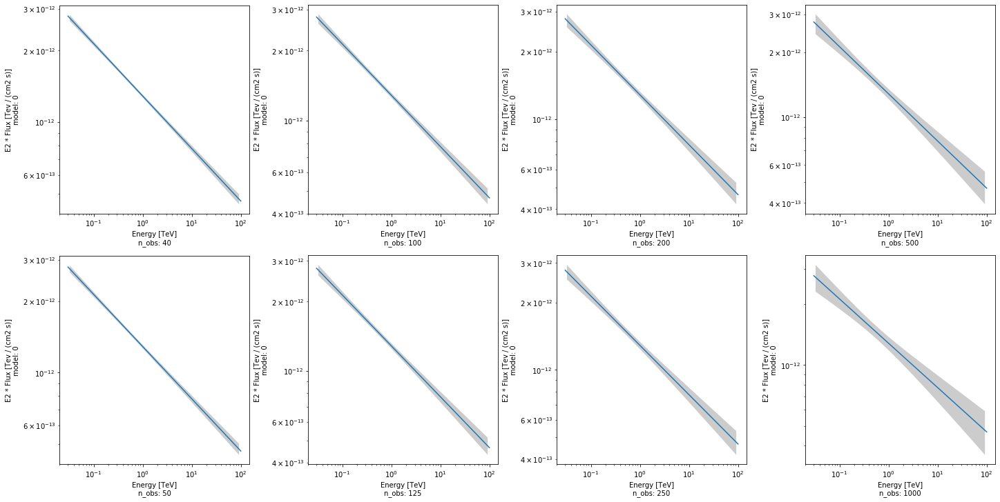

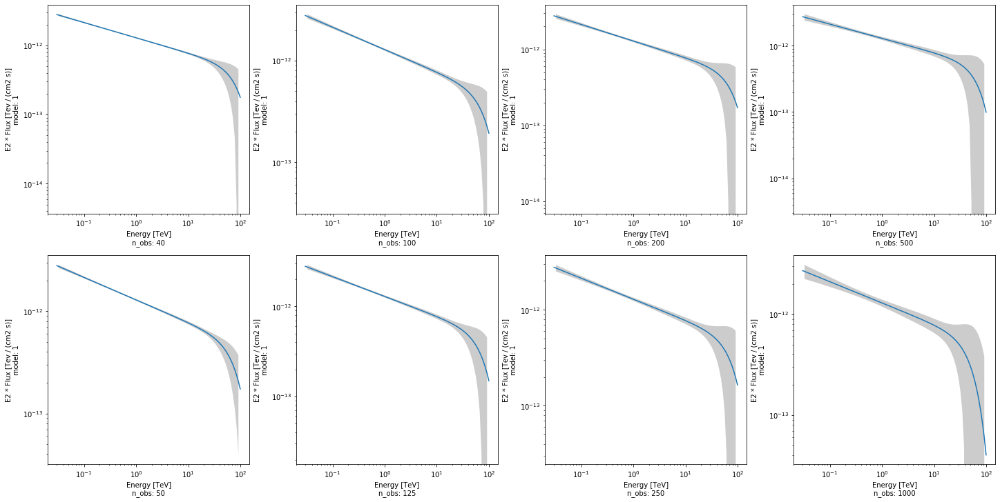

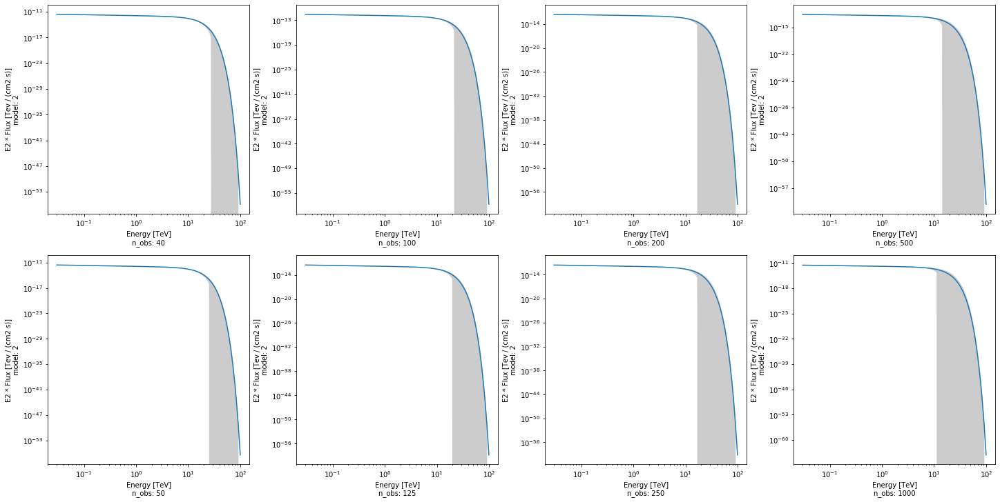

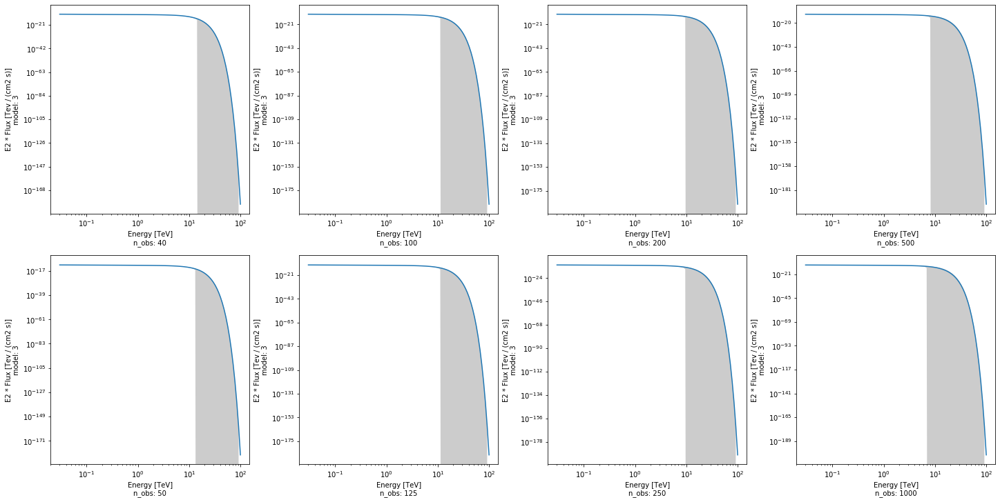

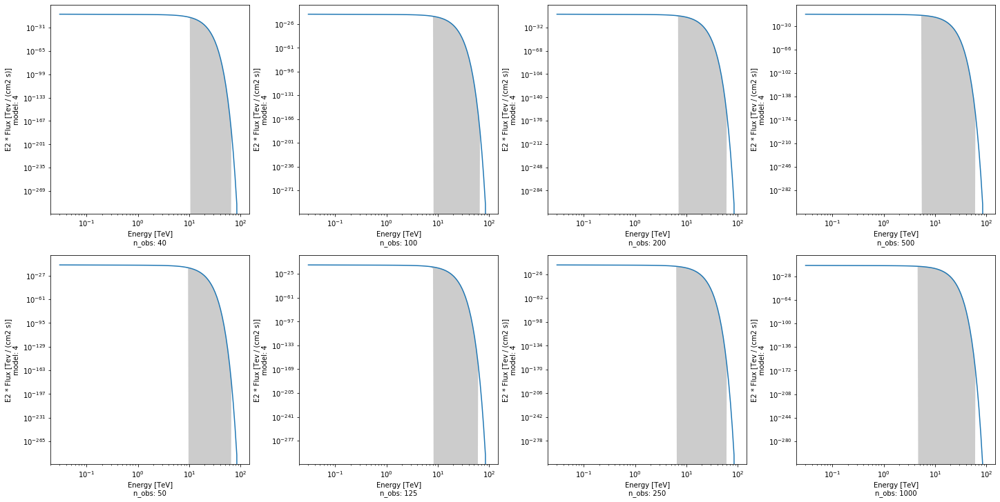

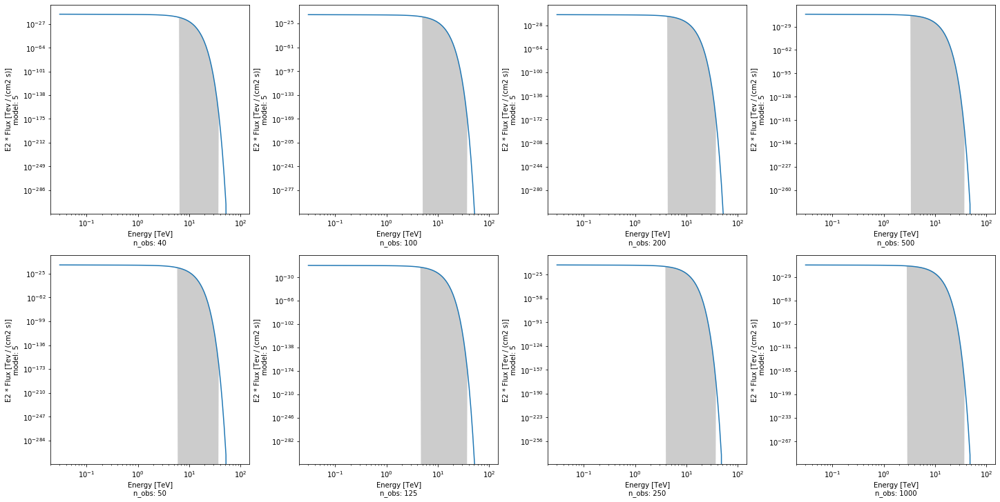

In [43]:
for i in range(6):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 4, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim_1[n][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim_1[n][i], covar=np.mean(covar_1[n][i], axis = 0),energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim_1[n+2][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim_1[n+2][i], covar=np.mean(covar_1[n+2][i], axis = 0),energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(2):
        ax = fig.add_subplot(gs3[n])
        sim_1[n+4][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim_1[n+4][i], covar=np.mean(covar_1[n+4][i], axis = 0),energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    gs4 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[3])
    for n in range(2):
        ax = fig.add_subplot(gs4[n])
        sim_1[n+6][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim_1[n+6][i], covar=np.mean(covar_1[n+6][i], axis = 0),energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+6]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {i}')

    plt.show()